# 🗓️ Week 10: Text as Data — Central Bank Communication
**DS202W: Data Science for Social Scientists**  
**Theme: NLP + Market Reactions | Dataset: Fed / ECB / BoE Meeting Minutes (2019–2024)**

**Date: 23 March 2026**  |  **Author: Dr Ghita Berrada**

---

*Three central banks. Six years. Four macro regimes. One question: does language move markets?*

This notebook has two acts. **Act I (W09 carry-over, ~20 min)** finishes last week's anomaly-detection content — the Isolation Forest threshold discussion, One-Class SVM, Autoencoders, and the method comparison. Code and outputs come directly from the W09 procurement notebook.

**Act II (W10 main content, ~85 min)** introduces a new domain and a full NLP pipeline applied to 144 central bank meeting minutes from three institutions across six years.

The transition is deliberate: both weeks ask *what is typical, and what is unusual?* — last week's raw material was structured tabular data; this week's is text.


## ⚙️ Setup

### Dependencies

```bash
pip install spacy wordcloud pyLDAvis bertopic sentence-transformers
python -m spacy download en_core_web_sm
```

> **BERTopic note:** requires `sentence-transformers`. Runs comfortably on CPU for 144 documents. The notebook fails gracefully if BERTopic is not installed.

### Data files

Place `central_bank_minutes.csv` and `yield_changes.csv` in a `data/` subfolder next to this notebook. Both are produced by `scraper.py`.


In [120]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
from tqdm import tqdm
from scipy import stats
import scipy.sparse as sp
from scipy.sparse import csr_matrix
from scipy.stats import chi2 as chi2_dist
from collections import Counter
from matplotlib.patches import Patch
import matplotlib.patches as mpatches

import spacy
from wordcloud import WordCloud

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD, LatentDirichletAllocation
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import TimeSeriesSplit
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.svm import SVC
import plotly.express as px
import plotly.graph_objects as go

from plotly.subplots import make_subplots
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset, random_split
# sklearn ships a Porter stemmer used internally by its text pipeline.
# The import path varies by version — we try both.
try:
    from sklearn.feature_extraction.text import CountVectorizer
    # Access the stemmer sklearn uses internally
    cv = CountVectorizer(analyzer='word')
    from sklearn.feature_extraction.text import _CountVectorizer
except Exception:
    pass

try:
    # sklearn >= 1.0
    from sklearn.feature_extraction._stop_words import ENGLISH_STOP_WORDS
    from sklearn.feature_extraction.text import strip_accents_ascii
except ImportError:
    pass

import nltk
nltk.download('punkt_tab', quiet=True)
from nltk.stem import PorterStemmer

import pyLDAvis
import pyLDAvis.lda_model
import pickle

warnings.filterwarnings('ignore')

# spaCy: disable components not needed for speed
nlp = spacy.load('en_core_web_sm', disable=['ner', 'parser'])

# Institution colour palette used consistently throughout the notebook
INST_COLOURS = {'Fed': '#1f4e79', 'ECB': '#EF9B0F', 'BoE': '#922b21'}
SEED = 42

print('Libraries loaded successfully.')


Libraries loaded successfully.


---
## W09 Carry-Over — Finishing Anomaly Detection

*All cells in this section use the W09 UK government procurement dataset. Run the cell below first to load the pre-computed objects saved at the end of the W09 notebook. If `data/w09_artefacts.pkl` does not exist yet, run the W09 notebook end-to-end and re-run that notebook's final "Save artefacts" cell.*

---


In [34]:
# ── Load W09 procurement artefacts ────────────────────────────────────────────
# Produced by the W09 notebook's final 'Save artefacts' cell.
# The autoencoder is retrained here rather than loaded — see section 0.3.

try:
    with open('../data/w09_artefacts.pkl', 'rb') as _f:
        _art = pickle.load(_f)

    model_df        = _art['model_df']
    X_reduced       = _art['X_reduced']
    X_umap          = _art['X_umap']
    iso             = _art['iso']
    ocsvm           = _art['ocsvm']
    TORCH_AVAILABLE = _art['torch_available']

    print('Loaded w09_artefacts.pkl')
    print(f'  Procurement contracts: {len(model_df):,}')
    print(f'  FAMD features:         {X_reduced.shape[1]}')
    print(f'  Score columns:         {[c for c in model_df.columns if "score" in c or "outlier" in c]}')
    print(f'  PyTorch available:     {TORCH_AVAILABLE}')
    W09_AVAILABLE = True

except FileNotFoundError:
    print('../data/w09_artefacts.pkl not found.')
    print('Run the W09 notebook end-to-end, then run its final Save artefacts cell.')
    W09_AVAILABLE = False
    TORCH_AVAILABLE = False

Loaded w09_artefacts.pkl
  Procurement contracts: 70,181
  FAMD features:         10
  Score columns:         ['lof_score', 'lof_outlier', 'iso_score', 'iso_outlier', 'ocsvm_score', 'ocsvm_outlier', 'ae_outlier']
  PyTorch available:     True


### 0.1 Isolation Forest: recap and choosing a threshold

Isolation Forest works on a deceptively simple insight: **anomalies are easier to isolate than normal points.**

Build a tree by repeatedly picking a random feature and a random split value within that feature's range, partitioning the data in two, and recursing. Keep going until each point sits alone in its own leaf. An anomalous contract — say, a £34M direct award lasting 1,460 days in a category where typical contracts are £50k for 90 days — has extreme values on multiple dimensions simultaneously. A single random split on contract value already separates it from most of the data. It reaches its leaf in very few steps.

A typical contract sits in the middle of a dense cluster. Many random splits are needed before it is separated from its neighbours. Its path to isolation is long.

Average this path length across hundreds of trees and you have the anomaly score: short average path = anomalous, long average path = normal. The algorithm never defines what "normal" looks like — it only measures how hard it is to isolate each point.

**Fitting Isolation Forest and reading its two outputs.**

Isolation Forest produces two things from a single fit, and it's worth being precise about what each one is.

`.predict()` returns a **binary label** — `+1` (normal) or `-1` (anomaly) — determined by the `contamination` parameter. Setting `contamination=0.05` tells the model to label approximately the top 5% of scores as anomalies. This is a threshold applied *after* the trees are built; it does not affect how the trees are constructed.

`.score_samples()` returns a **continuous score** for every observation. sklearn's convention is that higher values are *more normal*, so we negate it (`-iso.score_samples(...)`) to get a score where higher means *more anomalous*. This score is the object that actually contains the model's information — the binary label is just a convenience wrapper around a percentile cut on it.

The last four print statements make this relationship concrete. `score_threshold` is the minimum score among flagged contracts — equivalently, the exact cutoff that `contamination=0.05` placed on the score distribution. Comparing the mean scores of flagged vs. non-flagged contracts tells you how well-separated the two groups are: if the means are close, the threshold is cutting through a dense region and many borderline cases exist; if they are far apart, the anomalies form a clearly distinct upper tail.




In [13]:
iso = IsolationForest(
    n_estimators=200,
    contamination=0.05,
    max_samples="auto",
    random_state=SEED
)
iso.fit(X_reduced)

# Binary labels: -1 = anomaly, 1 = normal
iso_labels = iso.predict(X_reduced)

# Continuous anomaly scores: higher = more anomalous
iso_scores = -iso.score_samples(X_reduced)

model_df["iso_score"] = iso_scores
model_df["iso_outlier"] = iso_labels == -1

n_iso = model_df["iso_outlier"].sum()
share_iso = n_iso / len(model_df)

print(f"Isolation Forest flagged {n_iso:,} contracts ({share_iso:.1%})")

# Threshold corresponding to the contamination-based cutoff
score_threshold = model_df.loc[model_df["iso_outlier"], "iso_score"].min()

print(f"Lowest score among flagged anomalies: {score_threshold:.3f}")
print(f"Mean anomaly score (all contracts): {iso_scores.mean():.3f}")
print(f"Mean score among flagged anomalies: {model_df.loc[model_df['iso_outlier'], 'iso_score'].mean():.3f}")
print(f"Mean score among non-flagged contracts: {model_df.loc[~model_df['iso_outlier'], 'iso_score'].mean():.3f}")

Isolation Forest flagged 3,509 contracts (5.0%)
Lowest score among flagged anomalies: 0.537
Mean anomaly score (all contracts): 0.445
Mean score among flagged anomalies: 0.574
Mean score among non-flagged contracts: 0.438


Isolation Forest flagged **3,509 contracts**, corresponding to **5.0%** of the dataset. This is exactly what we would expect given `contamination=0.05`: the algorithm produces a continuous anomaly score for every contract, and then labels approximately the top 5% of those scores as anomalies.

This does **not** mean the model discovered that exactly 5% of contracts are truly anomalous. Rather, the contamination parameter forces the binary output to label roughly that share of observations as outliers.

The continuous scores are therefore more informative than the binary labels alone. Contracts with especially high scores are the strongest anomaly candidates, while those just above the threshold are more borderline cases.

We've now fitted Isolation Forest with `contamination=0.05`, which flags the top 5% of contracts as anomalies. The `contamination` parameter does not change how the trees are built: it only determines where `.predict()` places the cutoff on the continuous score distribution.

This means: **the threshold is a choice, not a discovery.** Three principled strategies:

| Strategy | Mechanism | When to use |
|---|---|---|
| **Contamination-based** | `contamination=p` flags the top p% by score | You have a prior on the true anomaly rate |
| **Percentile / elbow** | Plot sorted scores; look for a natural kink in the curve | No strong prior — let the distribution guide the cut |
| **Capacity-based** | `threshold = scores.nlargest(N).min()` | The audit team can investigate exactly N cases |

The plots below use the **real W09 Isolation Forest scores** from the procurement dataset.

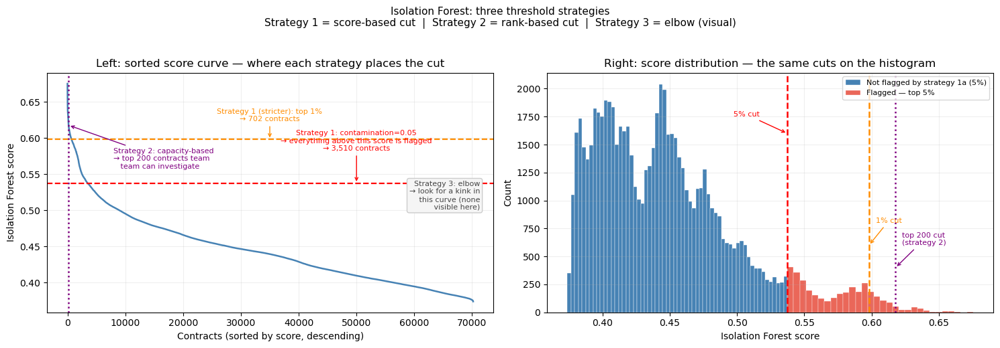

Practical code for each strategy:

# Strategy 1 — contamination-based (score cut)
threshold = model_df['iso_score'].quantile(0.95)

# Strategy 2 — capacity-based (rank cut)
top_n = 200
threshold = model_df['iso_score'].nlargest(top_n).min()

# Strategy 3 — elbow (inspect the curve, pick the kink visually)
plt.plot(np.sort(model_df['iso_score'].values)[::-1])
# No clear elbow in this dataset — the curve is smooth throughout.


In [22]:
# ── Isolation Forest threshold strategies — real W09 procurement scores ──────
if not W09_AVAILABLE:
    print('Skipped: W09 artefacts not loaded. See cell above.')
else:
    scores        = model_df['iso_score'].values
    sorted_scores = np.sort(scores)[::-1]

    t5   = np.percentile(scores, 95)   # strategy 1: contamination=0.05
    t1   = np.percentile(scores, 99)   # strategy 1 variant: top 1%
    t200 = sorted_scores[199]          # strategy 2: capacity-based (top 200)

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # ── Left: sorted score curve ──────────────────────────────────────────
    # Each strategy is a different way of placing a vertical or horizontal
    # cut on this curve. Annotate each cut directly so the logic is visible.

    axes[0].plot(sorted_scores, linewidth=1.8, color='steelblue')

    # Strategy 1a — contamination-based (horizontal cut at score level)
    axes[0].axhline(t5, color='red', linestyle='--', linewidth=1.6)
    axes[0].annotate(
        f'Strategy 1: contamination=0.05\n→ everything above this score is flagged\n→ {(scores>=t5).sum():,} contracts',
        xy=(50000, t5), xytext=(50000, t5 + 0.045),
        arrowprops=dict(arrowstyle='->', color='red'),
        color='red', fontsize=8, ha='center',
    )

    # Strategy 1b — top 1% variant
    axes[0].axhline(t1, color='darkorange', linestyle='--', linewidth=1.6)
    axes[0].annotate(
        f'Strategy 1 (stricter): top 1%\n→ {(scores>=t1).sum():,} contracts',
        xy=(35000, t1), xytext=(35000, t1 + 0.025),
        arrowprops=dict(arrowstyle='->', color='darkorange'),
        color='darkorange', fontsize=8, ha='center',
    )

    # Strategy 2 — capacity-based (vertical cut at rank)
    axes[0].axvline(199, color='purple', linestyle=':', linewidth=1.8)
    axes[0].annotate(
        f'Strategy 2: capacity-based\n→ top 200 contracts team\n   team can investigate',
        xy=(199, sorted_scores[199]), xytext=(8000, sorted_scores[199] - 0.06),
        arrowprops=dict(arrowstyle='->', color='purple'),
        color='purple', fontsize=8,
    )

    # Strategy 3 label — the elbow method is about reading this curve itself
    axes[0].text(
        0.97, 0.55,
        'Strategy 3: elbow\n→ look for a kink in\n   this curve (none\n   visible here)',
        transform=axes[0].transAxes, fontsize=8,
        color='#444', ha='right', va='top',
        bbox=dict(boxstyle='round,pad=0.3', fc='#f5f5f5', ec='#ccc'),
    )

    axes[0].set_xlabel('Contracts (sorted by score, descending)')
    axes[0].set_ylabel('Isolation Forest score')
    axes[0].set_title('Left: sorted score curve — where each strategy places the cut')
    axes[0].grid(alpha=0.2)

    # ── Right: histogram — shows what each cut means for the distribution ─
    axes[1].hist(scores[scores < t5],  bins=60, color='steelblue',
                 edgecolor='white', linewidth=0.3, label='Not flagged by strategy 1a (5%)')
    axes[1].hist(scores[scores >= t5], bins=30, color='#e74c3c',
                 edgecolor='white', linewidth=0.3, label='Flagged — top 5%', alpha=0.85)

    axes[1].axvline(t5, color='red',        linestyle='--', linewidth=1.8)
    axes[1].axvline(t1, color='darkorange', linestyle='--', linewidth=1.8)

    axes[1].annotate('5% cut', xy=(t5, 1600), xytext=(t5 - 0.04, 1750),
                     arrowprops=dict(arrowstyle='->', color='red'),
                     color='red', fontsize=8)
    axes[1].annotate('1% cut', xy=(t1, 600), xytext=(t1 + 0.005, 800),
                     arrowprops=dict(arrowstyle='->', color='darkorange'),
                     color='darkorange', fontsize=8)
    axes[1].axvline(t200, color='purple', linestyle=':', linewidth=1.8)
    axes[1].annotate('top 200 cut\n(strategy 2)', xy=(t200, 400), xytext=(t200 + 0.005, 600),
                     arrowprops=dict(arrowstyle='->', color='purple'),
                     color='purple', fontsize=8)

    axes[1].set_xlabel('Isolation Forest score')
    axes[1].set_ylabel('Count')
    axes[1].set_title('Right: score distribution — the same cuts on the histogram')
    axes[1].legend(fontsize=8, loc='upper right'); axes[1].grid(alpha=0.2)

    plt.suptitle(
        'Isolation Forest: three threshold strategies\n'
        'Strategy 1 = score-based cut  |  Strategy 2 = rank-based cut  |  Strategy 3 = elbow (visual)',
        y=1.03, fontsize=11
    )
    plt.tight_layout()
    plt.show()

    print('Practical code for each strategy:')
    print()
    print('# Strategy 1 — contamination-based (score cut)')
    print("threshold = model_df['iso_score'].quantile(0.95)")
    print()
    print('# Strategy 2 — capacity-based (rank cut)')
    print('top_n = 200')
    print("threshold = model_df['iso_score'].nlargest(top_n).min()")
    print()
    print('# Strategy 3 — elbow (inspect the curve, pick the kink visually)')
    print("plt.plot(np.sort(model_df['iso_score'].values)[::-1])")
    print("# No clear elbow in this dataset — the curve is smooth throughout.")

**Reading the plots.** The left panel shows the sorted score curve: every contract ordered from most to least anomalous. Each threshold strategy corresponds to a different way of cutting this curve — horizontally at a score level (strategies 1 and 2), vertically at a rank (strategy 2), or visually at a kink (strategy 3). The right panel shows the same cuts on the score histogram, making it clear how much of the distribution each strategy captures.

The key observation from this data: **there is no natural elbow**. The curve decays smoothly throughout. This means strategy 3 cannot find a principled cut here — there is no point where anomalies clearly separate from normal contracts. The choice between the 5% and 1% cuts (or the top-200 rank cut) is therefore a genuine policy decision, not something the data resolves for you.

### 0.2 One-Class SVM: key ideas

#### Recap: the standard (binary) SVM

Before introducing One-Class SVM, recall the standard SVM from earlier in the course. Both share the same geometric core but answer different questions.

**The maximum-margin hyperplane.** Given labelled data with two classes, an SVM finds the hyperplane that separates them with the **largest possible margin** — the gap between the decision boundary and the nearest points of each class. Those nearest points are the **support vectors**.

Why maximise the margin? A larger margin generalises better to unseen data — it means the decision boundary is as far from any training point as possible, reducing sensitivity to individual observations.

The SVM solves:

$$\min_{w, b}\; \frac{1}{2}\|w\|^2 \quad\text{subject to}\quad y_i(w \cdot x_i - b) \geq 1 \;\forall i$$

The margin is $2/\|w\|$. Minimising $\|w\|$ maximises it.


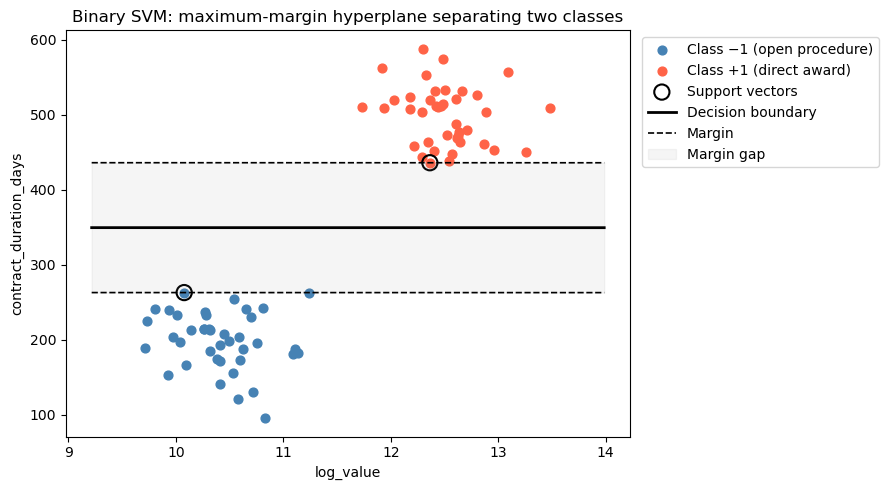

Margin width: 173.130
Support vectors: 2


In [23]:
# ── 2D illustration: binary SVM margin ───────────────────────────────────
np.random.seed(SEED)
# Two classes: low-value open contracts vs high-value direct awards
X_svm_pos = np.column_stack([np.random.normal(10.5, 0.4, 40),
                              np.random.normal(200, 40, 40)])
X_svm_neg = np.column_stack([np.random.normal(12.5, 0.4, 40),
                              np.random.normal(500, 40, 40)])
X_svm = np.vstack([X_svm_pos, X_svm_neg])
y_svm = np.array([-1]*40 + [1]*40)

svc = SVC(kernel="linear", C=1.0)
svc.fit(X_svm, y_svm)

# Decision boundary and margins
w = svc.coef_[0]; b = svc.intercept_[0]
xx = np.linspace(X_svm[:,0].min()-0.5, X_svm[:,0].max()+0.5, 300)
yy_boundary = (-w[0]*xx - b) / w[1]
yy_margin_p  = (-w[0]*xx - b + 1) / w[1]
yy_margin_n  = (-w[0]*xx - b - 1) / w[1]

fig, ax = plt.subplots(figsize=(9, 5))
ax.scatter(X_svm_pos[:,0], X_svm_pos[:,1], color="steelblue", s=40, label="Class −1 (open procedure)")
ax.scatter(X_svm_neg[:,0], X_svm_neg[:,1], color="tomato",    s=40, label="Class +1 (direct award)")
ax.scatter(svc.support_vectors_[:,0], svc.support_vectors_[:,1],
           s=120, edgecolors="black", facecolors="none", linewidths=1.5, label="Support vectors")
ax.plot(xx, yy_boundary, "k-",  linewidth=2,   label="Decision boundary")
ax.plot(xx, yy_margin_p, "k--", linewidth=1.2, label="Margin")
ax.plot(xx, yy_margin_n, "k--", linewidth=1.2)
ax.fill_between(xx, yy_margin_n, yy_margin_p, alpha=0.08, color="grey", label="Margin gap")
ax.set_xlabel("log_value"); ax.set_ylabel("contract_duration_days")
ax.set_title("Binary SVM: maximum-margin hyperplane separating two classes")
ax.legend(bbox_to_anchor=(1.01, 1)); plt.tight_layout(); plt.show()

print(f"Margin width: {2/np.linalg.norm(w):.3f}")
print(f"Support vectors: {len(svc.support_vectors_)}")


#### The kernel trick

When classes are not linearly separable in the original feature space, the **kernel trick** implicitly maps the data to a higher-dimensional space where linear separation is possible — without ever explicitly computing the high-dimensional coordinates.

The **RBF (radial basis function) kernel** is the most common:

$$K(x, x') = \exp\left(-\gamma \|x - x'\|^2\right)$$

Intuitively: two points have high kernel similarity if they are close together. The parameter $\gamma$ controls how quickly similarity decays with distance.

#### One-Class SVM — the key difference

In the binary SVM, the decision boundary separates two labelled groups — each group pulls the boundary toward itself until the maximum-margin position is found. In One-Class SVM there is only one group: the normal contracts. With no second class to push against, the algorithm needs a different reference point.

The choice is to use the **origin** of the kernel-transformed space. In the RBF kernel, a point's coordinates are determined entirely by its similarity to other points — the origin represents a location with zero similarity to any training example. It is, in a precise sense, the most "foreign" location in the space relative to the training data. Separating the training data from the origin with maximum margin is therefore equivalent to finding the tightest enclosure around the region of feature space that the normal contracts occupy. A new contract that falls on the origin side of the boundary — in a region of feature space that was empty during training — is flagged as an anomaly.

Formally:

$$\min_{w, \xi, \rho}\; \frac{1}{2}\|w\|^2 - \rho + \frac{1}{\nu n}\sum_i \xi_i \quad\text{s.t.}\quad w\cdot\phi(x_i) \geq \rho - \xi_i,\;\xi_i \geq 0$$

The decision function $f(x) = w \cdot \phi(x) - \rho$ gives the signed distance from the boundary:
- $f(x) > 0$: on the training data side → **normal**
- $f(x) < 0$: on the origin side → **anomaly**

The two plots below make this concrete.

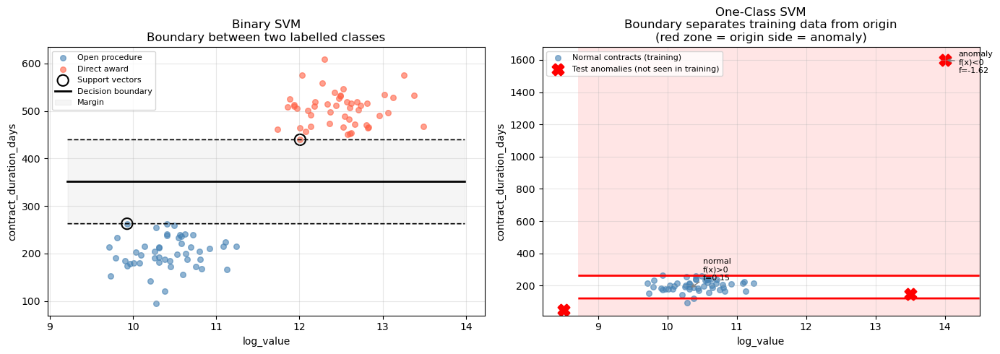

In [25]:
# ── Binary SVM vs One-Class SVM — side by side illustration ──────────────
np.random.seed(SEED)

# Binary case: two classes (open procedure vs direct award)
X_open   = np.column_stack([np.random.normal(10.5, 0.4, 50),
                             np.random.normal(200,  40,  50)])
X_direct = np.column_stack([np.random.normal(12.5, 0.4, 50),
                             np.random.normal(500,  40,  50)])
X_bin    = np.vstack([X_open, X_direct])
y_bin    = np.array([-1]*50 + [1]*50)

svc = SVC(kernel="linear", C=1.0)
svc.fit(X_bin, y_bin)

# One-class case: only normal contracts (open procedure)
X_normal  = X_open.copy()
X_anomaly = np.array([[14.0, 1600], [8.5, 50], [13.5, 150]])
ocsvm_demo = OneClassSVM(kernel="rbf", nu=0.05, gamma="scale")
ocsvm_demo.fit(X_normal)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ── Left: Binary SVM ──────────────────────────────────────────────────────
w  = svc.coef_[0]; b = svc.intercept_[0]
xx = np.linspace(X_bin[:,0].min()-0.5, X_bin[:,0].max()+0.5, 300)
yy_boundary = (-w[0]*xx - b) / w[1]
yy_margin_p  = (-w[0]*xx - b + 1) / w[1]
yy_margin_n  = (-w[0]*xx - b - 1) / w[1]

axes[0].scatter(X_open[:,0],   X_open[:,1],   color="steelblue", s=30,
                alpha=0.6, label="Open procedure")
axes[0].scatter(X_direct[:,0], X_direct[:,1], color="tomato",    s=30,
                alpha=0.6, label="Direct award")
axes[0].scatter(svc.support_vectors_[:,0], svc.support_vectors_[:,1],
                s=120, edgecolors="black", facecolors="none",
                linewidths=1.5, label="Support vectors")
axes[0].plot(xx, yy_boundary, "k-",  linewidth=2,   label="Decision boundary")
axes[0].plot(xx, yy_margin_p, "k--", linewidth=1.2)
axes[0].plot(xx, yy_margin_n, "k--", linewidth=1.2)
axes[0].fill_between(xx, yy_margin_n, yy_margin_p,
                     alpha=0.08, color="grey", label="Margin")
axes[0].set_xlabel("log_value"); axes[0].set_ylabel("contract_duration_days")
axes[0].set_title("Binary SVM\nBoundary between two labelled classes")
axes[0].legend(fontsize=8, loc="upper left"); axes[0].grid(True, alpha=0.3)

# ── Right: One-Class SVM ──────────────────────────────────────────────────
x1_oc = np.linspace(X_normal[:,0].min()-1, X_anomaly[:,0].max()+0.5, 250)
x2_oc = np.linspace(X_normal[:,1].min()-80, X_anomaly[:,1].max()+80, 250)
XX_oc, YY_oc = np.meshgrid(x1_oc, x2_oc)
ZZ_oc = ocsvm_demo.decision_function(
    np.c_[XX_oc.ravel(), YY_oc.ravel()]
).reshape(XX_oc.shape)

axes[1].contourf(XX_oc, YY_oc, ZZ_oc, levels=[-np.inf, 0],
                 colors=["#ffcccc"], alpha=0.5)
axes[1].contour(XX_oc, YY_oc, ZZ_oc, levels=[0],
                colors=["red"], linewidths=2)
axes[1].scatter(X_normal[:,0], X_normal[:,1],
                color="steelblue", s=30, alpha=0.6,
                label="Normal contracts (training)")
axes[1].scatter(X_anomaly[:,0], X_anomaly[:,1],
                color="red", s=120, marker="X", linewidths=2,
                label="Test anomalies (not seen in training)")
for pt, offset in [(X_normal[10], (0.2, 50)), (X_anomaly[0], (0.2, -80))]:
    dv = ocsvm_demo.decision_function(pt.reshape(1,-1))[0]
    side = "normal\nf(x)>0" if dv > 0 else "anomaly\nf(x)<0"
    axes[1].annotate(f"{side}\nf={dv:.2f}", pt,
                     xytext=(pt[0]+offset[0], pt[1]+offset[1]),
                     fontsize=8,
                     arrowprops=dict(arrowstyle="->", color="grey", lw=1))
axes[1].set_xlabel("log_value"); axes[1].set_ylabel("contract_duration_days")
axes[1].set_title("One-Class SVM\nBoundary separates training data from origin\n"
                  "(red zone = origin side = anomaly)")
axes[1].legend(fontsize=8, loc="upper left"); axes[1].grid(True, alpha=0.3)

plt.tight_layout(); plt.show()

**Reading the comparison plot.**

The left panel shows the binary SVM: the boundary sits in the gap *between* the two classes, with support vectors from both sides defining the margin. The right panel shows One-Class SVM: the boundary encloses the training data, with the red-shaded region representing the origin side where anomalies land. The three test anomalies (red ×) were not seen during training — the algorithm correctly places them outside the boundary because they occupy regions of feature space that were empty in the training data.

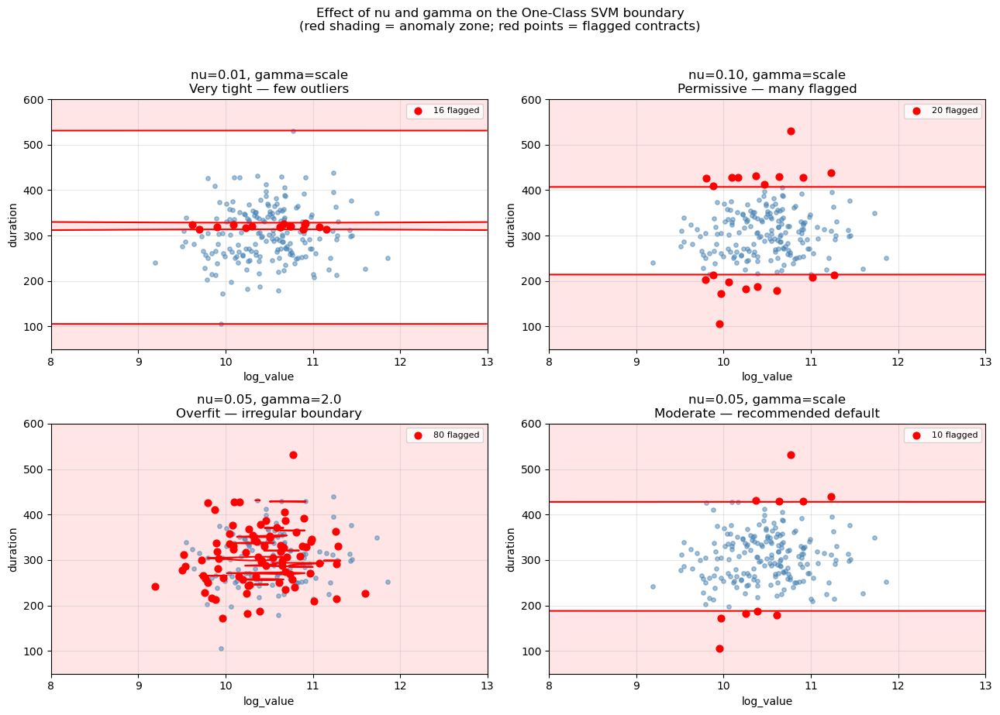

In [26]:
# ── Effect of nu and gamma on the One-Class SVM boundary ─────────────────
np.random.seed(SEED)
X_oc = np.column_stack([np.random.normal(10.5, 0.5, 200),
                         np.random.normal(300,  60,  200)])

x1g = np.linspace(8, 13, 200)
x2g = np.linspace(50, 600, 200)
XX_g, YY_g = np.meshgrid(x1g, x2g)
grid = np.c_[XX_g.ravel(), YY_g.ravel()]

configs = [
    (0.01, "scale", "nu=0.01, gamma=scale\nVery tight — few outliers"),
    (0.10, "scale", "nu=0.10, gamma=scale\nPermissive — many flagged"),
    (0.05, 2.0,     "nu=0.05, gamma=2.0\nOverfit — irregular boundary"),
    (0.05, "scale", "nu=0.05, gamma=scale\nModerate — recommended default"),
]

fig, axes = plt.subplots(2, 2, figsize=(13, 9))
for ax, (nu, gamma, title) in zip(axes.ravel(), configs):
    clf = _OneClassSVM(kernel="rbf", nu=nu, gamma=gamma)
    clf.fit(X_oc)
    ZZ = clf.decision_function(grid).reshape(XX_g.shape)
    ax.contourf(XX_g, YY_g, ZZ, levels=[-np.inf, 0],
                colors=["#ffcccc"], alpha=0.5)
    ax.contour(XX_g, YY_g, ZZ, levels=[0], colors=["red"], linewidths=1.5)
    ax.scatter(X_oc[:,0], X_oc[:,1], color="steelblue", s=15, alpha=0.5)
    outliers = X_oc[clf.predict(X_oc) == -1]
    if len(outliers) > 0:
        ax.scatter(outliers[:,0], outliers[:,1],
                   color="red", s=40, zorder=5,
                   label=f"{len(outliers)} flagged")
        ax.legend(fontsize=8)
    ax.set_xlabel("log_value"); ax.set_ylabel("duration")
    ax.set_title(title); ax.grid(True, alpha=0.3)

plt.suptitle("Effect of nu and gamma on the One-Class SVM boundary\n"
             "(red shading = anomaly zone; red points = flagged contracts)",
             y=1.02, fontsize=12)
plt.tight_layout(); plt.show()


**Reading the parameter plot.**

- **Top-left (nu=0.01):** tight boundary — very few points flagged, only the most isolated.
- **Top-right (nu=0.10):** loose boundary — many points flagged, including borderline cases.
- **Bottom-left (nu=0.05, gamma=2.0):** high gamma makes each training point's influence narrow. The boundary wraps tightly around individual training points rather than the overall distribution, creating gaps between clusters that are incorrectly treated as anomaly zones. This is overfitting.
- **Bottom-right (nu=0.05, gamma=scale):** the recommended default. The boundary is smooth and follows the overall distribution rather than individual points.


#### Parameter guidance

**`nu` (ν)** — simultaneously an upper bound on the fraction of anomalies and a lower bound on the fraction of support vectors:
- `nu = 0.01`: very tight — only extreme outliers flagged
- `nu = 0.05`: ~5% of contracts outside the boundary
- `nu = 0.15`: permissive — many borderline cases flagged
- **Rule of thumb:** start at 0.05; if you expect fewer than 5% of contracts to be genuinely anomalous (reasonable for a large public dataset), start lower.

**`gamma`** — RBF kernel width:
- High gamma → each training point has narrow influence → complex, irregular boundary → overfitting (bottom-left panel above)
- Low gamma → broad influence → smooth, generalised boundary
- `gamma = "scale"` (1 / (n_features × Var(X))) is the safe default for scaled data

| `nu` | `gamma` | Effect |
|---|---|---|
| 0.01 | scale | Tight: only extreme outliers |
| 0.05 | scale | Moderate: ~5% flagged — recommended default |
| 0.15 | scale | Permissive: many borderline cases |
| Any | high value | Overfits: gaps between training points become anomaly zones |

**Practical note:** One-Class SVM kernel computations scale as O(n²) — slow on large datasets. We always fit it on the FAMD-reduced space rather than the raw feature matrix.


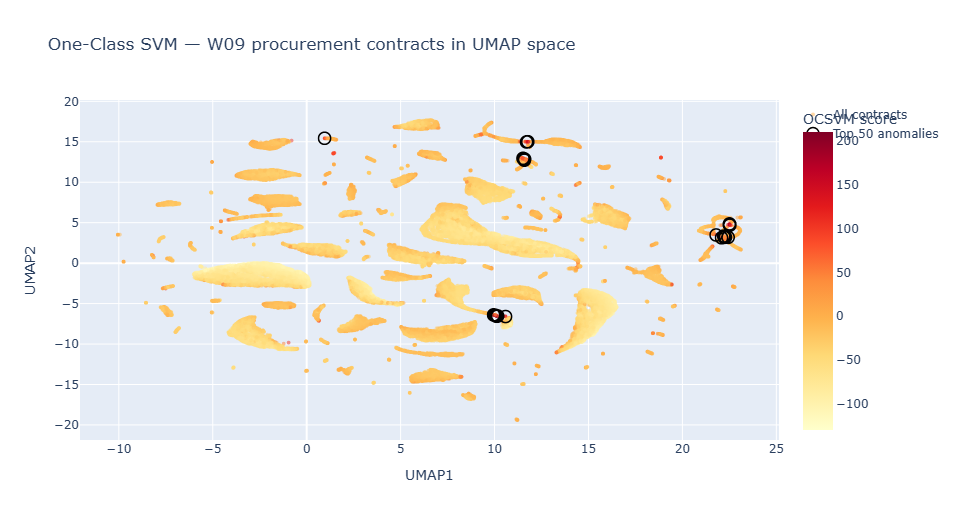

One-Class SVM flagged 3,565 contracts (5.1%) as anomalies


In [28]:
# ── One-Class SVM — real W09 results in UMAP space ────────────────────────────
# Shows the continuous OCSVM score projected into UMAP space.
# Top 50 anomalies are outlined in black.

if not W09_AVAILABLE:
    print('Skipped: W09 artefacts not loaded.')
else:
    scores_oc = model_df['ocsvm_score'].values
    top_mask  = np.zeros(len(scores_oc), dtype=bool)
    top_mask[np.argsort(scores_oc)[-50:]] = True

    fig = _go.Figure()
    fig.add_trace(go.Scattergl(
        x=X_umap[:, 0], y=X_umap[:, 1], mode='markers',
        marker=dict(color=scores_oc, colorscale='YlOrRd', size=4, opacity=0.5,
                    colorbar=dict(title='OCSVM score'), showscale=True),
        name='All contracts',
        customdata=np.column_stack([
            model_df['buyer_name'].values, model_df['tender_title'].values,
            model_df['tender_procurementMethod'].values, np.round(scores_oc, 3),
        ]),
        hovertemplate=(
            '<b>%{customdata[1]}</b><br>Buyer: %{customdata[0]}<br>'
            'Method: %{customdata[2]}<br>OCSVM score: %{customdata[3]}<extra></extra>'
        ),
    ))
    fig.add_trace(_go.Scattergl(
        x=X_umap[top_mask, 0], y=X_umap[top_mask, 1], mode='markers',
        marker=dict(color='rgba(0,0,0,0)', size=12,
                    line=dict(color='black', width=1.5)),
        name='Top 50 anomalies',
    ))
    fig.update_layout(
        title='One-Class SVM — W09 procurement contracts in UMAP space',
        xaxis_title='UMAP1', yaxis_title='UMAP2', height=520, width=900
    )
    fig.show()

    n_ocsvm = model_df['ocsvm_outlier'].sum()
    print(f'One-Class SVM flagged {n_ocsvm:,} contracts '
          f'({n_ocsvm/len(model_df):.1%}) as anomalies')


**Reading the plot.** Colour represents the OCSVM anomaly score (yellow = low, red = high). The score is the signed distance from the learned boundary: contracts deep inside the normal region have negative signed distances (shown here as high values after negation), while those outside the boundary have the highest anomaly scores.

The outlined points (top 50) cluster at the edges of the UMAP embedding — contracts whose feature profiles sit far from the dense core of the distribution. Compare their locations with the Isolation Forest top-50 from last week's notebook: do the two methods agree on which contracts are most anomalous? Disagreement is informative: it means one method is detecting a type of anomaly the other is missing.


### 0.3 Autoencoders — key ideas

All four anomaly detection methods we've seen so far — DBSCAN, LOF, Isolation Forest, and One-Class SVM — detect anomalies using structure in the observed feature space, whether through density, distance, isolation, or kernel-based separation. Autoencoders introduce a different idea: **learn the regular patterns in the data by compressing and reconstructing them, then treat poor reconstruction as evidence that an observation is unusual.**

#### Conceptual foundation

An autoencoder is a neural network made of two parts:

* **Encoder**: maps the input $x$ to a lower-dimensional latent representation $z$
* **Decoder**: reconstructs the input $\hat{x}$ from that latent representation

$$
x \xrightarrow{\text{encoder}} z \xrightarrow{\text{decoder}} \hat{x}
$$

Training aims to make the reconstruction \$hat{x}$ as close as possible to the original input $x$. For continuous inputs, this is often done by minimising the **reconstruction error**, such as mean squared error:

$$
\mathcal{L} = \frac{1}{n} \sum_{i=1}^{n} | x_i - \hat{x}_i |^2
$$

The intuition is as follows. If the network is trained mainly on typical contracts, it learns a compressed representation that captures the main regularities in the data. Contracts that follow those regular patterns can usually be reconstructed well. Contracts with unusual combinations of features are often reconstructed less accurately, because they do not fit the patterns the model has learned well. In that sense, **higher reconstruction error suggests that a contract is more anomalous**.

This does **not** mean that every high-error contract is fraudulent. It means that the contract is harder for the model to represent using the dominant structure learned from the training data.

#### How this differs from the autoencoder in Week 7

In Week 7, we used autoencoders mainly for **dimensionality reduction**: the goal was to learn a compact latent representation (z) that could then be used for visualisation or downstream modelling.

Here, the role of the autoencoder is different:

* the latent representation is still useful, but it is **not the main output of interest**;
* the main objective is to learn a reconstruction model for typical patterns in the data;
* the quantity we use as the anomaly score is the **reconstruction error**, not the latent coordinates themselves.

So the same model family is being used for a different purpose. In Week 7, the emphasis was on **representation learning**. Here, the emphasis is on **detecting observations that reconstruct unusually badly**.

#### Architecture choices for anomaly detection

There is no single “correct” architecture for an anomaly-detection autoencoder, but some choices are more sensible than others for tabular data.

| Hyperparameter   | Guidance                                                                        | What happens if you get it wrong                                                                                                                                                |
| ---------------- | ------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| Latent dimension | Often around (d/4) to (d/2) of the input dimension as a starting point          | Too large → model may reconstruct almost everything well, reducing anomaly contrast. Too small → model under-compresses the structure and reconstructs even normal points badly |
| Depth            | For tabular data, 2–3 hidden layers is often enough                             | Too shallow → model may underfit. Too deep or too flexible → model may reconstruct unusual observations too well, weakening the anomaly signal                                  |
| Activation       | ReLU in hidden layers; linear output for continuous inputs                      | Sigmoid output restricts predictions to ((0,1)), so it is only appropriate if features are scaled to that range                                                                 |
| Epochs           | Train until performance stabilises; often a few hundred epochs for tabular data | Too few → model underfits and reconstruction errors stay high for everyone. Too many → model may start fitting idiosyncrasies rather than broad structure                       |
| Learning rate    | `1e-3` is a common and sensible Adam starting point                             | Too high → unstable optimisation. Too low → convergence is very slow                                                                                                            |

**Why latent dimension matters.** The latent dimension needs to be small enough to force the model to learn a compressed summary of the regular structure in the data. If the bottleneck is too wide, the model can approximate the input too easily and reconstruction errors may become uniformly low, making anomalies harder to distinguish. If the bottleneck is too narrow, the model may fail to reconstruct even normal contracts properly.

So the goal is not to minimise the latent dimension as much as possible, but to find a bottleneck that preserves the main structure of typical contracts while still making unusual ones harder to reconstruct.

**Training-curve diagnostics.** Always inspect the loss over epochs. A healthy training curve usually decreases smoothly and then levels off. However, training loss alone is not enough to diagnose overfitting. If possible, also track a **validation reconstruction loss**. If training loss keeps falling while validation loss stops improving or begins to rise, that is stronger evidence that the model is starting to overfit.

**Threshold setting for anomaly detection.** Reconstruction errors are often right-skewed: many observations reconstruct well, while a smaller number have noticeably larger errors. A useful workflow is:

1. Plot the distribution or sorted values of reconstruction error
2. Look for a steep upper tail or a visible change in slope
3. Use this together with a percentile-based rule, such as the 95th or 99th percentile, to define a candidate threshold

In practice, the “elbow” in a sorted error curve is often only approximate, so percentile-based thresholds are usually easier to justify and reproduce.




Input dim: 10,  Latent dim: 2


Training: 100%|██████████████████████████████████████████████████████████████████████| 700/700 [12:04<00:00,  1.04s/it]


Final train loss: 0.08835
Final val loss:   0.08858
Gap:              0.00022  (healthy — losses track closely)


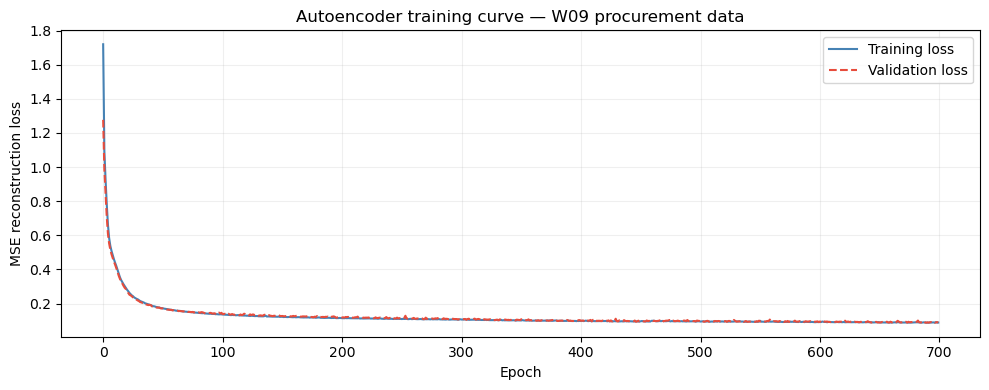

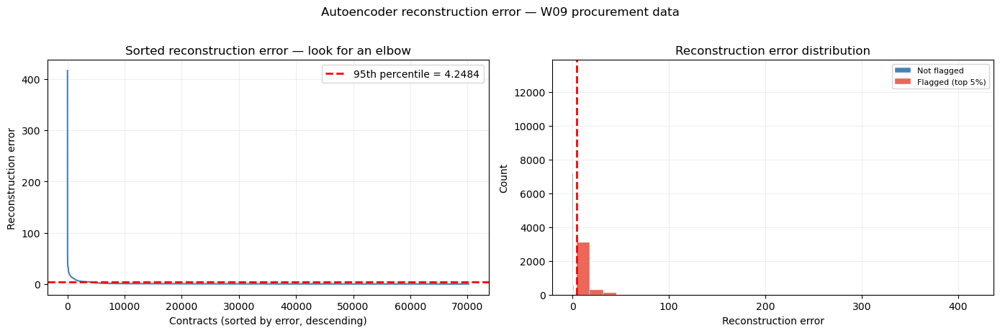

Flagged 3,512 contracts (5.0%) using 95th-percentile threshold


In [35]:
# ── Train autoencoder on W09 X_reduced ────────────────────────────────────────

if not W09_AVAILABLE:
    print('Skipped: W09 artefacts not loaded. See cell above.')
elif not TORCH_AVAILABLE:
    print('Skipped: PyTorch not available. Install with: pip install torch')
else:
    torch.manual_seed(SEED)

    X_tensor   = torch.tensor(X_reduced, dtype=torch.float32)
    input_dim  = X_reduced.shape[1]
    latent_dim = max(2, input_dim // 4)
    print(f'Input dim: {input_dim},  Latent dim: {latent_dim}')

    # ── Architecture ──────────────────────────────────────────────────────────
    class ProcurementAE(nn.Module):
        def __init__(self):
            super().__init__()
            self.encoder = nn.Sequential(
                nn.Linear(input_dim, 32), nn.ReLU(),
                nn.Linear(32, 16),        nn.ReLU(),
                nn.Linear(16, latent_dim),
            )
            self.decoder = nn.Sequential(
                nn.Linear(latent_dim, 16), nn.ReLU(),
                nn.Linear(16, 32),         nn.ReLU(),
                nn.Linear(32, input_dim),
            )
        def forward(self, x):
            return self.decoder(self.encoder(x))

    # ── 80/20 train/val split ─────────────────────────────────────────────────
    n_val    = int(0.2 * len(X_tensor))
    n_train  = len(X_tensor) - n_val
    train_ds, val_ds = random_split(
        TensorDataset(X_tensor), [n_train, n_val],
        generator=torch.Generator().manual_seed(SEED)
    )
    train_loader = DataLoader(train_ds, batch_size=256, shuffle=True)

    # Pre-load the full validation set as a single tensor — avoids per-batch
    # overhead in the val loop and is fine since val set fits in memory easily
    X_val = torch.stack([val_ds[i][0] for i in range(len(val_ds))])

    # ── Training loop ─────────────────────────────────────────────────────────
    model_ae  = ProcurementAE()
    optimiser = torch.optim.Adam(model_ae.parameters(), lr=1e-3)
    loss_fn   = nn.MSELoss()
    EPOCHS    = 700
    train_losses, val_losses = [], []

    for epoch in tqdm(range(EPOCHS), desc='Training'):
        model_ae.train()
        batch_losses = []
        for (batch,) in train_loader:
            optimiser.zero_grad()
            loss = loss_fn(model_ae(batch), batch)
            loss.backward()
            optimiser.step()
            batch_losses.append(loss.item())
        train_losses.append(np.mean(batch_losses))

        # Single forward pass on the full val tensor — much faster than looping
        model_ae.eval()
        with torch.no_grad():
            val_losses.append(loss_fn(model_ae(X_val), X_val).item())

    print(f'Final train loss: {train_losses[-1]:.5f}')
    print(f'Final val loss:   {val_losses[-1]:.5f}')
    gap = val_losses[-1] - train_losses[-1]
    print(f'Gap:              {gap:.5f}  '
          f'({"overfitting — val loss diverges from train" if gap > 0.01 else "healthy — losses track closely"})')

    # ── Training curve ────────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(train_losses, linewidth=1.5, color='steelblue', label='Training loss')
    ax.plot(val_losses,   linewidth=1.5, color='#e74c3c',
            linestyle='--', label='Validation loss')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('MSE reconstruction loss')
    ax.set_title('Autoencoder training curve — W09 procurement data')
    ax.legend(); ax.grid(alpha=0.2)
    plt.tight_layout(); plt.show()

    # ── Reconstruction errors ─────────────────────────────────────────────────
    model_ae.eval()
    with torch.no_grad():
        recon = model_ae(X_tensor).numpy()

    ae_errors    = np.sum((X_reduced - recon) ** 2, axis=1)
    threshold_ae = np.percentile(ae_errors, 95)

    sorted_errors = np.sort(ae_errors)[::-1]
    fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))

    axes[0].plot(sorted_errors, linewidth=1.5, color='steelblue')
    axes[0].axhline(threshold_ae, color='red', linestyle='--', linewidth=2,
                    label=f'95th percentile = {threshold_ae:.4f}')
    axes[0].set_xlabel('Contracts (sorted by error, descending)')
    axes[0].set_ylabel('Reconstruction error')
    axes[0].set_title('Sorted reconstruction error — look for an elbow')
    axes[0].legend(); axes[0].grid(alpha=0.2)

    axes[1].hist(ae_errors[ae_errors < threshold_ae], bins=60,
                 color='steelblue', edgecolor='white', linewidth=0.3,
                 label='Not flagged')
    axes[1].hist(ae_errors[ae_errors >= threshold_ae], bins=30,
                 color='#e74c3c', edgecolor='white', linewidth=0.3,
                 label='Flagged (top 5%)', alpha=0.85)
    axes[1].axvline(threshold_ae, color='red', linestyle='--', linewidth=2)
    axes[1].set_xlabel('Reconstruction error')
    axes[1].set_ylabel('Count')
    axes[1].set_title('Reconstruction error distribution')
    axes[1].legend(fontsize=8); axes[1].grid(alpha=0.2)

    plt.suptitle('Autoencoder reconstruction error — W09 procurement data',
                 y=1.02, fontsize=12)
    plt.tight_layout(); plt.show()

    n_ae = (ae_errors >= threshold_ae).sum()
    print(f'Flagged {n_ae:,} contracts ({n_ae/len(ae_errors):.1%}) '
          f'using 95th-percentile threshold')

**Reading the training curve.** The loss drops steeply in the first ~50 epochs as the model learns the dominant structure in the procurement data, then flattens and stabilises. The training and validation curves are almost indistinguishable throughout — a gap of 0.00022 at the end is negligible. This tells us the model has not memorised the training contracts; it has learned patterns that generalise to held-out data. That matters for anomaly detection: if the model had overfit, it might reconstruct *everything* well, including anomalies, making the reconstruction error useless as a signal.

**Reading the reconstruction error plots.** The sorted error curve (bottom left) has a pronounced spike at the far left — a small number of contracts with errors in the hundreds — before dropping sharply and flattening near zero for the vast majority. This is the shape we want to see: most contracts reconstruct well because they follow the regular patterns the model has learned, while a small upper tail does not. There is a clear elbow here, which is not always the case with real data.

The histogram (bottom right) makes the same point from a different angle. The distribution is heavily concentrated near zero, with a long right tail. The 95th-percentile threshold of 4.25 sits well into that tail — the flagged contracts (red) are not borderline cases just above an arbitrary cut, but a genuinely distinct group with reconstruction errors an order of magnitude larger than the bulk of the data.

The extreme outliers at the very top — errors above 100 — are worth investigating first. A contract that reconstructs this badly has a feature profile so unusual that the model, trained on 70,000 contracts, essentially has no idea what to do with it.

### 0.4 Method comparison summary

The full consensus analysis — which contracts are flagged by multiple methods simultaneously — is in Parts 10 and 11 of the W09 notebook. Here is the summary table:

| Method | Core idea | Score type | Scales to large N | Key parameter |
|---|---|---|---|---|
| DBSCAN noise | Points outside all dense regions | Binary | Medium | ε, min_samples |
| LOF | Local density comparison with neighbours | Continuous (>1 = anomaly) | Slow | n_neighbors |
| Isolation Forest | Isolation by random recursive splitting | Continuous (0–1) | Fast | contamination |
| One-Class SVM | Distance from the learned boundary | Continuous (signed) | Slow | nu, gamma |
| Autoencoder | Reconstruction error through a bottleneck | Continuous (≥0) | Medium | latent_dim, epochs |

**Practical guidance:**
- Start with **Isolation Forest** for quick screening — fast, parameter-light, interpretable.
- Add **LOF** when you need local anomaly detection (unusual *relative to similar neighbours*).
- Use **Autoencoders** when anomalies involve subtle feature combinations.
- **Consensus** (flagged by 2+ methods) = strongest candidates for investigation.

---

*With that, we close the anomaly detection chapter. The same question — what is typical, what is unusual? — carries forward. The difference is that the raw material is now text.*

---


## PART 1 — The Domain and the Data

### 1.1 Why central bank minutes?

Central banks are among the most consequential communicators in the global economy. When the Federal Reserve, the European Central Bank, or the Bank of England release their meeting minutes, traders, economists, and governments read every word. A single phrase — *"data-dependent"*, *"transitory"*, *"determined"* — can move bond markets by tens of basis points within seconds.

This makes central bank minutes an ideal text dataset for social scientists:

**Rich, structured text.** Each document records committee deliberations written in a consistent institutional register over years. Vocabulary varies enough across meetings and institutions to make NLP methods interesting, but consistently enough to make comparisons meaningful.

**Four distinct macro regimes in our window (2019–2024):**

```mermaid
timeline
    title The macro cycle in language (2019-2024)
    2019 : Late-cycle normalcy : Cautious, balanced. Gradual easing begins.
    2020-2021 : COVID shock + QE : Emergency, unprecedented, asset purchases, downside risk
    2022 : Inflation surge + pivot : Energy prices, supply chain, front-loading, determination
    2023-2024 : Hiking cycle then cuts : Restrictive, sufficiently, data-dependent, disinflation
```

**Three institutions with different communication cultures:**

| Institution | Meetings/year | Minutes published | Length | Notable feature |
|---|---|---|---|---|
| **Fed (FOMC)** | 8 | ~3 weeks *after* decision | ~10–15k words | Detailed; covers dissenting views |
| **ECB** | 8 | ~4 weeks *after* decision | ~8–12k words | Consensus-driven; multi-country framing |
| **BoE (MPC)** | 8 | *On* decision day | ~4–6k words | Vote splits named explicitly |

The asymmetry in publication timing is analytically important. Fed and ECB minutes are published weeks after the decision, with knowledge of how markets reacted. BoE minutes accompany the announcement. This affects what kind of forward-looking signal the text can carry — a point we return to in the combined prediction section.

### 1.2 The research question

> **Does the language of central bank minutes predict how bond markets react on meeting day, beyond what the rate decision itself tells us?**

The outcome variable is the **5-year government bond yield change** on each meeting day.

When a central bank meets, it does not just announce a rate decision — it also publishes minutes, holds press conferences, and releases statements full of language about the future. Markets read all of this carefully, because what central bankers *say about what comes next* often matters more than what they *do today*. A rate hold accompanied by language signalling imminent cuts will move markets just as much as an actual cut.

Government bond yields are the most direct way to measure this reaction. When you buy a government bond, you are essentially lending money to the government for a fixed period — the **maturity** — and receiving interest in return. The **yield** is the effective annual interest rate on that loan, and it moves up when investors expect official interest rates to be higher in future, and down when they expect them to be lower. So when a central bank meeting produces a surprise, bond yields adjust immediately: a yield *rise* means markets are now expecting rates to stay higher for longer than they thought before the meeting — what analysts call a **hawkish** surprise, after the inflation-fighting "hawk" archetype; a yield *fall* is a **dovish** surprise, signalling expectations of lower rates ahead. This makes yield changes on meeting days a clean, continuous, real-time measure of whether the communication surprised markets in one direction or the other.

We use the **5-year maturity** rather than shorter-dated bonds because the BoE's statistical database does not publish a comparable shorter series, and using the same maturity across all three institutions ensures we are measuring the same thing. Five years is also a reasonable horizon for capturing expectations about where rates are heading over the medium term, which is what central bank communication is primarily about.

| Institution | Yield series | Source |
|---|---|---|
| Fed | DGS5 (5Y Treasury CMT) | FRED |
| ECB | Svensson AAA 5Y spot rate | ECB Data Portal |
| BoE | IUDSNPY (5Y nominal par) | BoE Statistical Database |

We binarise the yield change as a **hawkish surprise** (yield rose ≥ 2bp on meeting day) vs. **dovish/neutral** (yield flat or fell). The 2bp threshold filters out noise — small moves of a basis point or two happen in bond markets all the time for reasons unrelated to central bank communication.


### 1.3 The dataset

The dataset covers **144 meetings** — every scheduled meeting of the Fed, ECB, and BoE from January 2019 to December 2024, eight per institution per year. For each meeting we have three things:

- **The text** of the official account: FOMC minutes from the [Federal Reserve website](https://www.federalreserve.gov/monetarypolicy/fomcminutes20250319.htm), monetary policy accounts from the [ECB](https://www.ecb.europa.eu/press/accounts/html/index.en.html), and MPC minutes from the [Bank of England](https://www.bankofengland.co.uk/monetary-policy-summary-and-minutes/monetary-policy-summary-and-minutes). These are the documents released to the public after each meeting, running from a few thousand words (BoE) to fifteen thousand (Fed).
- **The rate decision** in basis points — how much the policy rate was changed at that meeting, verified against public records.
- **The 5-year government bond yield change** on meeting day, from three sources: [DGS5](https://fred.stlouisfed.org/series/DGS5) (US 5-year Treasury, FRED), [YC.B.U2.EUR.4F.G_N_A.SV_C_YM.SR_5Y](https://data.ecb.europa.eu/data/datasets/YC/YC.B.U2.EUR.4F.G_N_A.SV_C_YM.SR_5Y) (euro area AAA 5-year spot rate, ECB Data Portal), and [IUDSNPY](https://www.bankofengland.co.uk/boeapps/database/fromshowcolumns.asp?Travel=NIxAZxSUx&FromSeries=1&ToSeries=50&DAT=RNG&FD=1&FM=Jan&FY=2019&TD=31&TM=Dec&TY=2040&FNY=Y&CSVF=TT&html.x=66&html.y=26&SeriesCodes=IUDSNPY&UsingCodes=Y&Filter=N&title=IUDSNPY&VPD=Y) (UK 5-year nominal par yield, BoE Statistical Database).

The data is already collected and lives in `data/central_bank_minutes.csv` and `data/yield_changes.csv`.


In [78]:
# ── Load data ──────────────────────────────────────────────────────────────────────
# Both files are produced by scraper.py.
# central_bank_minutes.csv: one row per meeting, columns include 'text' and 'rate_decision_bp'
# yield_changes.csv:        one row per meeting, with 'yield_change_5y_bp'

minutes = pd.read_csv('../data/central_bank_minutes.csv', parse_dates=['date'])
yields  = pd.read_csv('../data/yield_changes.csv',        parse_dates=['date'])

# Merge on institution + date
df = minutes.merge(yields[['institution','date','yield_change_5y_bp','yield_pct']],
                   on=['institution','date'], how='left')

print(f'Dataset: {len(df)} meeting minutes')
print()
print('Documents per institution and year:')
print(df.groupby(['institution', df['date'].dt.year]).size()
        .unstack(fill_value=0).to_string())


Dataset: 144 meeting minutes

Documents per institution and year:
date         2019  2020  2021  2022  2023  2024
institution                                    
BoE             8     8     8     8     8     8
ECB             8     8     8     8     8     8
Fed             8     8     8     8     8     8


**What we have.** 144 rows — 8 meetings per year × 3 institutions × 6 years (2019–2024). The balance is perfect and intentional: it means comparisons across institutions and years are not confounded by differences in coverage.

Each row contains the full text of the meeting account, the rate decision in basis points, and the 5-year government bond yield change on meeting day. These three columns are the core of everything that follows.


In [79]:
# ── Overview: rate decisions and yield changes ───────────────────────────────────
print('=== Rate decisions (basis points) ===')
print(df.groupby('institution')['rate_decision_bp']
        .describe().round(1).to_string())
print()
print('=== 5-year yield changes on meeting day (basis points) ===')
print(df.groupby('institution')['yield_change_5y_bp']
        .describe().round(2).to_string())


=== Rate decisions (basis points) ===
             count  mean   std    min  25%  50%   75%   max
institution                                                
BoE           48.0   8.3  22.3  -50.0  0.0  0.0  25.0  75.0
ECB           48.0   7.1  22.6  -25.0  0.0  0.0   0.0  75.0
Fed           48.0   5.2  30.9 -100.0  0.0  0.0   0.0  75.0

=== 5-year yield changes on meeting day (basis points) ===
             count  mean   std    min   25%   50%   75%    max
institution                                                   
BoE           48.0 -2.03  8.53 -34.39 -6.65 -1.78  2.79  18.53
ECB           48.0  0.45  4.88 -11.23 -2.33  0.68  2.62  12.78
Fed           48.0 -3.69  8.14 -23.00 -8.00 -2.50  1.25  14.00


**Reading the summary statistics.**

The rate decision statistics confirm the cycle: the median is zero for all three institutions — rates were held at most meetings, with changes concentrated in 2020 (cuts) and 2022–2023 (hikes). The range tells the story more vividly: from −100bp (Fed's emergency cut in March 2020) to +75bp (all three institutions at peak hiking pace in 2022). The positive means reflect that hikes outnumbered cuts over this period overall. The Fed has the largest standard deviation by some distance, reflecting both the scale of its 2020 cuts and the aggressiveness of its 2022–2023 hiking cycle relative to the other two.

The yield change statistics reveal an important asymmetry: yields on meeting days tend to fall slightly on average for both the Fed (−3.69bp) and the BoE (−2.03bp), while the ECB is close to zero (+0.45bp). This suggests that Fed and BoE communication has on average leaned slightly more dovish than markets expected over this period — markets came into meetings pricing in more hawkishness than they got. Standard deviations of 5–8bp are large relative to these means, which is the key point: there is substantial meeting-to-meeting variation that the mean masks entirely, and that variation is what we are trying to explain with the text.

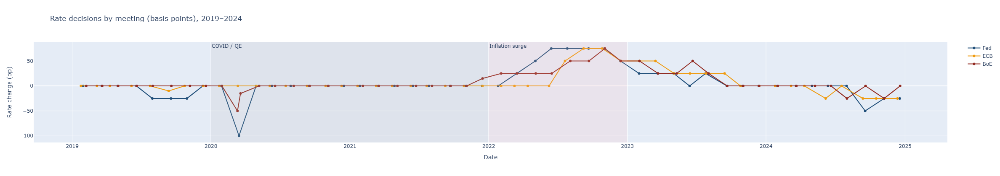

In [81]:
# ── Timeline: rate decisions by institution ─────────────────────────────────────
# This interactive chart shows the rate decision at each meeting and highlights
# the macro regimes that shape the vocabulary patterns we will find in the NLP analysis.

fig = go.Figure()
for inst, colour in INST_COLOURS.items():
    sub = df[df['institution']==inst].sort_values('date')
    fig.add_trace(go.Scatter(
        x=sub['date'], y=sub['rate_decision_bp'],
        mode='lines+markers', name=inst,
        line=dict(color=colour, width=2), marker=dict(size=6),
        hovertemplate=f'<b>{inst}</b><br>%{{x|%b %Y}}<br>Decision: %{{y}} bp<extra></extra>'
    ))

# Shade the four macro regimes
for x0, x1, colour, label in [
    ('2020-01-01','2021-12-31','rgba(180,180,180,0.15)','COVID / QE'),
    ('2022-01-01','2022-12-31','rgba(255,180,180,0.15)','Inflation surge'),
]:
    fig.add_vrect(x0=x0, x1=x1, fillcolor=colour, line_width=0,
                  annotation_text=label, annotation_position='top left')

fig.update_layout(
    title='Rate decisions by meeting (basis points), 2019–2024',
    xaxis_title='Date', yaxis_title='Rate change (bp)',
    height=420, hovermode='x unified'
)
fig.show()


**Reading the timeline.** The four macro regimes are immediately visible.

2019 shows modest easing: the Fed cuts three times in the second half of the year, the BoE holds, the ECB makes one small cut in September. 2020 is the shock: the Fed's −100bp move in March stands out as the largest single move in the dataset — an emergency cut that came between scheduled meetings, reflecting how rapidly conditions deteriorated. The BoE makes two cuts in quick succession that same month. 2021 is flat across all three: rates pinned near zero, with no moves at all.

2022 is the pivot. All three institutions begin hiking within months of each other, driven by the same inflation shock. The Fed moves most aggressively — three consecutive 75bp hikes in the second half of the year — while the BoE starts earliest (December 2021) and the ECB starts latest but catches up quickly. By end-2022 all three are at or near their peak. 2023–2024 shows the plateau and the beginning of cuts, with the ECB moving first, then the BoE, then the Fed.

The synchronisation is striking and consequential for what follows. These three institutions are responding to the same global shocks — COVID, supply chain disruptions, the energy price spike — which means their language should shift in similar directions at similar times. This makes cross-institution comparisons in the keyness analysis especially clean: when we find vocabulary differences between the Fed and the ECB, we can be more confident they reflect genuine institutional differences in communication style or mandate rather than the two banks simply being in different phases of the cycle.


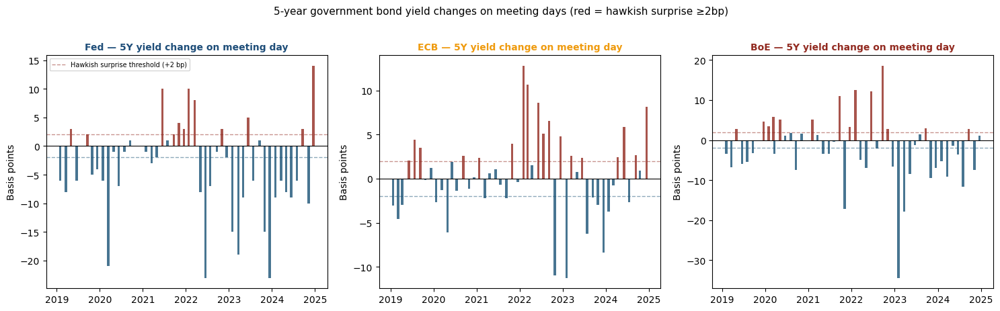

In [82]:
# ── 5-year yield changes on meeting days ──────────────────────────────────────
# Bar chart showing the yield reaction at each meeting, coloured by direction.
# Red bars (>=2bp) will become our 'hawkish surprise' outcome variable in Part 8.

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
for ax, inst in zip(axes, ['Fed', 'ECB', 'BoE']):
    sub = df[df['institution']==inst].dropna(subset=['yield_change_5y_bp'])
    colours = ['#922b21' if v>=2 else '#1a5276' for v in sub['yield_change_5y_bp']]
    ax.bar(sub['date'], sub['yield_change_5y_bp'], color=colours, width=20, alpha=0.8)
    ax.axhline(0, color='black', linewidth=0.8)
    ax.axhline(2,  color='#922b21', linewidth=1, linestyle='--', alpha=0.5,
               label='Hawkish surprise threshold (+2 bp)')
    ax.axhline(-2, color='#1a5276', linewidth=1, linestyle='--', alpha=0.5)
    ax.set_title(f'{inst} — 5Y yield change on meeting day',
                 fontsize=10, color=INST_COLOURS[inst], fontweight='bold')
    ax.set_ylabel('Basis points')
    if inst == 'Fed': ax.legend(fontsize=7)

plt.suptitle('5-year government bond yield changes on meeting days '
             '(red = hawkish surprise ≥2bp)', y=1.02, fontsize=11)
plt.tight_layout(); plt.show()


**Reading the yield charts.** Each bar is one meeting; red bars are hawkish surprises (yield rose ≥2bp), blue are dovish or neutral. The 2bp threshold is a modelling choice — it filters out moves that are within the normal day-to-day noise of bond markets — but the results are not very sensitive to it; most meaningful moves are well above it.

The 2022–2023 hiking cycle stands out clearly: a dense cluster of red bars across all three panels, reflecting meetings where markets were repeatedly surprised by the pace and persistence of rate increases. The conventional wisdom that "the hikes were fully priced in" is not well supported by the data — yields were still moving meaningfully on meeting days throughout the cycle, suggesting the accompanying language about the future path of rates continued to carry new information even as the hikes themselves became expected.

The large negative bars are concentrated in 2020 (all three institutions) and 2023–2024 (BoE and Fed). The 2020 moves reflect emergency cuts and emergency forward guidance — markets updated sharply on the signal that rates would stay near zero for an extended period. The BoE's most extreme bar, around −34bp, stands out as the largest single move in the dataset and reflects a meeting where both the vote split and the forward guidance were more dovish than anticipated.

The ECB panel is more compressed throughout, rarely exceeding ±10bp in either direction. This likely reflects both the ECB's more deliberate, consensus-driven communication style and the fact that euro area bond yields respond to a broader set of factors — including fiscal dynamics across member states — that dilute the signal from any single ECB meeting.

The overall picture is one of genuine, persistent variation in both directions across all three institutions and all six years. This is what makes the prediction task meaningful.

## PART 2 — From Text to Numbers

Every dataset we have worked with so far in this course has been **structured**: it arrives as a table with rows of observations and columns of features, all numeric or categorical, ready for a model to consume. The UK procurement contracts, the anomaly scores, the yield changes — all of these live naturally in a spreadsheet.

Most data in the world is not like this.

**Unstructured data** has no predefined format, no rows and columns, no fixed set of features. Text is the most common example, but images, audio, and video are others. The content is rich — a central bank meeting account contains far more information than any single numeric summary could capture — but that richness comes at a cost: you cannot feed raw text directly into a logistic regression or a random forest.

```mermaid
graph LR
    S["Structured data<br>────────────────<br>Rows × columns<br>Numeric / categorical<br>Ready for ML<br><br>Example: yield_changes.csv"] 
    U["Unstructured data<br>────────────────<br>No fixed format<br>No predefined features<br>Not directly usable<br><br>Example: BoE MPC minutes"]
    U -->|"Text preprocessing<br>(this section)"| M["Numeric matrix<br>────────────────<br>Documents × features<br>Ready for ML"]
    S --> M
    style S fill:#1a5276,color:#fff
    style U fill:#922b21,color:#fff
    style M fill:#1e8449,color:#fff
```

The goal of this part is to walk through that transformation — from raw prose to a numeric matrix — step by step. Each step involves choices that shape what the analysis can and cannot see.

1. **Tokenisation** — break continuous text into discrete units
2. **Cleaning** — remove uninformative words, normalise word forms
3. **Representation** — count and weight the remaining tokens to build a numeric matrix

### 2.1 What is a token?

Before any quantitative analysis, text must be broken into discrete units. These units are called **tokens**, and what counts as a token depends on the problem at hand and the choices made by the analyst.

For most NLP tasks, a token is a word — but not always. A tokeniser might split *"don't"* into two tokens (*"do"* and *"n't"*) to capture the negation separately. It might treat *"75 basis points"* as a single token because the phrase has a meaning that its parts do not. It might discard punctuation entirely, or keep it because exclamation marks carry sentiment. Sub-word tokenisers used in modern language models like BERT go further still, breaking *"tightening"* into *"tight"* and *"##ening"* to share representations across related words.

For our purposes — topic modelling, keyness analysis, and building a document-term matrix — the right unit is roughly a meaningful word or short phrase. We want tokens that carry economic content and that are comparable across documents and institutions. That rules out punctuation, single characters, and most function words. It also pushes us toward normalised word forms so that the same concept is always the same token regardless of how it was phrased in a particular sentence — we will define this process precisely in section 2.3. Similarly, treating multi-word phrases as single tokens (so that *"forward guidance"* is one unit rather than two unrelated words) is a technique we introduce in section 3.1.

Central bank text presents specific tokenisation challenges:

- **Numeric expressions:** *"75 basis points"*, *"2.5%"*, *"€1.5 trillion"* — should these be kept as tokens or discarded? A raw number carries little meaning on its own, but *"75 basis points"* in context means something specific.
- **Institutional abbreviations:** FOMC, MPC, GC, QE, PEPP, APP — a general-purpose tokeniser may not recognise these and will treat them as unknown strings rather than meaningful units.
- **Multi-word economic concepts:** *"core inflation"*, *"forward guidance"*, *"balance sheet runoff"* — splitting these into individual words loses the meaning; *"forward"* and *"guidance"* separately tell you nothing about monetary policy communication.
- **Hedged language:** *"broadly balanced"*, *"remain watchful"*, *"act as necessary if warranted"* — central banks communicate through carefully chosen qualifications. Whether to preserve or collapse these phrases is an analytical decision that affects what the model can detect.

There is no single correct answer to any of these — the right choice depends on what you are trying to measure. For our analysis, we prioritise economic content over linguistic completeness, which leads to the specific preprocessing decisions in sections 2.2 and 2.3. We use **spaCy's `en_core_web_sm`** model throughout. The code below shows what a raw document looks like before and after tokenisation.


Before we tokenise anything, it is worth seeing what a single row of the dataset actually looks like. Each row is one meeting — one document. The cell below prints the first 1,000 characters of a Fed FOMC minutes document so you can get a sense of the register, the vocabulary, and why some preprocessing decisions are needed before any of this becomes usable for analysis.

In [83]:
# ── Tokenisation: raw vs processed, on a real Fed document ───────────────────
sample_text = df[df['institution']=='Fed']['text'].iloc[3][:1000]

print('=== Raw text (one row of the dataset, first 1,000 characters) ===')
print()
print(sample_text)
print()
print('─' * 70)
print()

doc = nlp(sample_text)

raw_tokens   = [t.text for t in doc]
clean_tokens = [t.text.lower() for t in doc
                if not t.is_stop and not t.is_punct
                and not t.is_space and len(t.text) > 1]
lemma_tokens = [t.lemma_.lower() for t in doc
                if not t.is_stop and not t.is_punct
                and not t.is_space and len(t.lemma_) > 1]

print(f'{"":30s}  {"Total tokens":>14}  {"Unique tokens":>14}')
print(f'{"─"*60}')
print(f'{"Raw":30s}  {len(raw_tokens):>14,}  {len(set(raw_tokens)):>14,}')
print(f'{"After stopword removal":30s}  {len(clean_tokens):>14,}  {len(set(clean_tokens)):>14,}')
print(f'{"After lemmatisation":30s}  {len(lemma_tokens):>14,}  {len(set(lemma_tokens)):>14,}')
print()

# Most frequent raw tokens — to motivate stopword removal
from collections import Counter
raw_freq = Counter(t.lower() for t in raw_tokens)
print('Most frequent raw tokens (this is the problem stopwords solve):')
print(raw_freq.most_common(10))
print()

# Most frequent after cleaning — to motivate lemmatisation
clean_freq = Counter(clean_tokens)
print('Most frequent after stopword removal (before lemmatisation):')
print(clean_freq.most_common(10))
print()

# After lemmatisation — show that inflected forms collapse
print('After lemmatisation — inflected forms collapse to one token:')
print(clean_freq.most_common(10))
print()
print('Example: how lemmatisation reduces vocabulary')
examples = ['held', 'hold', 'holding', 'holds',
            'meeting', 'meetings',
            'governor', 'governors']
for w in examples:
    doc_w = nlp(w)
    print(f'  {w:15s}  ->  {doc_w[0].lemma_.lower()}')

=== Raw text (one row of the dataset, first 1,000 characters) ===

Minutes of the Federal Open Market Committee June 18-19, 2019 A joint meeting of the Federal Open Market Committee and the Board of Governors was held in the offices of the Board of Governors of the Federal Reserve System in Washington, D.C., on Tuesday, June 18, 2019, at 10:30 a.m. and continued on Wednesday, June 19, 2019, at 9:00 a.m. 1 PRESENT: Jerome H. Powell, Chair John C. Williams, Vice Chair Michelle W. Bowman Lael Brainard James Bullard Richard H. Clarida Charles L. Evans Esther L. George Randal K. Quarles Eric Rosengren Patrick Harker, Robert S. Kaplan, Neel Kashkari, Loretta J. Mester, and Michael Strine, Alternate Members of the Federal Open Market Committee Thomas I. Barkin, Raphael W. Bostic, and Mary C. Daly, Presidents of the Federal Reserve Banks of Richmond, Atlanta, and San Francisco, respectively James A. Clouse, Secretary Matthew M. Luecke, Deputy Secretary David W. Skidmore, Assistant Secretary Mi

**Reading the output.** There are several things to notice here, working through the output from top to bottom.

**The raw text is not what you might expect.** The first 1,000 characters of a Fed FOMC minutes document are not economic analysis — they are a header listing the meeting date, location, and the names of every person present. This is a reminder that real-world text data is messy: the signal we care about is buried inside boilerplate that dominates the beginning of every document.

**Total tokens vs. unique tokens.** This distinction matters and is worth being precise about. The **total token count** is simply the number of words in the text — every occurrence of every word, counted separately. The **unique token count** (also called the **vocabulary**) is the number of *distinct* words: how many different words appear, regardless of how often. In our 1,000-character excerpt, 191 total tokens come from only 110 distinct words — meaning many words repeat. This repetition is exactly what the frequency counts reveal.

**Stopword removal has almost no effect on unique token count.** Total tokens drop from 191 to 130, but unique tokens barely move (110 → 97). This is the defining property of stopwords: they are a small *set* of words that each appear with very high *frequency*. The most frequent raw tokens confirm this — commas, *"of"*, *"the"*, *"and"* — a handful of words that together account for a large share of all tokens but add almost nothing to our vocabulary. Removing them reduces the noise without losing much vocabulary diversity. We define stopwords properly in section 2.2.

**Lemmatisation has no visible effect on the counts here.** The numbers are identical before and after. This is because this particular 1,000-character excerpt is dominated by proper nouns and already-uninflected forms — *"Federal"*, *"Secretary"*, *"June"*. The examples at the bottom of the output show what lemmatisation *would* do on economic content: *"held"*, *"hold"*, *"holding"*, *"holds"* all collapse to the same form; *"meetings"* becomes *"meeting"*; *"governors"* becomes *"governor"*. On the full document — thousands of words of economic deliberation — this compression is substantial. We define lemmatisation and contrast it with stemming in section 2.3.


### 2.2 Stopwords and domain-specific vocabulary

**Stopwords** are words too common to carry discriminating information: *"the"*, *"and"*, *"of"*. Removing them reduces noise and surfaces substantive vocabulary.

For central bank text, the standard English stopword list is insufficient. Words like *"committee"*, *"members"*, *"noted"*, *"discussed"* appear in virtually every document across all three institutions — they describe the *format* of a central bank meeting, not its *economic content*. Left in, they would dominate word clouds and TF-IDF scores.

We extend spaCy's default list with a curated set of central-bank boilerplate terms. The choice of what to add is a modelling decision — it shapes what the subsequent analysis will and won't be able to see. The table below shows some examples:

| Category | Examples | Why remove |
|---|---|---|
| Meeting format | committee, member, session, noted, discussed | Universal across all 144 documents |
| Institution names | FOMC, MPC, ECB, Fed, bank, central | Uninformative for within-corpus comparison |
| Generic hedging | broadly, generally, overall, remain, continue | Near-uniform distribution across all meetings |
| Month names | january, february, ... | Present in every document, no discriminating value |


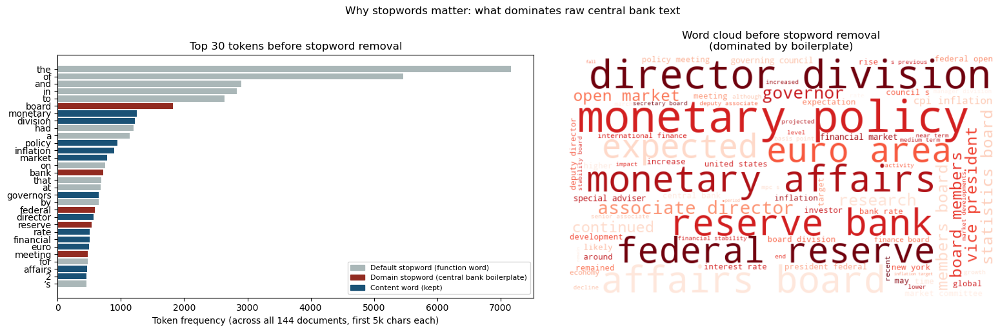

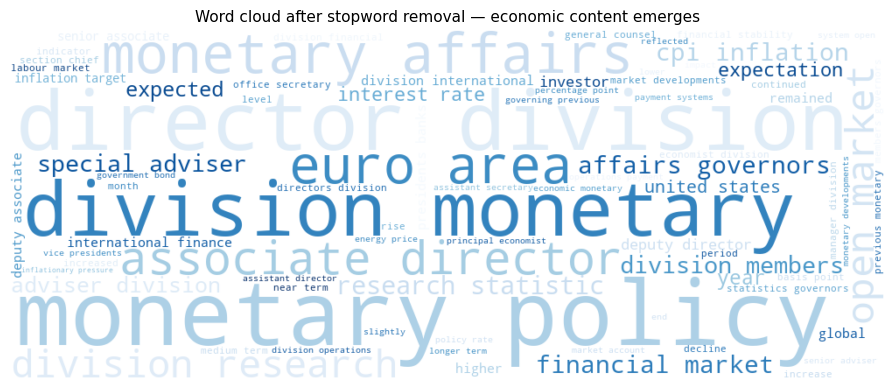

Default spaCy stopwords:  352
Domain additions:         56

Domain stopwords added: ['agree', 'april', 'assess', 'august', 'bank', 'board', 'broadly', 'central', 'committee', 'consider', 'continue', 'council', 'current', 'december', 'discuss', 'discussion', 'ecb', 'england', 'european', 'express', 'february', 'fed', 'federal', 'fomc', 'generally', 'governor', 'indicate', 'january', 'judgment', 'july', 'june', 'largely', 'likely', 'march', 'meeting', 'member', 'mpc', 'new', 'note', 'november', 'october', 'overall', 'present', 'president', 'propose', 'quarter', 'recent', 'remain', 'report', 'reserve', 'review', 'september', 'session', 'staff', 'suggest', 'view']


In [84]:
# ── Domain-specific stopwords for central bank text ───────────────────────────
# We build our stopword list in two steps:
#   1. Start with spaCy's default English stopwords (common function words)
#   2. Add domain-specific terms that are ubiquitous in central bank minutes
#      but carry no discriminating information across documents

CENTRAL_BANK_STOPWORDS = {
    # Meeting boilerplate (present in every document)
    'committee', 'member', 'governor', 'president', 'council', 'board',
    'meeting', 'session', 'discussion', 'note', 'discuss', 'view',
    'agree', 'consider', 'suggest', 'propose', 'express', 'indicate',
    'staff', 'report', 'present', 'review', 'assess', 'judgment',
    # Institution names and abbreviations
    'fomc', 'mpc', 'ecb', 'fed', 'federal', 'reserve', 'bank',
    'england', 'european', 'central',
    # Generic hedging (near-uniform distribution)
    'likely', 'broadly', 'largely', 'generally', 'overall', 'remain',
    'continue', 'recent', 'current', 'new', 'quarter',
    # Month names
    'january', 'february', 'march', 'april', 'june',
    'july', 'august', 'september', 'october', 'november', 'december',
}

for w in CENTRAL_BANK_STOPWORDS:
    nlp.vocab[w].is_stop = True

# ── Show the problem stopwords solve ─────────────────────────────────────────
# Compute token frequencies across the full corpus (all 144 documents)
# BEFORE any stopword removal, to show what dominates raw text.

all_raw_tokens = []
for text in df['text']:
    all_raw_tokens.extend([t.text.lower() for t in nlp(text[:5000])
                           if not t.is_space and not t.is_punct])

raw_freq = Counter(all_raw_tokens)
top_raw  = raw_freq.most_common(30)

# Split into stopwords vs content words
default_stops  = [w for w, c in top_raw if nlp.vocab[w].is_stop
                  and w not in CENTRAL_BANK_STOPWORDS]
domain_stops   = [w for w, c in top_raw if w in CENTRAL_BANK_STOPWORDS]
content_words  = [w for w, c in top_raw if not nlp.vocab[w].is_stop
                  and w not in CENTRAL_BANK_STOPWORDS]

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Left: top 30 raw tokens coloured by type
words  = [w for w, c in top_raw]
counts = [c for w, c in top_raw]
colours = ['#aab7b8' if w in default_stops
           else '#922b21' if w in domain_stops
           else '#1a5276'
           for w in words]

axes[0].barh(words[::-1], counts[::-1], color=colours[::-1])
axes[0].set_xlabel('Token frequency (across all 144 documents, first 5k chars each)')
axes[0].set_title('Top 30 tokens before stopword removal')

# Legend
axes[0].legend(handles=[
    Patch(color='#aab7b8', label='Default stopword (function word)'),
    Patch(color='#922b21', label='Domain stopword (central bank boilerplate)'),
    Patch(color='#1a5276', label='Content word (kept)'),
], fontsize=8, loc='lower right')

# Right: word cloud BEFORE stopword removal
wc_before = WordCloud(width=700, height=400, background_color='white',
                      max_words=80, colormap='Reds').generate(
    ' '.join(all_raw_tokens))
axes[1].imshow(wc_before, interpolation='bilinear')
axes[1].axis('off')
axes[1].set_title('Word cloud before stopword removal\n(dominated by boilerplate)')

plt.suptitle('Why stopwords matter: what dominates raw central bank text',
             y=1.02, fontsize=12)
plt.tight_layout()
plt.show()

# ── Word cloud AFTER stopword removal ────────────────────────────────────────
all_clean_tokens = [t for t in all_raw_tokens if not nlp.vocab[t].is_stop]
wc_after = WordCloud(width=1000, height=400, background_color='white',
                     max_words=80, colormap='Blues').generate(
    ' '.join(all_clean_tokens))

fig, ax = plt.subplots(figsize=(14, 4))
ax.imshow(wc_after, interpolation='bilinear')
ax.axis('off')
ax.set_title('Word cloud after stopword removal — economic content emerges',
             fontsize=11)
plt.tight_layout()
plt.show()

print(f'Default spaCy stopwords:  {sum(1 for lex in nlp.vocab if lex.is_stop and lex.text not in CENTRAL_BANK_STOPWORDS):,}')
print(f'Domain additions:         {len(CENTRAL_BANK_STOPWORDS)}')
print()
print(f'Domain stopwords added: {sorted(CENTRAL_BANK_STOPWORDS)}')

**Reading the plots.**

The bar chart makes the stopword problem concrete. The top 30 most frequent tokens are almost entirely grey — standard English function words like *"the"*, *"of"*, *"and"*, *"in"* — with a handful of red domain boilerplate (*"board"*, *"bank"*, *"meeting"*) mixed in. The blue content words we actually care about (*"monetary"*, *"policy"*, *"inflation"*, *"market"*) appear but are competing for attention with words that carry no analytical signal whatsoever.

The word cloud before removal makes this visually striking: *"monetary affairs"*, *"director division"*, *"reserve bank"*, *"federal reserve"* dominate — these are ECB organisational titles and Fed institutional labels that appear in the headers and attendee lists of every document. They have nothing to do with the economic deliberation.

After removal the picture is better — *"monetary policy"*, *"cpi inflation"*, *"interest rate"*, *"financial market"* come through clearly. But notice that *"division"*, *"affairs"*, *"associate director"*, *"special adviser"* are still prominent. These are ECB staff titles that our domain stopword list did not anticipate. This is a good illustration of an important general point: **stopword lists are never complete**. Real-world text always contains domain-specific boilerplate you did not think of in advance, and iterating on the stopword list after inspecting the word cloud is a normal part of the workflow.

The printed domain additions at the bottom confirm what was added beyond spaCy's 352 defaults. The 56 additions target meeting format words, institution names, and generic hedging phrases — but as the word cloud reveals, there is room to extend the list further before moving to the next step.


### 2.3 Stemming vs. Lemmatisation

Both approaches reduce words to a root form to collapse morphological variants. They differ in accuracy and speed:

```mermaid
graph TD
    A["Raw word<br>e.g. 'tightening'"] --> B["Stemming<br>(rule-based suffix removal)"]
    A --> C["Lemmatisation<br>(vocabulary + morphology)"]
    B --> D["'tighten' or 'tighten'<br>(sometimes 'tighten', sometimes 'tighten')"]
    C --> E["'tighten'<br>(always correct canonical form)"]
    style C fill:#1a5276,color:#fff
    style E fill:#1a5276,color:#fff
```

**Stemming** (e.g. Porter stemmer) is rule-based: it mechanically removes suffixes. Fast but crude — *"hiking"* correctly yields *"hike"* but *"hiking"* in some implementations yields *"hik"* (a non-word). Cannot handle irregular forms.

**Lemmatisation** uses vocabulary and morphological analysis to return the canonical dictionary form: *"hiking"* → *"hike"*, *"prices"* → *"price"*, *"tightening"* → *"tighten"*. Slower but linguistically correct.

**For central bank text, lemmatisation is clearly the right choice.** *"Rate"* and *"rates"* describe the same policy instrument. *"Tighten"*, *"tightening"*, and *"tightened"* describe the same policy action. Treating them as separate tokens would inflate the vocabulary with near-duplicate columns and dilute the signal.

The practical rule: use lemmatisation when meaning matters; use stemming only when speed is the binding constraint and corpus size is very large.


In [86]:
# ── Full preprocessing pipeline ─────────────────────────────────────────────────
# Applies all preprocessing steps in sequence:
#   1. Lowercase
#   2. Lemmatise (spaCy en_core_web_sm)
#   3. Remove default + domain stopwords
#   4. Remove punctuation, spaces, standalone numbers
#   5. Remove very short tokens (<=2 characters)
# Returns a single joined string for use with CountVectorizer / TfidfVectorizer.

def preprocess_minutes(text):
    doc = nlp(text[:500_000])  # guard against very long documents
    tokens = [
        t.lemma_.lower()
        for t in doc
        if not t.is_stop
        and not t.is_punct
        and not t.is_space
        and not t.like_num
        and len(t.lemma_) > 2
    ]
    return ' '.join(tokens)

print('Preprocessing all documents (~2 min on CPU)...')
df['text_clean'] = [preprocess_minutes(t) for t in tqdm(df['text'], total=len(df))]
print('Done.')
print()

# Show the effect on a real document
idx = df[df['institution']=='Fed'].index[3]
raw_len   = len(df.loc[idx, 'text'].split())
clean_len = len(df.loc[idx, 'text_clean'].split())
print(f'Fed document 4: {raw_len:,} raw words  →  {clean_len:,} after preprocessing')
print(f'Compression ratio: {raw_len/clean_len:.1f}x')
print()
print('First 200 characters of preprocessed text:')
print(df.loc[idx, 'text_clean'][:200])


Preprocessing all documents (~2 min on CPU)...


100%|████████████████████████████████████████████████████████████████████████████████| 144/144 [01:59<00:00,  1.20it/s]

Done.

Fed document 4: 8,314 raw words  →  4,752 after preprocessing
Compression ratio: 1.7x

First 200 characters of preprocessed text:
minute federal open market committee june joint federal open market committee board governors hold office board governors federal reserve system washington d.c. tuesday june 10:30 a.m. continue wednes


**Reading the output.** The pipeline reduces this document from 8,314 to 4,752 words — a compression ratio of 1.7×, which is on the low end. This is partly because the first part of every FOMC document is a long attendee list and procedural header, and those proper nouns (names, titles, locations) pass through the stopword filter since they are not in our list. On documents where the economic deliberation dominates, the ratio will be higher.
The preprocessed text confirms the remaining problem flagged in the word clouds: "minute federal open market committee june joint federal open market committee board governors hold office..." — the header boilerplate is still there, just in lemmatised form. This is a real limitation of our approach: we are filtering by vocabulary, not by document structure. A more sophisticated pipeline might skip the first N paragraphs of each Fed document, or detect and remove the attendee list programmatically. For a teaching dataset this is acceptable; for a research project it would be worth addressing.
The compression ratio diagnostic is still useful: a ratio below 1.5× suggests the stopword list is not doing much work; above 5× suggests it may be removing informative content. 1.7× is plausible but worth keeping in mind when interpreting downstream results.

*What if we wanted to perform stemming instead of lemmatization*?


In [87]:
# ── Stemming vs lemmatisation — a direct comparison ───────────────────────────

stemmer = PorterStemmer()

examples = [
    # Stemming produces non-words
    ('easing',          'stem produces non-word'),
    ('experience',      'stem produces non-word'),
    ('policy',          'stem produces non-word'),
    # Stemming is more aggressive than lemmatisation
    ('expectations',    'over-stemmed'),
    ('historical',      'over-stemmed'),
    ('national',        'over-stemmed'),
    # Lemmatisation handles irregular forms; stemming cannot
    ('are',             'irregular verb'),
    ('were',            'irregular verb'),
    ('better',          'irregular adjective'),
    ('worse',           'irregular adjective'),
]

print(f'{"Word":<20}  {"Stemmed (Porter)":<22}  {"Lemmatised (spaCy)":<22}  Note')
print('─' * 95)
for word, note in examples:
    stemmed    = stemmer.stem(word)
    lemmatised = nlp(word)[0].lemma_.lower()
    print(f'{word:<20}  {stemmed:<22}  {lemmatised:<22}  {note}')

print()
print('Three situations where stemming and lemmatisation diverge:')
print()
print('  1. Non-words: stemming can produce strings that are not English words')
print('     ("eas", "experi", "polici") — lemmatisation always produces a real word')
print()
print('  2. Over-stemming: stemming conflates words that should stay distinct')
print('     ("expectations" -> "expect", "historical" -> "histor")')
print('     lemmatisation preserves the noun form ("expectation", "historical")')
print()
print('  3. Irregular forms: stemming is purely rule-based and cannot handle')
print('     irregulars — "are" and "were" should both map to "be",')
print('     "better" should map to "good" or "well"')
print()
print('We use lemmatisation throughout this notebook.')

Word                  Stemmed (Porter)        Lemmatised (spaCy)      Note
───────────────────────────────────────────────────────────────────────────────────────────────
easing                eas                     ease                    stem produces non-word
experience            experi                  experience              stem produces non-word
policy                polici                  policy                  stem produces non-word
expectations          expect                  expectation             over-stemmed
historical            histor                  historical              over-stemmed
national              nation                  national                over-stemmed
are                   are                     be                      irregular verb
were                  were                    be                      irregular verb
better                better                  well                    irregular adjective
worse                 wors               

**Reading the output.** The table illustrates three distinct failure modes of stemming, all of which matter for our analysis.

**Non-words.** *"easing"* becomes *"eas"*, *"experience"* becomes *"experi"*, *"policy"* becomes *"polici"*. These are not English words. In a topic model or keyness analysis, a column labelled *"eas"* is uninterpretable — you cannot look at it and understand what economic concept it represents. Lemmatisation produces *"ease"*, *"experience"*, *"policy"* — real words that retain their meaning.

**Over-stemming.** *"expectations"* becomes *"expect"* — conflating a noun (*"expectation"*, what markets are pricing in) with a verb (*"expect"*, what the committee thinks will happen). These are related but not the same thing, and collapsing them loses a distinction that matters in central bank language. Similarly *"historical"* becomes *"histor"*, which is not a word at all. Lemmatisation preserves *"expectation"* as a noun.

**Irregular forms.** This is where stemming fails most visibly. *"are"* and *"were"* are both forms of the verb *"to be"* — a stemmer treating them as suffix-stripping problems produces *"are"* and *"were"* unchanged, missing the connection entirely. Lemmatisation correctly maps both to *"be"*. Similarly *"better"* and *"worse"* are comparative forms of *"good"* and *"bad"* — only lemmatisation captures this.

The overall picture: stemming is faster and requires no linguistic knowledge, which makes it attractive for very large corpora. For our 144-document corpus, speed is not a constraint, and the interpretability of the resulting vocabulary matters — both for the topic models and for the keyness analysis where we will be reading individual terms and drawing conclusions from them. Lemmatisation is the right choice here.

### 2.4 Word clouds — before and after preprocessing

Word clouds are a quick first-look diagnostic, not an analytical output. They show the most frequent terms sized by frequency (or TF-IDF weight), and are most useful for **checking that preprocessing is working as intended** and for getting a first impression of institutional vocabulary differences.

We show two versions: raw text and after full preprocessing. The contrast between them makes the value of preprocessing immediately visible.


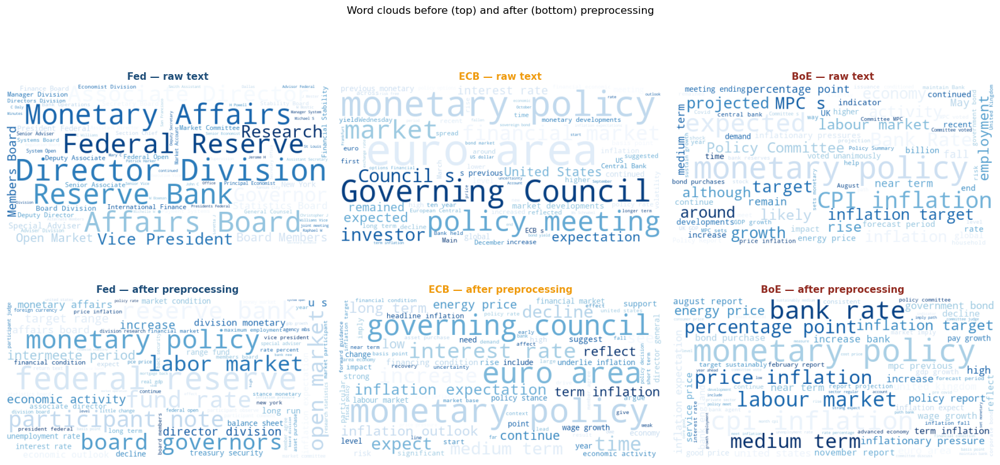

In [88]:
# ── Word clouds: raw vs preprocessed text, per institution ─────────────────────
# Top row: raw text dominated by stopwords and boilerplate
# Bottom row: after preprocessing, substantive economic vocabulary emerges

fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for col, inst in enumerate(['Fed', 'ECB', 'BoE']):
    sub = df[df['institution']==inst]

    # Raw text (truncate to first 5k chars per doc for speed)
    raw_all = ' '.join(sub['text'].str[:5000])
    wc_raw = WordCloud(width=600, height=300, background_color='white',
                       max_words=80, colormap='Blues').generate(raw_all)
    axes[0, col].imshow(wc_raw, interpolation='bilinear')
    axes[0, col].axis('off')
    axes[0, col].set_title(f'{inst} — raw text', fontsize=11,
                            color=INST_COLOURS[inst], fontweight='bold')

    # Preprocessed text
    clean_all = ' '.join(sub['text_clean'])
    wc_clean = WordCloud(width=600, height=300, background_color='white',
                         max_words=80, colormap='Blues').generate(clean_all)
    axes[1, col].imshow(wc_clean, interpolation='bilinear')
    axes[1, col].axis('off')
    axes[1, col].set_title(f'{inst} — after preprocessing', fontsize=11,
                            color=INST_COLOURS[inst], fontweight='bold')

plt.suptitle('Word clouds before (top) and after (bottom) preprocessing',
             y=1.01, fontsize=12)
plt.tight_layout(); plt.show()


**Reading the word clouds.**

The raw text (top row) tells three very different institutional stories — but not the ones we care about. The Fed's cloud is dominated by staff titles and organisational structure: *"Director Division"*, *"Associate Director"*, *"Affairs Board"* — the attendee list that opens every FOMC minutes document. The ECB's cloud is dominated by *"euro area"*, *"Governing Council"*, *"monetary policy"* and *"financial market"* — closer to economic content but still heavily weighted toward institutional framing. The BoE is actually the cleanest of the three in raw form: *"monetary policy"*, *"CPI inflation"*, *"Bank Rate"*, *"labour market"* are already visible, reflecting that BoE minutes are shorter and get to the economic substance more quickly.

After preprocessing (bottom row), the picture converges and becomes more comparable across institutions. Economic vocabulary dominates in all three: *"monetary policy"*, *"inflation"*, *"financial market"*, *"inflation expectation"*, *"medium term"*. But the institutional differences are still visible and now more meaningful:

- **Fed:** *"participant note"*, *"labor market"*, *"reserve bank"*, *"target range"*, *"intermeeting period"* — the dual mandate (labour alongside inflation) and the Fed's distinctive vocabulary for describing its own internal process.
- **ECB:** *"governing council"*, *"euro area"*, *"inflation outlook"*, *"wage growth"*, *"energy price"* — the multi-country framing and the ECB's focus on the transmission of policy across member states.
- **BoE:** *"inflation target"*, *"cpi inflation"*, *"labour market"*, *"government bond"*, *"percentage point"* — the single mandate expressed in very direct, quantitative language, with explicit references to the 2% target.

Two things are also worth noting. First, preprocessing has not fully solved the boilerplate problem: *"federal reserve"*, *"reserve bank"*, *"governing council"*, *"affairs board"* are still prominent in the bottom row, suggesting the domain stopword list could be extended further. Second, the preprocessed clouds already hint at what the keyness analysis will make precise — the vocabularies are recognisably different across institutions in ways that reflect genuine differences in mandate, communication style, and institutional context.

## PART 3 — Document-Term Matrix and TF-IDF

### 3.1 From tokens to a feature matrix

At the end of Part 2 we have, for each of our 144 documents, a list of cleaned and lemmatised tokens. That is still text — a sequence of strings. To apply any quantitative method we need to go one step further and turn those token lists into numbers.

The standard way to do this is a **Document-Term Matrix (DTM)** — also called a **Document-Feature Matrix (DFM)** in some traditions, the two terms refer to the same thing. The idea is simple: build a table where every row is a document and every column is a token from the vocabulary. Each cell records something about how that token relates to that document.

```mermaid
graph TD
    D1["Document 1<br/>(Fed Jan 2019)<br/>['inflation', 'rate', 'growth', ...]"]
    D2["Document 2<br/>(Fed Mar 2019)<br/>['price', 'inflation', 'market', ...]"]
    D3["..."]
    D1 --> R1["Row 1: [0, 1, 3, 0, 2, ...]"]
    D2 --> R2["Row 2: [0, 0, 1, 4, 0, ...]"]
    D3 --> R3["..."]
    R1 --> DTM["Document-Term Matrix<br/>144 rows × ~8,000 columns<br/>(~98% of cells are zero)"]
    R2 --> DTM
    R3 --> DTM
    style DTM fill:#1a5276,color:#fff
```

The matrix is **very sparse**: most tokens appear in only a handful of documents, so most cells contain zero. This is a fundamental property of text data, not a problem specific to our corpus, and it has important consequences for which methods work well — we return to this in Part 4.

**What goes in the cells?** Three options, each solving a problem created by the previous one:

| Representation | Formula | Problem it solves | Problem it creates |
|---|---|---|---|
| Raw count | count(t, d) | Simple and interpretable | A long document scores higher on every term simply because it has more words |
| Term frequency (TF) | count(t, d) / \|d\| | Normalises for document length | *"Inflation"* appears in every meeting's minutes — it scores highly everywhere and tells us nothing about what makes one meeting distinctive |
| **TF-IDF** | TF(t, d) × log(N / df(t)) | Downweights terms common across all documents, upweights terms distinctive to specific documents | Requires a choice of minimum document frequency (`min_df`) to filter out very rare terms |

**TF-IDF** is the standard choice for our task. The IDF component — Inverse Document Frequency — penalises terms that appear in many documents. A term like *"inflation"* that appears in all 144 documents gets a very low IDF weight, because it tells us nothing about how one meeting differs from another. A term like *"pandemic"* that appears mainly in 2020–2021 documents gets a high IDF weight, because it is genuinely distinctive. The result is a matrix where high values indicate terms that are both frequent *within* a document and rare *across* the corpus — exactly the combination that signals meaningful content.


**A note on n-grams.** So far we have treated each token as a single word (a **unigram**). But many meaningful concepts in central bank language are multi-word phrases: *"forward guidance"*, *"core inflation"*, *"basis point"*, *"long run"*. Split into individual words, these lose their meaning — *"forward"* and *"guidance"* separately tell you very little about monetary policy communication.

An **n-gram** is a sequence of n consecutive tokens treated as a single unit. A **bigram** (n=2) captures two-word phrases; a **trigram** (n=3) captures three-word phrases. Setting `ngram_range=(1,2)` tells the vectoriser to include both unigrams and bigrams in the vocabulary, so *"forward guidance"* gets its own column alongside *"forward"* and *"guidance"* individually.

The trade-off: adding bigrams expands the vocabulary substantially — most bigrams are rare and uninformative — which is why `min_df=3` is especially important when using n-grams.


In [89]:

# ── Build count matrix and TF-IDF matrix ──────────────────────────────────────
# We build both matrices because different methods need different inputs:
#   - TF-IDF (X_tfidf): used for LSA, keyness, and the prediction task
#   - Raw counts (X_count): used for LDA, which requires integer counts
#
# Key parameters:
#
# ngram_range=(1,2): include both single tokens (unigrams) and pairs of
#   consecutive tokens (bigrams). Bigrams capture multi-word concepts that
#   lose their meaning when split — 'forward guidance' means something very
#   specific in central bank language that 'forward' and 'guidance' separately
#   do not. We will define n-grams properly in the next cell.
#
# min_df=3: ignore terms that appear in fewer than 3 documents. A term seen
#   in only 1 or 2 documents out of 144 is almost certainly noise — a typo,
#   a proper noun, or a one-off phrase that will not generalise.
#
# max_features=8000: cap the vocabulary at the 8,000 most frequent terms.
#   This keeps the matrix manageable without losing meaningful vocabulary.

count_vec = CountVectorizer(ngram_range=(1, 2), min_df=3, max_features=8000)
X_count   = count_vec.fit_transform(df['text_clean'])

tfidf_vec = TfidfVectorizer(ngram_range=(1, 2), min_df=3, max_features=8000)
X_tfidf   = tfidf_vec.fit_transform(df['text_clean'])

vocab       = tfidf_vec.get_feature_names_out()
count_vocab = count_vec.get_feature_names_out()

print(f'Matrix shape:  {X_tfidf.shape[0]} documents × {X_tfidf.shape[1]} features')
print(f'Sparsity:      {1 - X_tfidf.nnz/(X_tfidf.shape[0]*X_tfidf.shape[1]):.1%} of cells are zero')
print()

# ── Compare one row across the three representations ──────────────────────────
# Pick a single document and show the same row as raw count, TF, and TF-IDF.
# This makes the effect of each weighting scheme concrete.

doc_idx  = df[df['institution'] == 'Fed'].index[3]  # same Fed document as before
row_pos  = df.index.get_loc(doc_idx)

# Raw counts for this document
row_count = X_count[row_pos]
count_arr = row_count.toarray().flatten()

# Term frequency (raw count / total tokens in document)
total_tokens = count_arr.sum()
tf_arr       = count_arr / total_tokens if total_tokens > 0 else count_arr

# TF-IDF
row_tfidf = X_tfidf[row_pos].toarray().flatten()

# Show top 10 tokens under each weighting scheme
n_top = 10
top_count = pd.Series(count_arr, index=count_vocab).nlargest(n_top)
top_tf    = pd.Series(tf_arr,    index=count_vocab).nlargest(n_top)
top_tfidf = pd.Series(row_tfidf, index=vocab      ).nlargest(n_top)

print(f'Top {n_top} tokens for Fed document 4 under each weighting scheme:')
print()
print(f'{"Raw count":<35}  {"Term frequency":<35}  {"TF-IDF"}')
print('─' * 105)
for i in range(n_top):
    c = f'{top_count.index[i]} ({top_count.iloc[i]:.0f})'
    t = f'{top_tf.index[i]} ({top_tf.iloc[i]:.4f})'
    d = f'{top_tfidf.index[i]} ({top_tfidf.iloc[i]:.4f})'
    print(f'{c:<35}  {t:<35}  {d}')

print()
print('Notice: raw count and TF produce similar rankings — high-frequency')
print('terms dominate both. TF-IDF suppresses these and surfaces terms that')
print('are distinctive to this specific document.')

Matrix shape:  144 documents × 8000 features
Sparsity:      78.0% of cells are zero

Top 10 tokens for Fed document 4 under each weighting scheme:

Raw count                            Term frequency                       TF-IDF
─────────────────────────────────────────────────────────────────────────────────────────────────────────
inflation (92)                       inflation (0.0131)                   participant (0.2316)
rate (92)                            rate (0.0131)                        percent (0.2164)
participant (77)                     participant (0.0110)                 inflation (0.2122)
market (75)                          market (0.0107)                      rate (0.2122)
economic (57)                        economic (0.0081)                    board (0.1737)
percent (45)                         percent (0.0064)                     market (0.1730)
committee (44)                       committee (0.0063)                   board governors (0.1635)
board (40)          

**Reading the output.**

The sparsity figure — 78% zeros — is lower than you might expect for text data, and worth explaining. The relatively low sparsity compared to typical text corpora (which often exceed 95% zeros) is because our corpus is small and homogeneous: 144 documents all written in the same institutional register about the same topic. Most vocabulary items that survive the `min_df=3` filter appear in a reasonable fraction of documents simply because the documents are so similar to each other. In a more diverse corpus — newspaper articles, social media posts, legal documents — sparsity would be much higher.

The three-column comparison is the more instructive output. Raw count and term frequency produce almost identical rankings, confirming that normalising for document length changes very little when documents are similar in length. *"Inflation"*, *"rate"*, *"market"* dominate both — these are the words that appear most often in this document, but they appear most often in *every* document, which means they carry almost no information about what makes this particular meeting distinctive.

TF-IDF reshuffles the ranking substantially. *"Participant"* rises to the top — this is a distinctively Fed word (the FOMC refers to its members as "participants", while the ECB uses "members" and the BoE uses "members" too but less systematically). *"Board governors"* appears as a bigram, reflecting the Fed's specific institutional structure. Meanwhile *"inflation"* and *"rate"* drop — not because they are unimportant, but because they are equally important in every document and therefore carry no discriminating power.

This is exactly what TF-IDF is designed to do: suppress the universal and amplify the distinctive. The top TF-IDF terms for this document are a much better description of what makes it *this* document rather than any other.


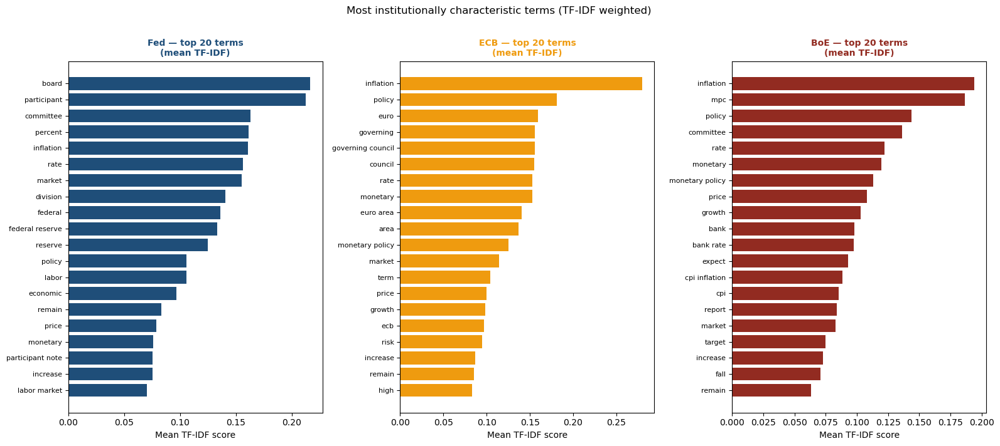

In [90]:
# ── Top TF-IDF terms per institution ──────────────────────────────────────────
# TF-IDF upweights terms common WITHIN an institution but rare ACROSS the corpus.
# This reveals institutionally distinctive vocabulary rather than just frequent vocabulary.

# Build the TF-IDF DataFrame with a clean reset index so row positions
# align correctly with df, then add institution as a separate column.
df_tfidf = pd.DataFrame(
    X_tfidf.toarray(),
    columns=vocab,
    index=range(len(df))   # use positional index to avoid any alignment issues
)
df_tfidf['institution'] = df['institution'].values

# vocab is the list of feature names — explicitly exclude 'institution'
# when computing means to avoid the TypeError
vocab_cols = [c for c in df_tfidf.columns if c != 'institution']

fig, axes = plt.subplots(1, 3, figsize=(16, 7))
for ax, inst in zip(axes, ['Fed', 'ECB', 'BoE']):
    mask  = df_tfidf['institution'] == inst
    means = (df_tfidf.loc[mask, vocab_cols]
                     .mean()
                     .sort_values(ascending=False)
                     .head(20))
    ax.barh(means.index[::-1], means.values[::-1], color=INST_COLOURS[inst])
    ax.set_title(f'{inst} — top 20 terms\n(mean TF-IDF)',
                 fontsize=10, color=INST_COLOURS[inst], fontweight='bold')
    ax.set_xlabel('Mean TF-IDF score')
    ax.tick_params(axis='y', labelsize=8)

plt.suptitle('Most institutionally characteristic terms (TF-IDF weighted)',
             y=1.01, fontsize=12)
plt.tight_layout()
plt.show()

**Reading the TF-IDF charts.** TF-IDF surfaces terms that are common *within* an institution's minutes but relatively rare across the full 144-document corpus — genuinely distinctive vocabulary rather than universal central-bank language. The results reveal both expected and surprising patterns.

**Fed:** The top terms are dominated by institutional structure — *"board"*, *"committee"*, *"federal reserve"*, *"division"*, *"participant"*. This reflects the Fed's very long documents which include extensive attendee lists, cross-references to the Board of Governors, and systematic attribution of views to "participants". The dual mandate shows up through *"labor"* and *"labor market"* near the bottom — present but not dominant. The preprocessing has not fully removed the Fed's institutional boilerplate, which is worth acknowledging.

**ECB:** The ECB's distinctive vocabulary is cleaner and more substantive — *"euro"*, *"euro area"*, *"governing council"*, *"ecb"* reflect the multi-country framing, while *"inflation"* topping the list with a score roughly twice anything else reflects the ECB's single mandate and its tendency to foreground the inflation outlook explicitly in every account. The presence of *"ecb"* as a high-scoring term suggests the domain stopword list could be extended.

**BoE:** The most substantively interesting panel. *"Mpc"* is prominent — a stopword candidate — but below it the vocabulary is genuinely economic: *"bank rate"*, *"cpi inflation"*, *"cpi"*, *"target"*, *"growth"*, *"monetary policy"*. The BoE's shorter documents and same-day publication mean the economic content dominates more quickly, and the explicit inflation target mandate shows through clearly.

Three things are still in these charts that arguably should not be — *"board"*, *"committee"*, *"mpc"*, *"ecb"*, *"remain"* — which the domain stopword list has not caught. This is a natural point to discuss the iterative nature of preprocessing: you inspect the outputs, identify what is still noise, and refine the list. For this notebook we accept these as a known limitation and move on.

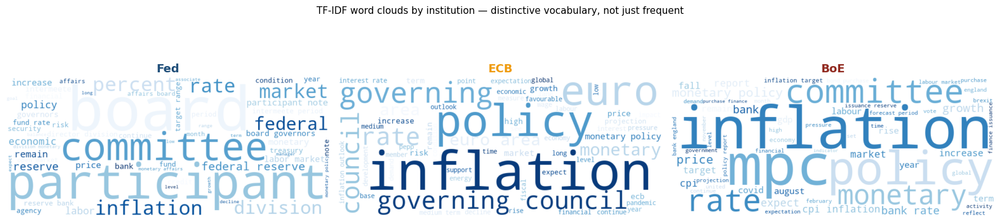

In [91]:
# ── TF-IDF word clouds per institution ────────────────────────────────────────
# Word clouds weighted by mean TF-IDF rather than raw frequency.
# This makes distinctive (not just frequent) terms more prominent.

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, inst in zip(axes, ['Fed', 'ECB', 'BoE']):
    mask  = df_tfidf['institution'] == inst
    freqs = df_tfidf.loc[mask, vocab_cols].mean().to_dict()
    wc = WordCloud(width=700, height=300, background_color='white',
                   max_words=60, colormap='Blues').generate_from_frequencies(freqs)
    ax.imshow(wc, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f'{inst}', fontsize=13, fontweight='bold',
                 color=INST_COLOURS[inst])

plt.suptitle('TF-IDF word clouds by institution — distinctive vocabulary, not just frequent',
             y=1.02, fontsize=11)
plt.tight_layout()
plt.show()

## PART 4 — Latent Semantic Analysis (LSA)

### 4.1 The problem TF-IDF cannot solve

TF-IDF treats every term independently. It does not know that *"inflation"* and *"prices"* are related, or that *"rate hike"* and *"tightening"* describe the same policy action. Two documents discussing the same topic in different words would appear dissimilar — their rows in the DTM would share few non-zero columns.

**Latent Semantic Analysis (LSA)** addresses this by finding the underlying *semantic dimensions* that explain the co-occurrence structure of the vocabulary. The core idea: words that tend to appear in the same documents are related, even if they never appear in the same sentence. LSA discovers these relationships automatically.

It does this by applying **Truncated Singular Value Decomposition (SVD)** to the DTM:

$$\mathbf{M} \approx \mathbf{U}_k \boldsymbol{\Sigma}_k \mathbf{V}_k^T$$

```mermaid
graph LR
    M["DTM M<br>144 docs × 8000 terms<br>(sparse)"]
    -->|"TruncatedSVD<br>keep top k dimensions"| U
    
    subgraph SVD decomposition
        U["U<br>144 × k<br>Document coordinates<br>in latent space"]
        S["Σ<br>k × k diagonal<br>Importance of<br>each dimension"]
        V["Vᵀ<br>k × 8000<br>Term loadings<br>in latent space"]
    end
    
    style M fill:#922b21,color:#fff
    style U fill:#1a5276,color:#fff
    style S fill:#1a5276,color:#fff
    style V fill:#1a5276,color:#fff
```

- **U** contains each document's coordinates in the latent space — this is what we use for visualisation and as features in the prediction task
- **Σ** tells us how important each dimension is — larger singular values = more variance explained
- **V** contains each term's loading on each dimension — this is what we inspect to interpret what each dimension captures

Keeping only the top $k$ dimensions gives a low-dimensional representation where documents using similar vocabulary — even different words for the same concept — end up close together.

**Why TruncatedSVD rather than standard PCA?** Both find directions of maximum variance, but standard PCA first *centres* the data by subtracting column means. On a sparse DTM this destroys sparsity — every zero becomes a small non-zero number — creating a dense matrix that may not fit in memory. TruncatedSVD skips centering and operates directly on the sparse matrix.

#### A note on what LSA is used for today

LSA was originally proposed in the late 1980s as a method for **information retrieval** — the idea being that a search query and a relevant document might not share exact words, but would share latent semantic dimensions. If you search for *"monetary tightening"* and a document contains *"rate increases"*, LSA could still retrieve it because the two phrases load on the same dimensions.

Today, LSA is rarely used for topic discovery in research — that role has been taken over by LDA (which produces interpretable probabilistic topics) and more recently by neural approaches like BERTopic (which uses contextual embeddings). The topics LSA finds are mathematical constructs that explain variance; they are not guaranteed to correspond to human-interpretable themes, and as we saw in our data, the dominant dimensions captured institutional identity rather than economic content.

What LSA *is* widely used for today is **dimensionality reduction for text** — exactly the role we are using it for here. The DTM has thousands of columns; LSA compresses it to a small number of dimensions that capture most of the variance. Those compressed representations can then be used as features in a downstream model, for clustering, or for visualisation.

In this sense, LSA plays the same role for text that PCA plays for tabular numeric data. But we cannot use PCA directly on the DTM, for three reasons:

| Problem | Why it matters for text |
|---|---|
| **Sparsity** | The DTM is ~98% zeros. PCA's first step is to centre the data by subtracting column means, which turns every zero into a small non-zero number and produces a fully dense matrix — potentially gigabytes in memory for a large vocabulary |
| **Non-negativity** | Word counts are non-negative integers. PCA assumes continuous data and does not exploit this structure; methods designed for counts (like LSA and LDA) can make better use of it |
| **Scale sensitivity** | PCA is sensitive to the scale of each feature. In a raw count matrix, common words have much higher variance than rare words and would dominate the principal components — even after TF-IDF weighting, the variance structure of text does not match PCA's assumptions well |

TruncatedSVD sidesteps all three: it skips the centering step, operates directly on the sparse matrix, and is efficient enough to handle vocabularies of tens of thousands of terms. The result is mathematically equivalent to PCA on centred data only when centering is performed — for sparse text matrices, skipping centering is a feature, not a limitation.


In [92]:
# ── Fit LSA ────────────────────────────────────────────────────────────────────────
# We use 10 components: enough to capture meaningful structure without overfitting
# to the 144-document corpus. The first 3 are used for 3D visualisation.

N_LSA = 10
svd = TruncatedSVD(n_components=N_LSA, random_state=SEED)
X_lsa = svd.fit_transform(X_tfidf)

print('Variance explained by each LSA dimension:')
cumvar = 0
for i, ev in enumerate(svd.explained_variance_ratio_):
    cumvar += ev
    bar = '█' * int(ev * 500)
    print(f'  Dim {i+1:2d}: {ev:.3f}  (cumulative: {cumvar:.3f})  {bar}')
print()
print(f'The top 3 dimensions explain {svd.explained_variance_ratio_[:3].sum():.1%} '
      f'of the variance used in the 3D visualisation below.')


Variance explained by each LSA dimension:
  Dim  1: 0.015  (cumulative: 0.015)  ███████
  Dim  2: 0.236  (cumulative: 0.252)  ██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████
  Dim  3: 0.138  (cumulative: 0.390)  █████████████████████████████████████████████████████████████████████
  Dim  4: 0.056  (cumulative: 0.446)  ███████████████████████████
  Dim  5: 0.039  (cumulative: 0.484)  ███████████████████
  Dim  6: 0.027  (cumulative: 0.512)  █████████████
  Dim  7: 0.024  (cumulative: 0.536)  ████████████
  Dim  8: 0.019  (cumulative: 0.555)  █████████
  Dim  9: 0.018  (cumulative: 0.573)  █████████
  Dim 10: 0.017  (cumulative: 0.590)  ████████

The top 3 dimensions explain 39.0% of the variance used in the 3D visualisation below.


**Reading the explained variance.** The pattern here is unusual and informative. Dimension 1 explains almost nothing (1.5%) while Dimension 2 explains nearly a quarter of the total variance (23.6%) — the opposite of what you typically see. This inversion happens because Dimension 1 has been captured by rare, idiosyncratic vocabulary (the negative pole — "direct obligation", "paragraph shall", "pursuant paragraph" — looks like legal boilerplate from a specific document type) rather than the dominant economic signal.
The cumulative variance for 10 dimensions is 59%, which is healthy for a text corpus and higher than typical because our documents are unusually homogeneous — 144 documents all written in the same institutional register about the same topic. In a diverse corpus you would expect much lower cumulative variance at the same k.
The practical implication: we should not read too much into the ordering of dimensions. Dimension 2, not Dimension 1, captures the main signal. This is why inspecting the term loadings is essential — the variance numbers alone do not tell you what each dimension means.


### 4.2 Choosing the number of dimensions

How many dimensions $k$ should we keep? There is no single correct answer, but two principles help:

**Explained variance:** keep enough dimensions to capture a reasonable fraction of the total variance. The scree plot below shows the variance explained by each dimension — look for a point where the curve flattens (an "elbow"), beyond which additional dimensions add little.

**Downstream task:** if the dimensions will be used as features for prediction, more dimensions preserve more information but also add noise. For our 144-document corpus, 10 dimensions is a reasonable balance — enough to capture the main semantic structure without overfitting the prediction task.

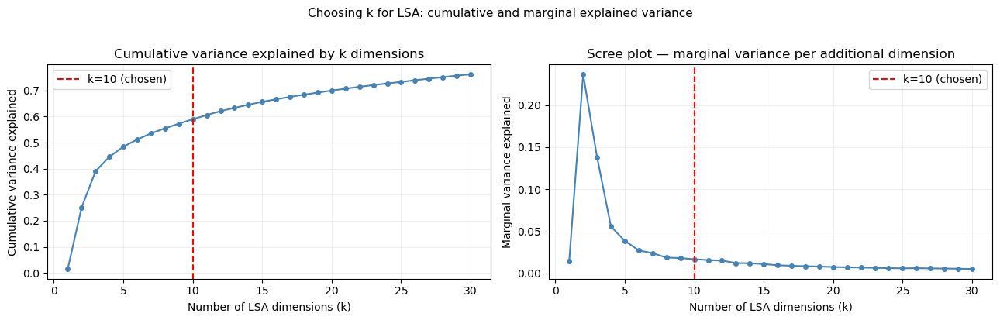

Variance explained at key values of k:
  k= 3: 39.0%
  k= 5: 48.4%
  k=10: 59.0%
  k=15: 65.6%
  k=20: 70.0%
  k=30: 76.2%

We choose k=10 as a balance between capturing meaningful structure
and avoiding overfitting in the downstream prediction task.


In [98]:
# ── Choosing the number of LSA dimensions ─────────────────────────────────────
# We fit LSA with a range of k values and inspect the scree plot to choose k.
# The "elbow" — where the curve flattens — suggests diminishing returns beyond that k.
# For prediction tasks, we also consider how many dimensions improve downstream performance.

from sklearn.decomposition import TruncatedSVD

k_range  = range(1, 31)
var_expl = []

for k in k_range:
    svd_tmp = TruncatedSVD(n_components=k, random_state=SEED)
    svd_tmp.fit(X_tfidf)
    var_expl.append(svd_tmp.explained_variance_ratio_.sum())

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

# Left: cumulative variance
axes[0].plot(list(k_range), var_expl, marker='o', markersize=4,
             linewidth=1.5, color='steelblue')
axes[0].axvline(10, color='red', linestyle='--', linewidth=1.5,
                label='k=10 (chosen)')
axes[0].set_xlabel('Number of LSA dimensions (k)')
axes[0].set_ylabel('Cumulative variance explained')
axes[0].set_title('Cumulative variance explained by k dimensions')
axes[0].legend(); axes[0].grid(alpha=0.2)

# Right: marginal variance (scree plot)
marginal = [var_expl[0]] + [var_expl[i] - var_expl[i-1]
                             for i in range(1, len(var_expl))]
axes[1].plot(list(k_range), marginal, marker='o', markersize=4,
             linewidth=1.5, color='steelblue')
axes[1].axvline(10, color='red', linestyle='--', linewidth=1.5,
                label='k=10 (chosen)')
axes[1].set_xlabel('Number of LSA dimensions (k)')
axes[1].set_ylabel('Marginal variance explained')
axes[1].set_title('Scree plot — marginal variance per additional dimension')
axes[1].legend(); axes[1].grid(alpha=0.2)

plt.suptitle('Choosing k for LSA: cumulative and marginal explained variance',
             y=1.02, fontsize=11)
plt.tight_layout()
plt.show()

print('Variance explained at key values of k:')
for k in [3, 5, 10, 15, 20, 30]:
    print(f'  k={k:2d}: {var_expl[k-1]:.1%}')
print()
print('We choose k=10 as a balance between capturing meaningful structure')
print('and avoiding overfitting in the downstream prediction task.')

**Reading the scree plots.**

The cumulative variance curve (left) rises steeply up to around k=5, then flattens progressively. By k=3 we have already captured 39% of the variance; going from k=10 to k=20 adds only another 11 percentage points. The curve never truly flattens to zero — text always has long tails of weak dimensions — but the steepest gains are in the first few components.

The marginal variance plot (right) makes this clearer. There is a sharp spike at Dimension 2 (the institution axis we identified earlier, explaining 23.6% on its own), a secondary peak at Dimension 3 (13.8%), and then a rapid drop. By around k=5 the marginal contribution of each additional dimension falls below 5%, and from k=7 onwards it is essentially flat at 1–2% per dimension.

**Where is the elbow?** The scree plot suggests k=3 or k=5 as natural stopping points based on explained variance alone. But this is where the downstream task becomes relevant. Our goal is not just to summarise the text — it is to use the LSA dimensions as features in a prediction model. Three dimensions, dominated by institution identity, would give the model almost no economic content to work with. Five dimensions starts to include the COVID axis (Dim 5) but misses much of the subtler variation.

**Why k=10?** At k=10 we capture 59% of variance, include all the interpretable dimensions identified earlier, and stay well within a range where the dimensions are still adding something beyond noise. Beyond k=10 the marginal gains are small and each new dimension is harder to interpret, increasing the risk of fitting idiosyncrasies of the 144-document corpus rather than genuine structure. k=10 is a pragmatic choice — not uniquely justified by the plots alone, but defensible given the size of the corpus and the nature of the downstream task.

### 4.3 Analysing loadings and projeccting the data in LSA space

In [93]:
# ── Top term loadings per LSA dimension ──────────────────────────────────────────
# Positive loading: term is associated with the positive end of the dimension
# Negative loading: term is associated with the negative end
# Together, the two poles characterise what conceptual axis the dimension captures.

n_top = 8
print(f'Top {n_top} terms per LSA dimension (positive and negative poles):<br>')
for i, component in enumerate(svd.components_[:6]):
    top_pos = [vocab[j] for j in component.argsort()[-n_top:][::-1]]
    top_neg = [vocab[j] for j in component.argsort()[:n_top]]
    print(f'Dim {i+1}  (+) {" | ".join(top_pos[:6])}')
    print(f'       (-) {" | ".join(top_neg[:6])}')
    print()


Top 8 terms per LSA dimension (positive and negative poles):

Dim 1  (+) inflation | rate | policy | market | monetary | price
       (-) direct obligation | committee selected | time available | paragraph shall | believe consultation | pursuant paragraph

Dim 2  (+) board | participant | percent | division | federal | federal reserve
       (-) euro | governing | governing council | council | inflation | euro area

Dim 3  (+) mpc | committee | bank rate | cpi inflation | cpi | report
       (-) governing | governing council | council | euro | euro area | area

Dim 4  (+) price | inflation | bank rate | increase | rate | wage
       (-) brexit | committee | purchase finance | purchase | issuance reserve | finance issuance

Dim 5  (+) brexit | growth | inflation | board | policy | monetary policy
       (-) covid | pandemic | purchase | asset purchase | measure | level

Dim 6  (+) board | covid | spare capacity | spare | division | high
       (-) governors | board governors | brexit | 


**Reading the term loadings.** The actual dimensions that emerged are more interpretable than the variance numbers suggested:

**Dim 1** (1.5% variance) — not the main economic axis. The negative pole (*"direct obligation"*, *"paragraph shall"*, *"pursuant paragraph"*) looks like treaty or legal language from ECB documents that reference the EU institutional framework. This is document-specific boilerplate, not a meaningful economic contrast. A reminder that LSA finds statistical structure, not necessarily the structure we would choose.

**Dim 2** (23.6% variance) — the **institution axis**. The positive pole (*"board"*, *"participant"*, *"percent"*, *"division"*, *"federal reserve"*) is distinctively Fed vocabulary; the negative pole (*"euro"*, *"governing council"*, *"euro area"*) is distinctively ECB. This is the largest dimension in the data — institutional style differences explain more variance than any economic content dimension. This makes sense given that three very different document types are pooled together.

**Dim 3** (13.8% variance) — the **BoE vs ECB axis**. Positive pole (*"mpc"*, *"bank rate"*, *"cpi inflation"*) is distinctively BoE; negative pole (*"governing council"*, *"euro area"*) is ECB. The Fed sits somewhere in between on this dimension.

**Dim 4** (5.6% variance) — an **economic content** dimension at last. Positive pole (*"price"*, *"inflation"*, *"bank rate"*, *"wage"*) vs. negative pole (*"brexit"*, *"purchase finance"*, *"issuance reserve"*) — a hawkish/tightening vs. QE/Brexit axis.

**Dim 5** (3.9% variance) — the **COVID axis**. Negative pole (*"covid"*, *"pandemic"*, *"purchase"*, *"asset purchase"*, *"measure"*) vs. positive pole (*"brexit"*, *"growth"*). This cleanly separates the 2020–2021 pandemic documents from the others.

**Dim 6** (2.7% variance) — a **Brexit/BoE-specific** axis. The negative pole (*"governors"*, *"board governors"*, *"brexit"*) mixes Fed and BoE-specific vocabulary in a way that is harder to interpret cleanly.

The overall picture is striking: the first three dimensions — accounting for 39% of variance — are almost entirely about *institutional identity*, not economic content. LSA finds what varies most, and what varies most in this corpus is which institution wrote the document, not what regime it was written in. Economic content only surfaces from Dimension 4 onwards. This has an important implication for the prediction task: if we use LSA dimensions as features, the early dimensions will largely encode institution rather than monetary policy stance.


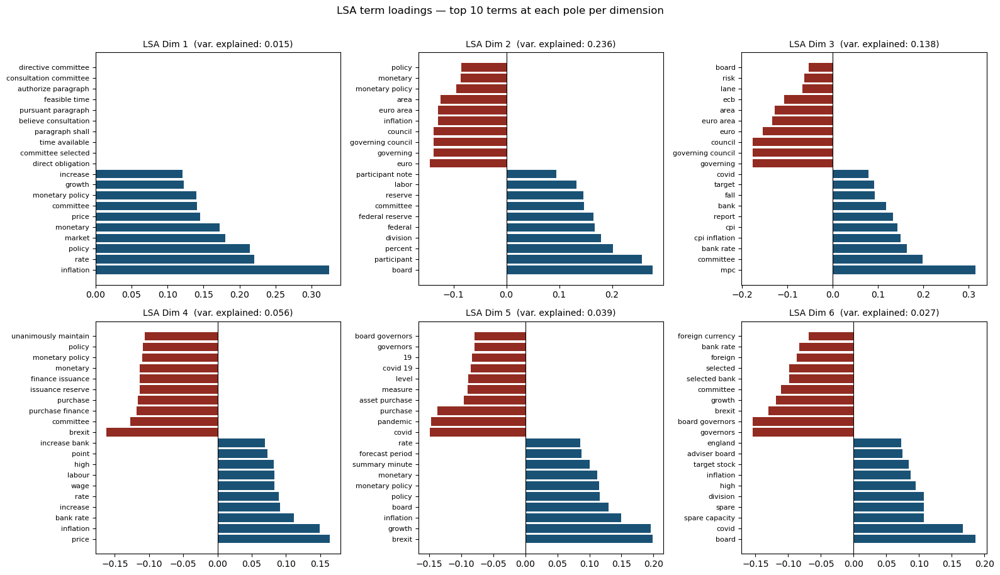

In [94]:
# ── Term loadings bar chart (first 6 dimensions) ──────────────────────────────
# Blue bars = positive loading, red bars = negative loading.
# The length of the bar indicates how strongly the term defines that pole.

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
for idx, ax in enumerate(axes.ravel()):
    component = svd.components_[idx]
    top_pos   = component.argsort()[-10:][::-1]
    top_neg   = component.argsort()[:10]
    top_idx   = np.concatenate([top_pos, top_neg])
    terms_p   = [vocab[j] for j in top_idx]
    weights_p = component[top_idx]
    colours   = ['#1a5276' if w>0 else '#922b21' for w in weights_p]
    ax.barh(terms_p, weights_p, color=colours)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title(f'LSA Dim {idx+1}  '
                 f'(var. explained: {svd.explained_variance_ratio_[idx]:.3f})',
                 fontsize=10)
    ax.tick_params(axis='y', labelsize=8)

plt.suptitle('LSA term loadings — top 10 terms at each pole per dimension',
             y=1.01, fontsize=12)
plt.tight_layout(); plt.show()


**Reading the term loadings chart.** The bar charts make the pole structure visible. Each subplot shows the top 10 terms with positive loadings (blue, extending right) and top 10 with negative loadings (red, extending left). A well-defined dimension has long bars on both sides with clearly thematic vocabulary; a noisy dimension has short bars with hard-to-interpret terms.

Dims 2 and 3 are the clearest — long bars, clean institutional vocabulary on both poles. Dims 5 is also clean — *"covid"* and *"pandemic"* dominate the negative pole unambiguously. Dims 1 and 6 are harder to interpret — shorter bars, more mixed vocabulary — consistent with their low explained variance.

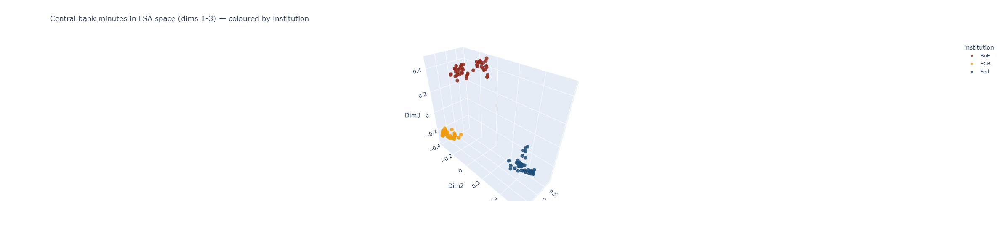

In [95]:
# ── 3D LSA scatter: documents coloured by institution ────────────────────────────
# Each point is one meeting. Hover to see institution, date, and LSA coordinates.
# The 3D view allows us to see simultaneously how institutions and time periods separate.

df_lsa = pd.DataFrame(X_lsa[:, :3], columns=['Dim1', 'Dim2', 'Dim3'])
df_lsa['institution'] = df['institution'].values
df_lsa['year']        = df['date'].dt.year.values
df_lsa['label']       = df['institution'] + ' ' + df['date'].dt.strftime('%b %Y')

fig = px.scatter_3d(
    df_lsa, x='Dim1', y='Dim2', z='Dim3',
    color='institution',
    color_discrete_map=INST_COLOURS,
    hover_name='label',
    hover_data={'year': True, 'Dim1': ':.3f', 'Dim2': ':.3f', 'Dim3': ':.3f'},
    title='Central bank minutes in LSA space (dims 1-3) — coloured by institution',
    opacity=0.85,
)
fig.update_traces(marker=dict(size=5))
fig.update_layout(height=560)
fig.show()


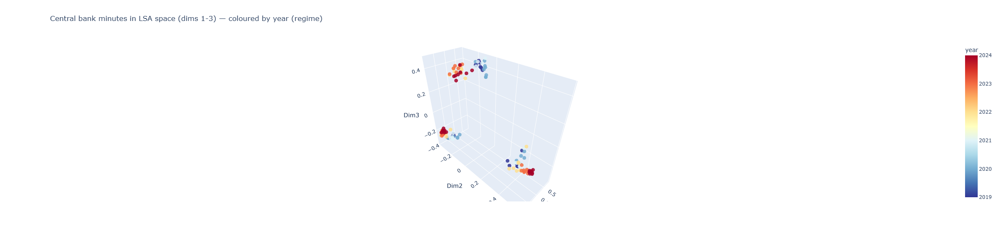

In [97]:
# ── 3D LSA scatter: documents coloured by year (macro regime) ──────────────────
# This version often reveals the macro-regime structure more clearly.
# Look for 2020-2021 forming a distinct cluster, and 2022 as an outlier.

fig2 = px.scatter_3d(
    df_lsa, x='Dim1', y='Dim2', z='Dim3',
    color='year',
    color_continuous_scale='RdYlBu_r',
    hover_name='label',
    title='Central bank minutes in LSA space (dims 1-3) — coloured by year (regime)',
    opacity=0.85,
)
fig2.update_traces(marker=dict(size=5))
fig2.update_layout(height=560)
fig2.show()


#### 3D scatter interpretations:

**Reading the institution scatter.** The three institutions form almost completely separate clusters with virtually no overlap. This is a striking result: in the first three LSA dimensions, you can identify which institution wrote a document almost perfectly from its position in the space alone. This confirms what the term loadings showed — Dims 2 and 3 are institution axes, and they dominate the 3D representation. The BoE cluster (red) sits high on Dim3, the ECB cluster (orange) sits low and central, and the Fed cluster (blue) sits to the right and low.

**Reading the year scatter.** Within each institution cluster, the year colouring reveals the temporal structure. The colour gradient — dark blue (2019) through teal (2020–2021) to orange-red (2022–2024) — is visible within each cluster, meaning the economic cycle does leave a linguistic trace even within institution-specific vocabulary. But the within-cluster temporal variation is much smaller than the between-cluster institutional variation. The macro regime signal is present but secondary to institutional identity in this 3D representation.

To see the temporal structure more clearly you would need to look at Dims 4 and 5 — the dimensions that actually capture economic content — which are not shown in this 3D plot. This is a useful limitation to discuss: the choice of which three dimensions to visualise shapes what story the plot tells.



## PART 5 — Latent Dirichlet Allocation (LDA)

### 5.1 From geometry to probability

LSA is geometric: it finds directions of maximum variance and places documents along axes. The dimensions it discovers are mathematical constructs — they explain variance, but they do not correspond to interpretable themes in any guaranteed sense. A document's coordinates can be negative, and a dimension can mix vocabulary from unrelated economic concepts if they happen to co-vary in the data.

LDA takes a completely different approach. Rather than finding directions of variance, it asks: *what probabilistic process could have generated these documents?* It then fits that process to the data.

**The intuition.** Imagine a central bank official writing a set of meeting minutes. Before writing, they decide how much the document will be about each of several broad themes — say, 60% inflation, 30% financial stability, 10% forward guidance. This mixture is specific to this meeting. Then, for each word they write, they first pick a theme according to that mixture, then pick a word from the vocabulary typical of that theme. *"Inflation"*, *"prices"*, and *"wages"* are typical of the inflation theme. *"Liquidity"*, *"spread"*, and *"volatility"* are typical of financial stability.

LDA formalises this as a generative model:

```mermaid
graph TD
    A["For each topic k = 1...K<br>────────────────<br>Draw a distribution over vocabulary<br>phi_k ~ Dirichlet(beta)<br><br>This defines what words<br>are typical of topic k"]
    C["For each document d<br>────────────────<br>Draw a mixture over topics<br>theta_d ~ Dirichlet(alpha)<br><br>This defines how much<br>the document is about each topic"]
    C --> E["For each word position in document d<br>────────────────<br>1. Sample a topic z ~ Multinomial(theta_d)<br>2. Sample a word w ~ Multinomial(phi_z)"]

    style A fill:#1a5276,color:#fff
    style C fill:#922b21,color:#fff
    style E fill:#1e8449,color:#fff
```

The **Dirichlet distribution** is the key ingredient. It is a distribution *over distributions* — it generates probability vectors that sum to 1. The parameter $\alpha$ controls how spread out or concentrated the document-topic mixtures are: low $\alpha$ produces sparse mixtures where each document is dominated by one or two topics; high $\alpha$ produces uniform mixtures where each document covers all topics roughly equally. The same logic applies to $\beta$ for the topic-word distributions.

**What LDA actually does.** We never observe the topics, the per-document mixtures, or which topic generated each word — only the words themselves. LDA *inverts* the generative process: given the observed words across all documents, it finds the topics $\phi_k$ and document mixtures $\theta_d$ that best explain what was written. This is done through approximate inference — the exact computation is intractable for realistic vocabulary sizes.

**Key practical differences from LSA:**

| | LSA | LDA |
|---|---|---|
| Output per document | Signed coordinate on each dimension | Probability distribution over K topics (sums to 1, all ≥ 0) |
| Interpretation | Geometric — can be negative, hard to name | Probabilistic — *"this meeting was 60% inflation, 30% financial stability"* |
| Topics interpretable? | Not directly — dimensions capture variance, not themes | Yes — each topic is a distribution over words that can be named |
| Input required | TF-IDF or counts | **Raw counts only** — TF-IDF values are not valid inputs |
| Number of topics | Chosen as $k$ | Chosen as $K$ |
| Documents forced into topics? | Yes — every document has a coordinate on every dimension | Soft — every document has some weight on every topic, but sparse priors concentrate weight |

**Critical implementation note:** LDA requires raw word counts, not TF-IDF. The model assumes each word is drawn from a multinomial distribution — a count process. TF-IDF values are real numbers that can be less than 1, which is not a valid input to a multinomial likelihood. We use `X_count` throughout this section.




In [100]:
# ── Fit LDA (K=5) ───────────────────────────────────────────────────────────────
# IMPORTANT: LDA uses X_count (raw counts), NOT X_tfidf.
# doc_topic_prior=0.1: encourages sparse document-topic distributions
#   (most documents dominated by 1-2 topics)
# topic_word_prior=0.01: encourages sparse topic-word distributions
#   (each topic defined by a small number of characteristic words)

K = 5
lda = LatentDirichletAllocation(
    n_components=K,
    random_state=SEED,
    max_iter=20,
    learning_method='batch',
    doc_topic_prior=0.1,
    topic_word_prior=0.01,
)
lda.fit(X_count)

# These labels are provisional placeholders.
# Rename them after inspecting the top words below.
TOPIC_LABELS = ['ECB\nMinutes', 'BoE\nMinutes', 'Fed\nMinutes',
                'Dovish /\nEasing', 'Forward\nGuidance']

print(f'LDA topics (K={K}), top 15 words each:\n')
for k, component in enumerate(lda.components_):
    top_words = [count_vocab[i] for i in component.argsort()[-15:][::-1]]
    label = TOPIC_LABELS[k].replace('\n', ' ')
    print(f'Topic {k+1} [{label}]:')
    print('  ' + ' | '.join(top_words))
    print()


LDA topics (K=5), top 15 words each:

Topic 1 [ECB Minutes]:
  inflation | policy | rate | monetary | monetary policy | market | euro | term | price | area | euro area | growth | risk | council | governing

Topic 2 [BoE Minutes]:
  inflation | price | rate | bank | increase | expect | rise | policy | report | committee | market | mpc | monetary | level | term

Topic 3 [Fed Minutes]:
  market | participant | committee | rate | inflation | economic | policy | reserve | federal | board | price | percent | federal reserve | monetary | financial

Topic 4 [Dovish / Easing]:
  inflation | rate | policy | price | monetary | growth | bank | monetary policy | expect | market | fall | mpc | report | committee | increase

Topic 5 [Forward Guidance]:
  inflation | participant | rate | board | market | policy | committee | remain | reserve | federal | division | economic | monetary | percent | increase




**Interpreting the topics.** The results are striking: the first three topics are almost entirely defined by institution-specific vocabulary rather than economic content — *"euro area"*, *"governing council"* (ECB), *"mpc"*, *"bank rate"* (BoE), *"participant"*, *"federal reserve"*, *"division"* (Fed). LDA has, like LSA before it, discovered that the most statistically coherent structure in this corpus is *which institution wrote the document*, not *what economic topic it covers*.

This is an important finding about the data, not a failure of the method. It tells us that institutional communication style is the dominant source of vocabulary variation across our 144 documents — strong enough to overwhelm the economic content signal when all three institutions are pooled together. Topics 4 and 5 begin to show some economic differentiation, but they too are contaminated by institution-specific terms.

There are two ways to address this in practice: extend the domain stopword list to remove more institution-specific boilerplate, or run LDA separately per institution so that it finds economic themes within each corpus rather than across all three. For this notebook we accept it as a finding and move on to keyness analysis, which is better suited to cross-institution comparison.

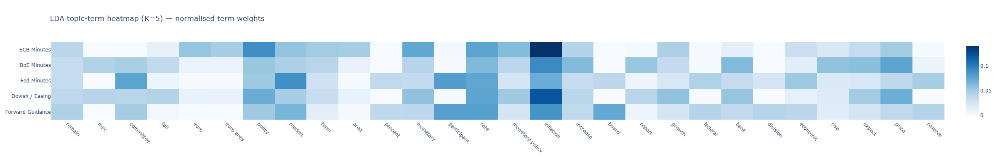

In [102]:
# ── Topic-term heatmap ──────────────────────────────────────────────────────────
# Shows the normalised term weight for each topic-term pair.
# Darker = term is more characteristic of that topic.
# Well-separated topics should have each column dominated by one or two rows.

n_display = 12
top_idx = set()
for component in lda.components_:
    top_idx.update(component.argsort()[-n_display:][::-1].tolist())
top_idx = list(top_idx)

heatmap_data  = lda.components_[:, top_idx]
heatmap_data  = heatmap_data / heatmap_data.sum(axis=1, keepdims=True)
heatmap_terms = [count_vocab[i] for i in top_idx]

fig = px.imshow(
    heatmap_data,
    x=heatmap_terms,
    y=[l.replace('\n',' ') for l in TOPIC_LABELS],
    color_continuous_scale='Blues',
    title=f'LDA topic-term heatmap (K={K}) — normalised term weights',
    aspect='auto', height=380,
)
fig.update_xaxes(tickangle=45)
fig.show()


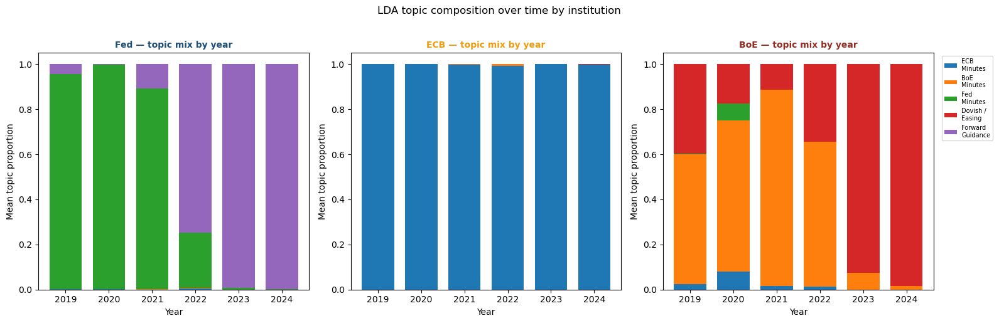

In [103]:
# ── Document-topic proportions over time, per institution ──────────────────────
# The stacked bars show how each institution's topic mix has evolved across our
# four macro regimes. This is the most interpretively rich visualisation in Part 5.

doc_topic = lda.transform(X_count)

df_topics = pd.DataFrame(doc_topic, columns=TOPIC_LABELS)
df_topics['institution'] = df['institution'].values
df_topics['year']        = df['date'].dt.year.values

topic_colours = sns.color_palette('tab10', K)

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, inst in zip(axes, ['Fed', 'ECB', 'BoE']):
    sub = df_topics[df_topics['institution']==inst].groupby('year')[TOPIC_LABELS].mean()
    sub.plot(kind='bar', stacked=True, ax=ax,
             color=topic_colours, legend=(inst=='BoE'), width=0.75)
    ax.set_title(f'{inst} — topic mix by year', fontsize=10,
                 color=INST_COLOURS[inst], fontweight='bold')
    ax.set_xlabel('Year'); ax.set_ylabel('Mean topic proportion')
    ax.tick_params(axis='x', rotation=0)
    if inst == 'BoE':
        ax.legend(fontsize=7, bbox_to_anchor=(1.02, 1), loc='upper left')

plt.suptitle('LDA topic composition over time by institution', y=1.02, fontsize=12)
plt.tight_layout(); plt.show()


**Reading the stacked bars.** The results confirm and extend what we found in LSA: institutional identity dominates.

The **Fed panel** is almost entirely green (Fed Minutes topic) throughout, with a small purple (Forward Guidance) segment appearing from 2022 onwards. The model has assigned all Fed documents to the Fed topic with very high probability — there is almost no temporal variation visible.

The **ECB panel** is uniformly blue (ECB Minutes topic) across all six years, with a tiny sliver of another topic appearing only in 2022. The ECB's communication is so stylistically consistent that LDA essentially places every ECB document in a single topic regardless of year.

The **BoE panel** is the most interesting and the most mixed. 2019 shows a large orange (BoE Minutes) component alongside red (Dovish/Easing). 2020 shows a distinctive shift — the green (Fed Minutes) and orange components both appear, suggesting the emergency language that year borrowed vocabulary from across institutions. From 2021 onwards the red (Dovish/Easing) topic becomes increasingly dominant, which is counterintuitive given that the BoE was hiking from late 2021. This likely reflects that the "Dovish/Easing" label we assigned is not accurate — the topic may be capturing a more general economic deliberation vocabulary that the BoE uses more than the others.

The overall picture reinforces the diagnostic from the topic word lists: with K=5 and all three institutions pooled, LDA recovers institution identity rather than economic themes. The temporal variation that does exist (the BoE panel) is harder to interpret cleanly precisely because the topics are not clean economic themes. This is a useful teaching moment — **the quality of topic model output depends heavily on corpus composition**, and pooling very different document types can prevent meaningful topic discovery.



In [104]:
# ── pyLDAvis interactive topic visualisation ───────────────────────────────────
# pyLDAvis creates an interactive two-panel visualisation:
# LEFT: topics as circles sized by prevalence, positioned by inter-topic distance
#   - Well-separated circles = distinct topics (good)
#   - Overlapping circles = topics are too similar (K too large)
# RIGHT: for any selected topic, the most 'salient' terms
#   - Salience balances how frequent a term is within the topic
#     against how frequent it is across all topics
#   - The lambda slider adjusts this trade-off

vis_data = {
    'topic_term_dists': lda.components_ / lda.components_.sum(axis=1)[:, None],
    'doc_topic_dists':  doc_topic,
    'doc_lengths':      np.array(X_count.sum(axis=1)).flatten(),
    'vocab':            list(count_vocab),
    'term_frequency':   np.array(X_count.sum(axis=0)).flatten(),
}
vis = pyLDAvis.prepare(**vis_data, sort_topics=False)
pyLDAvis.display(vis)



#### How to read a pyLDAvis output.

The visualisation has two panels that work together.

**Left panel — intertopic distance map.** Each circle is a topic. The size of the circle represents the topic's prevalence in the corpus — how many words across all documents are assigned to it. The position of the circles represents semantic distance: topics that share a lot of vocabulary are placed close together, topics with distinct vocabularies are far apart. Well-separated, non-overlapping circles of similar size are the sign of a good topic model. Overlapping circles mean the topics are not genuinely distinct; very small circles mean a topic is marginal and may not be meaningful.

**Right panel — term salience.** When no topic is selected, this shows the 30 most *salient* terms across the whole corpus — terms that are both frequent and distinctive. When you click a topic, it shows the most salient terms for that topic, defined by the relevance score:

$$\text{relevance}(t, k) = \lambda \log p(t|k) + (1-\lambda) \log \frac{p(t|k)}{p(t)}$$

At $\lambda = 1$: terms are ranked purely by how frequently they appear within the topic. At $\lambda = 0$: terms are ranked purely by how exclusively they appear in this topic and not others. The default $\lambda \approx 0.6$ balances both. Sliding toward 0 is useful for finding the terms that truly define a topic rather than just the terms that are common everywhere.

**Suggested workflow:** (1) check whether topics are well-separated in the left panel; (2) note whether any topics overlap or are very small; (3) click each topic and slide λ to around 0.6 to find its most distinctive terms; (4) compare with the top-word lists and stacked bar charts to build a consistent interpretation.

#### Reading our specific output.

**Left panel.** Topics 1 (ECB) sits alone on the left, well-separated from the others: its vocabulary is sufficiently distinct that LDA has no trouble identifying it. Topics 2 and 4 cluster together on the lower left, both BoE-related, partially overlapping. Topics 3 and 5 overlap substantially on the right: both capture Fed vocabulary and are hard to distinguish from each other. This overlap is a warning sign: it suggests K=5 may be slightly too large for this corpus, or more likely that the Fed documents do not split cleanly into two distinct topics given the current stopword list. The marginal topic distribution shows Topic 1 (ECB) is the largest, consistent with the ECB's longer documents.

**Right panel.** The top salient terms at λ=1 are dominated by institutional boilerplate: *"participant"*, *"board"*, *"mpc"*, *"committee"*, *"report"*, *"bank"*. Economic terms (*"price"*, *"inflation"*, *"rate"*) appear but only further down the list. This is the clearest possible signal from the visualisation that the stopword list needs extending — the model is spending most of its capacity explaining institutional vocabulary rather than economic content. Try sliding λ toward 0.3 with Topic 1 selected: ECB-specific vocabulary (*"governing council"*, *"euro area"*) should become more prominent as the shared boilerplate drops away.


### 5.2 Choosing K

Choosing the number of topics K is more art than science. Two broad approaches exist:

**Quantitative:** compute a measure of topic quality (perplexity, or coherence scores like $C_V$ or NPMI) for different values of K and look for an elbow or a maximum. These metrics have limitations — lower perplexity does not always mean more interpretable topics — but they provide a principled starting point.

**Qualitative:** fit models for several values of K, inspect the top words of each topic, and ask whether the topics are distinct, coherent, and interpretable. A topic whose top words are a random mix of unrelated terms is a sign K is too large; topics that are hard to distinguish from each other suggest K is too small.

For this corpus, economic reasoning gives us a prior: central bank deliberations in 2019–2024 revolved around a small number of distinct macro themes. We expect approximately 5 coherent topics:

1. **Inflation and prices** — the dominant theme of 2022–2023
2. **Labour market and real economy** — especially prominent in Fed minutes given the dual mandate
3. **Financial stability and markets** — asset prices, spreads, liquidity conditions
4. **Emergency / COVID / QE** — the distinctive vocabulary of 2020–2021
5. **Forward guidance and communication** — how institutions signal future intentions

We started with K=5 and assessed the result qualitatively. If topics overlap substantially or contain incoherent vocabulary, we revisit.


K= 3  perplexity=  1772.5  coherence=0.017  stability=0.685
K= 4  perplexity=  1757.0  coherence=0.013  stability=0.757
K= 5  perplexity=  1737.2  coherence=0.018  stability=0.805
K= 6  perplexity=  1732.4  coherence=0.015  stability=0.816
K= 7  perplexity=  1720.9  coherence=0.024  stability=0.806
K= 8  perplexity=  1734.3  coherence=0.112  stability=0.734
K=10  perplexity=  1736.9  coherence=0.070  stability=0.662


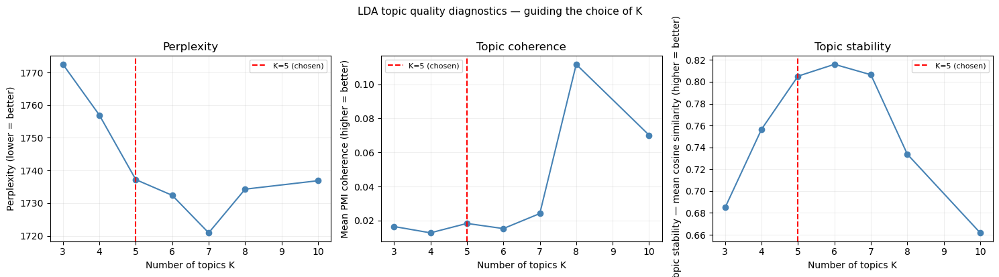


Interpretation guide:
  Perplexity:  tends to decrease monotonically with K — not sufficient alone
  Coherence:   look for a peak or elbow — topics become less coherent past it
  Stability:   look for K where topics are reproducible across random seeds
  K=5 chosen as a balance across all three metrics and domain knowledge.


In [106]:
# ── Topic quality diagnostics ──────────────────────────────────────────────────
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import matplotlib.pyplot as plt

K_range = [3, 4, 5, 6, 7, 8, 10]
n_runs  = 3
n_top   = 10

# Pre-compute once: binary document-term matrix and marginal word probabilities
# Shape: (n_docs, n_terms) — sparse, so convert to array only for marginals
X_bin    = (X_count > 0).astype(np.float32)          # sparse binary matrix
p_w      = np.asarray(X_bin.mean(axis=0)).flatten()  # P(w) for each term

def pmi_coherence(components, X_bin, p_w, n_top):
    """
    Vectorised PMI coherence for all topics simultaneously.
    components: (K, n_terms) normalised topic-word matrix
    Returns mean PMI coherence across all topics.
    """
    K = components.shape[0]
    topic_coherences = []

    for topic in components:
        top_idx = topic.argsort()[-n_top:]          # top n_top term indices

        # Extract the binary columns for top words: shape (n_docs, n_top)
        top_cols = np.asarray(X_bin[:, top_idx].todense())

        # Co-occurrence matrix: (n_top, n_top) — P(wi, wj)
        p_wij = (top_cols.T @ top_cols) / X_bin.shape[0]

        # Marginal probabilities for top words: (n_top,)
        p_wi = p_w[top_idx]

        # PMI matrix: log P(wi,wj) / (P(wi) * P(wj))
        # outer product gives P(wi)*P(wj) for all pairs
        denom = np.outer(p_wi, p_wi)
        with np.errstate(divide='ignore', invalid='ignore'):
            pmi_matrix = np.where(
                (p_wij > 0) & (denom > 0),
                np.log(p_wij / denom),
                0.0
            )

        # Upper triangle only (avoid double-counting pairs)
        mask = np.triu(np.ones((n_top, n_top), dtype=bool), k=1)
        topic_coherences.append(pmi_matrix[mask].mean())

    return np.mean(topic_coherences)


def topic_stability(K, X_count, n_runs, lda_kwargs):
    """
    Fit LDA n_runs times, align topics greedily by cosine similarity,
    return mean similarity between run 0 and all other runs.
    """
    topic_sets = []
    for run in range(n_runs):
        lda_run = LatentDirichletAllocation(random_state=run, **lda_kwargs)
        lda_run.fit(X_count)
        normed = lda_run.components_ / lda_run.components_.sum(axis=1, keepdims=True)
        topic_sets.append(normed)

    run_sims = []
    for run in range(1, n_runs):
        sim = cosine_similarity(topic_sets[0], topic_sets[run])  # (K, K)
        # Greedy alignment via row-wise argmax
        used, matched = set(), []
        for i in range(K):
            row  = sim[i].copy()
            row[list(used)] = -1
            j    = row.argmax()
            matched.append(sim[i, j])
            used.add(j)
        run_sims.append(np.mean(matched))

    return np.mean(run_sims)


perplexities, coherences, stability_scores = [], [], []

lda_kwargs = dict(max_iter=20, learning_method='batch',
                  doc_topic_prior=0.1, topic_word_prior=0.01)

for K in K_range:
    lda_tmp = LatentDirichletAllocation(
        n_components=K, random_state=SEED, **lda_kwargs
    )
    lda_tmp.fit(X_count)

    # Normalised topic-word distributions
    normed = lda_tmp.components_ / lda_tmp.components_.sum(axis=1, keepdims=True)

    perplexities.append(lda_tmp.perplexity(X_count))
    coherences.append(pmi_coherence(normed, X_bin, p_w, n_top))
    stability_scores.append(topic_stability(K, X_count, n_runs, lda_kwargs))

    print(f'K={K:2d}  perplexity={perplexities[-1]:8.1f}  '
          f'coherence={coherences[-1]:.3f}  '
          f'stability={stability_scores[-1]:.3f}')

# ── Plot ───────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
labels    = ['Perplexity (lower = better)',
             'Mean PMI coherence (higher = better)',
             'Topic stability — mean cosine similarity (higher = better)']
data      = [perplexities, coherences, stability_scores]
titles    = ['Perplexity', 'Topic coherence', 'Topic stability']

for ax, d, ylabel, title in zip(axes, data, labels, titles):
    ax.plot(K_range, d, marker='o', color='steelblue', linewidth=1.5)
    ax.axvline(5, color='red', linestyle='--', linewidth=1.5, label='K=5 (chosen)')
    ax.set_xlabel('Number of topics K')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.2)

plt.suptitle('LDA topic quality diagnostics — guiding the choice of K',
             y=1.02, fontsize=11)
plt.tight_layout()
plt.show()

print()
print('Interpretation guide:')
print('  Perplexity:  tends to decrease monotonically with K — not sufficient alone')
print('  Coherence:   look for a peak or elbow — topics become less coherent past it')
print('  Stability:   look for K where topics are reproducible across random seeds')
print('  K=5 chosen as a balance across all three metrics and domain knowledge.')

#### Interpretation of the diagnostic plots

**Reading the topic quality diagnostics.**

Before interpreting the curves, it helps to be precise about what each metric measures:

**Perplexity** is rooted in the concept of *surprise*. When you read a document, each word either fits what you expected given the context, or it surprises you. A good language model — one that has learned the genuine structure of the corpus — should be unsurprised by most words it encounters. A poor model, or one applied to text it was not designed for, will be frequently surprised.

Formally, perplexity is the exponentiated average negative log-likelihood per word:

$$\text{Perplexity} = \exp\left(-\frac{1}{N}\sum_{i=1}^{N} \log p(w_i)\right)$$

where $p(w_i)$ is the probability the model assigns to each observed word. A model that assigns high probability to the words it sees has low perplexity — it is rarely surprised. A model that assigns low probability has high perplexity — it is frequently surprised. The interpretation is intuitive: a perplexity of P means the model is roughly as uncertain at each word position as if it were choosing uniformly among P alternatives.

The problem with perplexity as a sole criterion for choosing K is that it almost always decreases as K increases — a model with more topics can always assign higher probability to the training data, regardless of whether the extra topics are interpretable or stable. This is why coherence and stability are needed alongside it.

**Coherence** is rooted in the concept of *semantic relatedness*. The intuition is straightforward: if a topic is genuinely about something, its top words should tend to appear in the same documents. A topic whose top words are *"inflation"*, *"price"*, *"wage"*, *"energy"* makes sense — these words co-occur because they are all discussed in the same economic context. A topic whose top words are *"inflation"*, *"lane"*, *"feasible"*, *"paragraph"* does not make sense — these words happen to load on the same statistical dimension but are not semantically related, and you would not expect to find them in the same sentences or paragraphs.

Coherence formalises this by measuring how often pairs of top words co-occur across documents, relative to how often they would co-occur by chance. The measure we use is based on **pointwise mutual information (PMI)**:

$$\text{PMI}(w_i, w_j) = \log \frac{P(w_i, w_j)}{P(w_i) \cdot P(w_j)}$$

where $P(w_i, w_j)$ is the fraction of documents containing both words, and $P(w_i)$, $P(w_j)$ are the marginal fractions. A positive PMI means the two words appear together more than chance; a negative PMI means they avoid each other. Topic coherence is the mean PMI across all pairs of top words, averaged across all topics. Higher coherence means the topics are more semantically tight — the words that define each topic genuinely belong together.

Unlike perplexity, coherence does not automatically improve with K. Adding more topics can actually hurt coherence if the extra topics are statistical artefacts that split coherent vocabulary across multiple dimensions rather than discovering new meaningful themes.

**Stability** is rooted in the concept of *reproducibility*. LDA is not a deterministic algorithm — it uses random initialisation and approximate inference, which means that running it twice on the same data with different random seeds can produce different results. If the corpus has genuine, well-separated topic structure, the same topics should emerge regardless of where the algorithm starts. If the corpus is ambiguous, or K is too large, different runs may converge to different local optima — the topics are present in some mathematical sense, but they are not robust.

We measure stability by fitting the model $n$ times with different random seeds and comparing the topics across runs. For each pair of runs, we align topics by maximum cosine similarity — matching each topic in run 1 to its closest counterpart in run 2 — and record the mean similarity of matched pairs:

$$\text{stability}(K) = \frac{1}{n-1}\sum_{\text{runs}} \frac{1}{K}\sum_{k=1}^{K} \max_{k'} \cos(\phi_k^{(1)}, \phi_{k'}^{(\text{run})})$$

where $\phi_k$ is the normalised topic-word distribution for topic $k$. A stability of 1.0 means the topics are identical across runs; a stability near 0 means they are essentially random. In practice, values above 0.8 indicate robust topic structure; values below 0.6 suggest the topics are sensitive to initialisation and should be interpreted with caution.

Stability tends to peak at an intermediate K and then decline. When K is too small, the model finds a stable but coarse solution — the same broad topics always emerge, but they lump together things that should be separate. When K is too large, the model has too many degrees of freedom and different runs emphasise different fine-grained distinctions, producing inconsistent results. The peak of the stability curve is therefore a principled guide to a K that is both expressive enough and robust enough.

**Reading our specific curves.**

**Perplexity** (left) decreases from K=3 to K=7, then rises slightly at K=8 before flattening. The minimum is at K=7, but the differences are small — perplexity alone does not strongly discriminate between K=5 and K=7.

**Coherence** (centre) is low and flat from K=3 to K=6, then spikes sharply at K=8 before falling at K=10. The spike at K=8 is suspicious — it may reflect a single topic with unusually co-occurring vocabulary rather than a genuine improvement across all topics. K=5 sits in the flat low-coherence region, which is consistent with our finding that the model is recovering institutional identity rather than coherent economic themes. Low coherence confirms the stopword problem: topics dominated by boilerplate words that appear everywhere will not show strong co-occurrence patterns.

**Stability** (right) peaks at K=5–6 and then declines steadily. This is the most useful signal here: K=5 produces topics that are reproducible across random seeds more reliably than larger K values. Beyond K=6, topics become less stable — the model is finding different local optima on different runs, which means the topic structure is not robust.

**The combined picture.** No single metric unambiguously points to K=5, but K=5 is defensible across all three: perplexity is near its minimum, coherence is not worse than alternatives, and stability is at its peak. The domain knowledge that five broad economic themes exist in this period provides the additional justification. We also note that the relatively low coherence across all K values is itself a diagnostic — it confirms that running LDA on a pooled corpus dominated by institutional vocabulary produces topics that are statistically present but not semantically tight. This is a finding, not a failure.


## PART 6 — Keyness Analysis: The Comparative Linguistics of Central Banks

### 6.1 What is keyness?

All the methods we have used so far — TF-IDF, LSA, LDA — describe the vocabulary of a corpus in isolation. They tell us what terms are important within a set of documents, or what latent structure underlies them. But they do not directly answer a comparative question: *what makes this corpus different from that one?*

**Keyness analysis** is designed precisely for this. It takes two corpora and asks: which words appear with statistically significantly different frequencies in one versus the other? A word is *key* to corpus A (relative to corpus B) if it appears much more often in A than would be expected if the two corpora were drawn from the same underlying distribution.

This is different from simply listing the most frequent words in A. A word can be extremely frequent in A but equally frequent in B — in which case it tells us nothing about the difference between them. Keyness is about *relative* frequency, controlled for corpus size.

The applications here are natural:

1. **Fed vs. ECB** — two major institutions with very different legal mandates, governance structures, and communication cultures
2. **Fed vs. BoE** — Anglo-Saxon peers that share some communication traditions but differ in mandate (dual vs. single inflation target) and document style
3. **Pre-2022 vs. 2022+** — the same institutions before and after the inflation shock, to find the linguistic fingerprint of the most dramatic monetary policy shift in four decades

### 6.2 The log-likelihood (G²) statistic

Several statistics can be used to measure keyness. They differ in what they control for and what they are sensitive to:

**Frequency difference** ($\text{freq}_A - \text{freq}_B$) is the simplest: just subtract raw counts. The problem is that it does not account for corpus size — if corpus A is ten times larger than corpus B, every word will tend to appear more often in A simply because there is more text.

**Log ratio** measures relative frequency on a logarithmic scale:
$$\text{log ratio} = \log_2\left(\frac{\text{freq}_A / \text{total}_A}{\text{freq}_B / \text{total}_B}\right)$$
A log ratio of +1 means a word appears twice as often (in relative frequency terms) in A as in B; +2 means four times as often. This is corpus-size independent and interpretable as an effect size, but it gives no sense of statistical significance — a word appearing 2 times in A and 1 time in B has a log ratio of 1, but this could easily be chance.

**Chi-squared ($\chi^2$)** is a classical test of independence between word occurrence and corpus membership. It gives a p-value but is unreliable for low-frequency words — the approximation it relies on breaks down when expected cell counts are small.

**Log-likelihood (G²)** is the preferred metric in corpus linguistics because it handles low-frequency words correctly and gives a proper significance test:

$$G^2 = 2 \sum O \log\left(\frac{O}{E}\right)$$

where $O$ is the observed frequency and $E$ is the expected frequency under the null hypothesis that the word is equally common in both corpora. Under the null, $G^2$ follows a chi-squared distribution with 1 degree of freedom, giving a p-value.

| Metric | Adjusts for corpus size | Handles rare words | Statistical significance | Effect size |
|---|---|---|---|---|
| Frequency difference | ❌ | ❌ | ❌ | ❌ |
| Log ratio | ✅ | ❌ (unstable for rare words) | ❌ | ✅ |
| Chi-squared | ✅ | ❌ (poor) | ✅ | ❌ |
| **Log-likelihood G²** | ✅ | ✅ | ✅ | needs log ratio |

We report **G²** for statistical significance and **log ratio** for effect size alongside it. A word can have very high G² (strongly significant) but a small log ratio (modest effect) in a large corpus — both quantities matter for interpretation. In practice we filter to p < 0.05 and then sort by G² to find the most robustly distinctive terms, using the log ratio to understand the magnitude of the difference.

In [107]:
# ── Keyness helper functions ──────────────────────────────────────────────────────
# compute_keyness: computes log-likelihood G^2 + log ratio for all terms
# plot_keyness:    bar chart of top N terms per corpus

def compute_keyness(corpus_a_texts, corpus_b_texts, label_a, label_b,
                    min_df=2, max_features=6000):
    vec   = CountVectorizer(ngram_range=(1,2), min_df=min_df, max_features=max_features)
    X_all = vec.fit_transform(list(corpus_a_texts) + list(corpus_b_texts))
    vk    = vec.get_feature_names_out()
    n_a   = len(corpus_a_texts)
    X_a, X_b = X_all[:n_a], X_all[n_a:]

    freq_a  = np.array(X_a.sum(axis=0)).flatten()
    freq_b  = np.array(X_b.sum(axis=0)).flatten()
    total_a = freq_a.sum()
    total_b = freq_b.sum()

    results = []
    for i, term in enumerate(vk):
        fa, fb = freq_a[i], freq_b[i]
        if fa + fb < 5: continue
        exp_a = total_a * (fa+fb) / (total_a+total_b)
        exp_b = total_b * (fa+fb) / (total_a+total_b)
        g2 = 0
        if fa > 0: g2 += 2 * fa * np.log(fa / exp_a)
        if fb > 0: g2 += 2 * fb * np.log(fb / exp_b)
        log_ratio = (np.log2((fa+0.5)/total_a) - np.log2((fb+0.5)/total_b))
        rel_a = (fa/total_a) * 10_000
        rel_b = (fb/total_b) * 10_000
        results.append({
            'term': term,
            f'freq_{label_a}': fa,    f'freq_{label_b}': fb,
            f'rel_{label_a}':  round(rel_a,2), f'rel_{label_b}': round(rel_b,2),
            'log_likelihood':  round(g2, 2),
            'log_ratio':       round(log_ratio, 3),
            'p_value':         1 - chi2_dist.cdf(g2, 1),
            'more_common_in':  label_a if rel_a > rel_b else label_b,
        })
    return (pd.DataFrame(results)
              .sort_values('log_likelihood', ascending=False)
              .reset_index(drop=True))


def plot_keyness(keyness_df, label_a, label_b, n=20,
                 colour_a='#1f4e79', colour_b='#922b21', title=None):
    top_a = keyness_df[keyness_df['more_common_in']==label_a].head(n)
    top_b = keyness_df[keyness_df['more_common_in']==label_b].head(n)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
    ax1.barh(top_a['term'][::-1], top_a['log_likelihood'][::-1], color=colour_a)
    ax1.set_title(f'Key terms — {label_a}', fontsize=11,
                  color=colour_a, fontweight='bold')
    ax1.set_xlabel('Log-likelihood (G²)')

    ax2.barh(top_b['term'][::-1], top_b['log_likelihood'][::-1], color=colour_b)
    ax2.set_title(f'Key terms — {label_b}', fontsize=11,
                  color=colour_b, fontweight='bold')
    ax2.set_xlabel('Log-likelihood (G²)')

    plt.suptitle(title or f'Keyness: {label_a} vs. {label_b}',
                 fontsize=12, y=1.01)
    plt.tight_layout(); plt.show()


# Prepare corpus strings
fed_texts  = df[df['institution']=='Fed']['text_clean'].tolist()
ecb_texts  = df[df['institution']=='ECB']['text_clean'].tolist()
boe_texts  = df[df['institution']=='BoE']['text_clean'].tolist()
pre_texts  = df[df['date'].dt.year < 2022]['text_clean'].tolist()
post_texts = df[df['date'].dt.year >= 2022]['text_clean'].tolist()

print('Corpus sizes:')
print(f'  Fed: {len(fed_texts)} documents')
print(f'  ECB: {len(ecb_texts)} documents')
print(f'  BoE: {len(boe_texts)} documents')
print(f'  Pre-2022: {len(pre_texts)} documents')
print(f'  2022+:    {len(post_texts)} documents')


Corpus sizes:
  Fed: 48 documents
  ECB: 48 documents
  BoE: 48 documents
  Pre-2022: 72 documents
  2022+:    72 documents


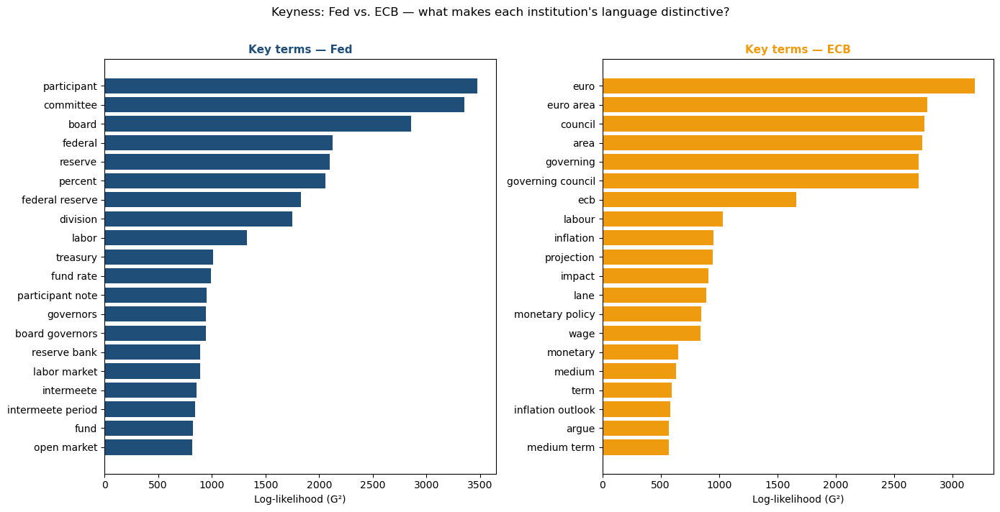

Top 8 Fed-characteristic terms (vs ECB):
           term  log_likelihood  log_ratio  rel_Fed  rel_ECB
    participant         3471.81      4.603   102.27     4.19
      committee         3349.96      7.691    81.68     0.38
          board         2855.70      7.353    70.21     0.41
        federal         2123.79      5.928    55.43     0.89
        reserve         2100.07      5.103    58.45     1.68
        percent         2059.61     11.459    48.38     0.00
federal reserve         1833.34      6.073    47.43     0.69
       division         1752.28     11.226    41.16     0.00

Top 8 ECB-characteristic terms (vs Fed):
             term  log_likelihood  log_ratio  rel_Fed  rel_ECB
             euro         3191.57     -6.036     1.15    76.20
        euro area         2785.71     -6.026     1.01    66.54
          council         2758.48     -8.384     0.17    60.73
             area         2740.07     -5.554     1.43    67.68
        governing         2711.73    -10.445     0.03

In [108]:
# ── Comparison 1: Fed vs ECB ───────────────────────────────────────────────────────
# Fed has a dual mandate (price stability + maximum employment);
# ECB has a single mandate (price stability in the euro area).
# These institutional differences should surface in the distinctive vocabulary.

kn_fed_ecb = compute_keyness(fed_texts, ecb_texts, 'Fed', 'ECB')
plot_keyness(kn_fed_ecb, 'Fed', 'ECB',
             colour_a=INST_COLOURS['Fed'], colour_b=INST_COLOURS['ECB'],
             title='Keyness: Fed vs. ECB — what makes each institution\'s language distinctive?')

print('Top 8 Fed-characteristic terms (vs ECB):')
print(kn_fed_ecb[kn_fed_ecb['more_common_in']=='Fed']
      [['term','log_likelihood','log_ratio','rel_Fed','rel_ECB']].head(8).to_string(index=False))
print()
print('Top 8 ECB-characteristic terms (vs Fed):')
print(kn_fed_ecb[kn_fed_ecb['more_common_in']=='ECB']
      [['term','log_likelihood','log_ratio','rel_Fed','rel_ECB']].head(8).to_string(index=False))


**Reading the Fed vs. ECB keyness.**

The results are striking but not surprising given what we already know about this corpus: both sides are dominated by institutional boilerplate rather than economic content.

On the **Fed side**, the top terms are *"participant"* (G²=3472, log ratio=4.60), *"committee"*, *"board"*, *"federal"*, *"reserve"*, *"percent"*, *"federal reserve"*, *"division"*. These are all structural vocabulary — how the Fed refers to its own members, its own institution, and its own internal organisation. The dual mandate does appear: *"labor"* and *"labor market"* are present, reflecting the FOMC's statutory obligation to pursue maximum employment alongside price stability. But they rank below the institutional boilerplate, suggesting that the employment mandate generates less distinctive vocabulary than the Fed's unique way of describing its own deliberative process.

The log ratios are very large — *"participant"* has a log ratio of 4.60, meaning it appears roughly 24 times more often in Fed documents than ECB documents in relative frequency terms. *"Percent"* has a log ratio of 11.46 — it is essentially absent from ECB documents (rel_ECB=0.00), reflecting the ECB's preference for expressing figures differently.

On the **ECB side**, the top terms are *"euro"*, *"euro area"*, *"council"*, *"area"*, *"governing"*, *"governing council"*, *"ecb"* — the multi-country institutional framing that defines every ECB account. *"Labour"* appears at position 9 with G²=1032, notable because it uses the British spelling while the Fed uses *"labor"* — a small but clean example of how even spelling conventions are institutionally distinctive. *"Projection"*, *"impact"*, *"lane"*, *"argue"* suggest the ECB's more analytical and argumentative register. *"Lane"* specifically refers to Philip Lane, the ECB's Chief Economist, who is frequently cited by name in the accounts.

The overall picture: keyness at the institution level primarily recovers communication style and institutional vocabulary, not economic content. This is consistent with the LSA and LDA findings. The economic differences between the two institutions — mandate, transmission mechanism, multi-country complexity — are present but secondary to the sheer volume of institutional boilerplate.



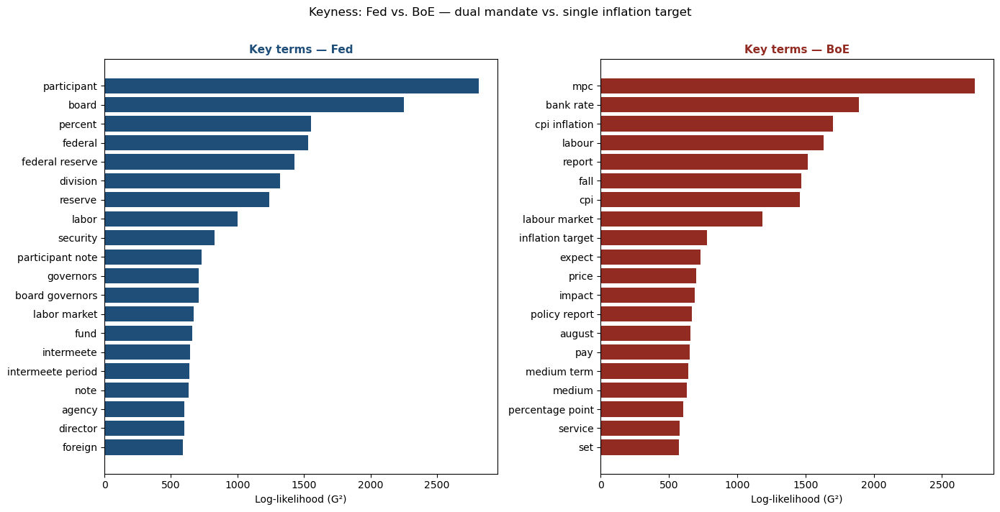

In [109]:
# ── Comparison 2: Fed vs BoE ───────────────────────────────────────────────────────
# Both are Anglo-Saxon institutions but differ in mandate, document style, and length.
# The BoE explicitly names vote splits in the text ('voted by a majority of 6-3');
# the Fed attributes views to 'some participants' / 'several participants'.

kn_fed_boe = compute_keyness(fed_texts, boe_texts, 'Fed', 'BoE')
plot_keyness(kn_fed_boe, 'Fed', 'BoE',
             colour_a=INST_COLOURS['Fed'], colour_b=INST_COLOURS['BoE'],
             title='Keyness: Fed vs. BoE — dual mandate vs. single inflation target')


**Reading the Fed vs. BoE keyness.**

This comparison is more economically interesting than Fed vs. ECB because the BoE side is cleaner.

On the **Fed side**, the same institutional vocabulary dominates: *"participant"*, *"board"*, *"percent"*, *"federal"*, *"federal reserve"*, *"division"*, *"reserve"*. Further down, *"security"*, *"fund"*, *"agency"*, *"foreign"*, *"intermeete"*, *"intermeete period"* reflect the Fed's unique procedural vocabulary — the intermeeting period, open market operations, Treasury securities. These are genuinely distinctive to the Fed and carry economic meaning: the Fed's balance sheet operations are more extensive and more explicitly discussed than the BoE's.

On the **BoE side**, the contrast is striking. The top terms are *"mpc"*, *"bank rate"*, *"cpi inflation"*, *"labour"*, *"report"*, *"fall"*, *"cpi"*, *"labour market"*, *"inflation target"*, *"policy report"*, *"pay"*, *"percentage point"*, *"service"*. This is substantively economic vocabulary — the BoE's minutes are dominated by explicit references to the inflation target, CPI, the labour market, and services inflation. The single mandate (price stability only, defined as 2% CPI) produces a tighter, more quantitative vocabulary than the Fed's dual mandate. *"August"* appearing in the list reflects the BoE's August Monetary Policy Report, which is its main forecast vehicle.

The dual mandate difference is clearly visible: *"labor"* and *"labor market"* appear on the Fed side, while *"labour"* and *"labour market"* appear on the BoE side — both institutions discuss employment, but the Fed discusses it more, and it registers as distinctive Fed vocabulary in the comparison against the BoE's inflation-focused language.

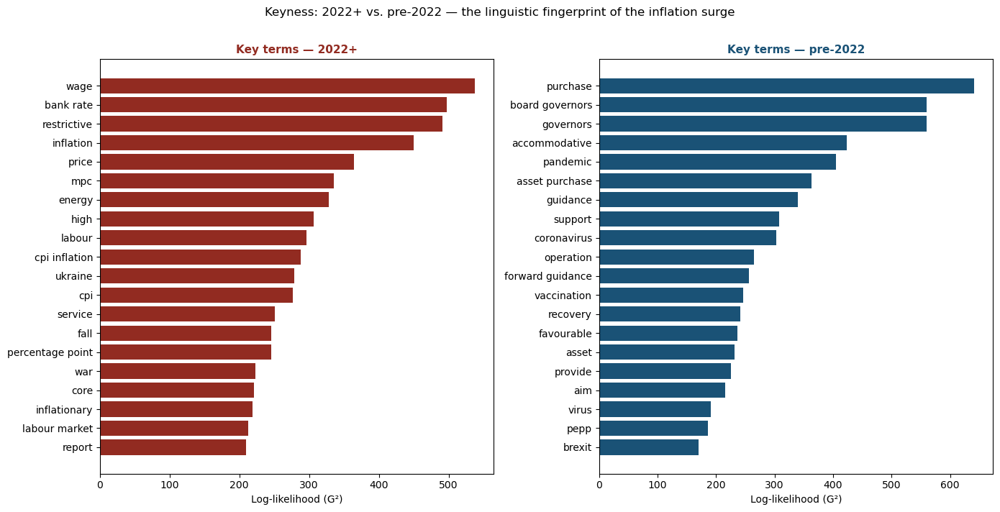

Terms that became most distinctive post-2022:
            term  log_likelihood  log_ratio
            wage          537.64      1.851
       bank rate          497.12      2.790
     restrictive          490.97      6.643
       inflation          450.04      0.566
           price          364.51      0.747
             mpc          335.85      1.651
          energy          328.41      1.326
            high          306.05      0.935
          labour          296.28      1.466
   cpi inflation          287.57      1.805
         ukraine          278.35      8.544
             cpi          277.06      1.629
         service          250.73      1.323
            fall          245.42      1.094
percentage point          245.22      2.066


In [110]:
# ── Comparison 3: Pre-2022 vs 2022+ (the inflation shock in language) ──────────
# This is the temporal comparison: what vocabulary became distinctive during
# the fastest tightening cycle in four decades?

kn_time = compute_keyness(post_texts, pre_texts, '2022+', 'pre-2022')
plot_keyness(kn_time, '2022+', 'pre-2022',
             colour_a='#922b21', colour_b='#1a5276',
             title='Keyness: 2022+ vs. pre-2022 — the linguistic fingerprint of the inflation surge')

print('Terms that became most distinctive post-2022:')
print(kn_time[kn_time['more_common_in']=='2022+']
      [['term','log_likelihood','log_ratio']].head(15).to_string(index=False))


**Reading the temporal keyness.**

This is the most substantively interesting comparison and the one most directly connected to the research question.

The **2022+ side** tells the story of the inflation surge in vocabulary. *"Wage"* is the single most distinctive term (G²=538, log ratio=1.85) — the concern about wage-price spirals that dominated central bank communication from 2022 onwards. *"Bank rate"* reflects the BoE's shift to active rate increases after years of holding. *"Restrictive"* has the highest log ratio of any term (6.64) — it was almost entirely absent before 2022 and became a defining word of the tightening cycle, used by all three institutions to describe their policy stance. *"Ukraine"* (log ratio=8.54) and *"energy"* reflect the supply shock that triggered the inflation surge. *"Core"* and *"inflationary"* reflect the shift toward analysing underlying inflation persistence. *"Service"* and *"services inflation"* reflect the stickiest component of inflation that kept central banks hawkish into 2023–2024.

The **pre-2022 side** is the vocabulary of two distinct earlier regimes compressed into one corpus. *"Purchase"*, *"asset purchase"*, *"operation"* reflect QE — quantitative easing programmes that were the dominant policy tool across 2020–2021. *"Accommodative"*, *"support"*, *"forward guidance"*, *"favourable"* are the language of ultra-loose monetary policy. *"Pandemic"*, *"coronavirus"*, *"vaccination"*, *"virus"*, *"recovery"* mark the COVID period specifically. *"Pepp"* is the ECB's Pandemic Emergency Purchase Programme — its presence confirms that the pre-2022 corpus is heavily shaped by ECB QE vocabulary. *"Brexit"* appears at the very bottom, a reminder that the BoE's pre-2022 language was also shaped by a purely UK-specific shock.

The log ratios here are smaller than in the institution comparisons — the largest is *"ukraine"* at 8.54, but most are between 1 and 3. This reflects that the temporal comparison is within the same institutions over time: the vocabulary does not change as dramatically as the vocabulary between institutions. What changes is the *emphasis* — the same words appear across both periods, but their relative frequency shifts. This is precisely why keyness is the right tool: it detects these shifts in emphasis that would be invisible to simple frequency counts.


## PART 7 — BERTopic: Context-Aware Topic Modelling

### 7.1 The limitation of bag-of-words

LSA and LDA both treat documents as **bags of words** — the order of words is irrelevant, and every term is an independent symbol with no relationship to any other term. This creates two fundamental problems.

**The context problem.** *"Inflation is transitory"* (the dominant Fed framing in 2021) and *"inflation is too high"* (the dominant framing from 2022) contain almost identical vocabulary. In a bag-of-words model, these two sentences are nearly identical — both contain *"inflation"*, both contain *"is"*. The word that matters — *"transitory"* vs. *"too high"* — is present in both, but the model has no way of knowing that the surrounding context completely changes the meaning. More starkly: *"not inflation"* and *"inflation"* share the word *"inflation"* and look nearly identical to a bag-of-words model, despite meaning opposite things.

**The vocabulary problem.** LDA and LSA can only relate words to each other through co-occurrence — words are similar if they appear in the same documents. But *"restrictive"* and *"tight"* might rarely appear in the same document even though they mean the same thing in monetary policy context. A bag-of-words model will treat them as unrelated. Conversely, *"rate"* in *"interest rate"* and *"rate"* in *"inflation rate"* are treated as identical — the model cannot distinguish them because it has no access to context.

For central bank text, both problems are acute. Central bank communication is extraordinarily precise — small changes in wording are deliberate signals. *"Remain vigilant"* and *"remain watchful"* are near-synonyms; *"some members"* and *"many members"* signal very different levels of consensus. Bag-of-words models are blind to these distinctions.

### 7.2 Word embeddings — the foundation of BERTopic

Before explaining BERTopic, it helps to understand what an **embedding** is and why it solves the problems above.

An embedding is a dense vector of real numbers that represents a word, sentence, or document in a high-dimensional space. The key property is that **geometric distance in this space corresponds to semantic similarity** — words or documents that mean similar things end up close together, regardless of whether they share vocabulary.

Early word embeddings like Word2Vec assigned a single vector to each word regardless of context — *"bank"* always had the same vector whether it meant a financial institution or a riverbank. Modern embeddings from models like BERT are **contextual**: the vector assigned to *"bank"* depends on the surrounding words, so *"central bank"* and *"river bank"* produce different vectors for the same word.

BERT (Bidirectional Encoder Representations from Transformers) is pre-trained on massive text corpora to predict masked words from their context. In doing so, it learns representations that capture deep semantic relationships. The model we use — `all-MiniLM-L6-v2` — is a lightweight sentence transformer: it encodes entire sentences or short documents into a single 768-dimensional vector that captures the overall meaning of the text, including context, negation, and phrasing.

The result: *"inflation is transitory"* and *"inflation is too high"* produce very different vectors. *"Restrictive"* and *"tight monetary policy"* produce similar vectors. *"Raise rates"* and *"cut rates"* produce different vectors despite sharing two words. This is what bag-of-words models cannot do.

**On embeddings vs. DTM vectors:**

It is worth being precise about how an embedding vector differs from a DTM row, since both represent a document as a vector of numbers.

A DTM row is **sparse and interpretable**: each dimension corresponds to a specific word in the vocabulary, and the value is a count or TF-IDF weight. A document with 8,000 vocabulary terms has an 8,000-dimensional vector where most entries are zero. You can look at any dimension and say exactly what it means — dimension 423 is the TF-IDF weight of the word *"restrictive"* in this document.

An embedding vector is **dense and opaque**: every dimension is non-zero, but no dimension corresponds to a specific word. The 768 dimensions encode abstract semantic features learned during pre-training on billions of words. You cannot look at dimension 423 and say what it means. What you can say is that two documents with similar embedding vectors are semantically similar — they discuss similar ideas, in similar ways, even if they use different words.

```mermaid
graph TD
    A["DTM row<br>────────────────<br>8000 dimensions<br>~98% zeros<br>Each dim = one word<br>Interpretable<br>Order-independent"]
    B["Embedding vector<br>────────────────<br>768 dimensions<br>All non-zero<br>No dim = one word<br>Opaque<br>Context-dependent"]
    A -->|"Same word,<br>different context"| C["'bank' in 'central bank'<br>= same vector as<br>'bank' in 'river bank'"]
    B -->|"Same word,<br>different context"| D["'bank' in 'central bank'<br>≠ vector for<br>'bank' in 'river bank'"]
    style A fill:#922b21,color:#fff
    style B fill:#1a5276,color:#fff
```

### 7.3 How BERTopic works

BERTopic combines the embedding approach with the dimensionality reduction and clustering tools you already know from the anomaly detection weeks:

```mermaid
graph LR
    A["144 documents<br>(preprocessed text)"] --> B["Sentence transformer<br>all-MiniLM-L6-v2<br><br>Encodes each document<br>into a 768-dim vector<br>capturing full context"]
    B --> C["UMAP<br>768 → 5 dims<br><br>Preserves local structure:<br>similar documents<br>stay close together"]
    C --> D["HDBSCAN<br>clustering<br><br>Finds dense regions<br>automatically determines<br>number of clusters<br>outliers → topic -1"]
    D --> E["c-TF-IDF<br>representation<br><br>For each cluster,<br>finds the most distinctive<br>words using TF-IDF<br>at the cluster level"]
    style B fill:#1a5276,color:#fff
    style D fill:#922b21,color:#fff
    style E fill:#1e8449,color:#fff
```

**Step 1 — Embed.** Each document is encoded into a 768-dimensional dense vector. Unlike the sparse DTM (where most entries are zero and each dimension is a specific word), every dimension of this vector is non-zero and the dimensions have no direct interpretable meaning — they encode abstract semantic features learned during pre-training.

**Step 2 — Reduce.** 768 dimensions is too many for clustering to work reliably — the curse of dimensionality means that in very high-dimensional spaces, all points tend to be equally distant from each other, making clusters hard to find. UMAP reduces the 768-dimensional embeddings to 5 dimensions while preserving local structure: documents that are semantically similar in 768 dimensions remain close in 5 dimensions.

**Step 3 — Cluster.** HDBSCAN (Hierarchical Density-Based Spatial Clustering) finds dense regions in the 5-dimensional space. Unlike k-means, it does not require specifying the number of clusters in advance — it discovers however many dense regions exist. Documents that do not belong to any dense region are assigned to topic −1 (the outlier cluster).

**Step 4 — Represent.** For each cluster, BERTopic identifies the most distinctive words using **c-TF-IDF** — TF-IDF computed at the cluster level rather than the document level. Each cluster is treated as a single large document and TF-IDF is used to find words that are frequent within the cluster but rare across other clusters.

The result is a set of topics defined by semantically coherent documents (because the clustering was done in embedding space) and described by distinctive vocabulary (because c-TF-IDF finds the words that best characterise each cluster).

**Comparison with LDA:**

| | LDA | BERTopic |
|---|---|---|
| Word representation | Bag-of-words counts | Contextual 768-dim embeddings |
| *"Not good"* ≠ *"good"* | ❌ identical in bag-of-words | ✅ very different embeddings |
| *"Restrictive"* ≈ *"tight policy"* | ❌ unrelated unless they co-occur | ✅ close in embedding space |
| Number of topics | Must specify K | Automatically determined by HDBSCAN |
| Outlier handling | All documents forced into a topic | Documents that fit no topic → cluster −1 |
| Topic membership | Soft — every document has weights on all topics | Hard — each document assigned to one cluster |
| Computation | Fast (minutes) | Slower — embedding step dominates (GPU helps) |
| Interpretability | Topic proportions are probabilistic and intuitive | Topics are crisp but embedding space is opaque |

For our ~144-document corpus, BERTopic runs comfortably on CPU. The embedding step takes most of the time; the UMAP and HDBSCAN steps are fast. The `all-MiniLM-L6-v2` model produces embeddings of comparable quality to the full BERT model at roughly one-sixth of the computational cost.

**On HDBSCAN vs DBSCAN:**

DBSCAN (which you saw in the anomaly detection weeks) requires two parameters: `eps` (the neighbourhood radius) and `min_samples` (the minimum number of points to form a dense region). The problem is that `eps` implicitly assumes a uniform density — it draws circles of the same radius around every point. In a corpus like ours where some topics are tightly clustered and others are diffuse, a single `eps` value will either split tight clusters or merge loose ones.

**HDBSCAN** (Hierarchical DBSCAN) removes the `eps` parameter entirely. Instead of asking *"is this point within radius eps of enough neighbours?"*, it builds a hierarchy of clusters at all possible density thresholds simultaneously, then extracts the most stable clusters from that hierarchy. This makes it much more robust to variable-density data — it finds tight clusters where they exist and ignores sparse regions that DBSCAN would merge into a single large cluster. The `min_cluster_size` parameter replaces `eps` and is more intuitive: it simply sets the minimum number of documents needed to form a topic.

| | DBSCAN | HDBSCAN |
|---|---|---|
| Parameters | `eps`, `min_samples` | `min_cluster_size` only |
| Density assumption | Uniform — same `eps` everywhere | Variable — adapts to local density |
| Stability | Sensitive to `eps` choice | More robust |
| Hierarchy | No | Yes — extracts most persistent clusters |
| Outliers | Points outside all `eps`-balls | Points that never join a stable cluster |

**On c-TF-IDF vs TF-IDF:**

Standard TF-IDF computes term importance at the **document level**: a term is important if it is frequent in *this document* but rare across *all documents*. The unit of comparison is one document vs. the rest of the corpus.

**c-TF-IDF** (class-based TF-IDF) shifts the unit of comparison from documents to **classes** — in BERTopic's case, topics. All documents in a topic are concatenated into a single large pseudo-document, and TF-IDF is computed at this aggregate level. A term is important for a topic if it is frequent across the documents in *this topic* but rare across the documents in *other topics*.

$$\text{c-TF-IDF}(t, c) = \frac{f_{t,c}}{|c|} \times \log\left(1 + \frac{A}{\text{df}_t}\right)$$

where $f_{t,c}$ is the frequency of term $t$ in class $c$, $|c|$ is the total number of words in class $c$, $A$ is the average number of words per class, and $\text{df}_t$ is the number of classes containing term $t$.

| | TF-IDF | c-TF-IDF |
|---|---|---|
| Unit of analysis | One document vs. all documents | One topic (all its documents) vs. all topics |
| What "rare" means | Rare across individual documents | Rare across topics |
| Use case | Find distinctive terms in a single document | Find distinctive terms for a topic cluster |
| Input | Raw DTM | Aggregated topic-level term counts |

In [111]:
# ── Fit BERTopic ───────────────────────────────────────────────────────────────────
# Note: the preprocessed text (text_clean) is used for c-TF-IDF topic representation,
# but the RAW text would normally be used for the BERT embeddings to preserve context.
# We use cleaned text here for computational convenience; on a larger corpus
# you would pass raw text to the embedding model.

# BERT's context window is 512 tokens; truncate to ~400 words to stay within it.
texts_for_bert = (
    df['text_clean'].str.split().str[:400].str.join(' ').tolist()
)

BERTOPIC_AVAILABLE = False
try:
    from bertopic import BERTopic
    from sentence_transformers import SentenceTransformer

    embedding_model = SentenceTransformer('all-MiniLM-L6-v2')

    topic_model = BERTopic(
        embedding_model=embedding_model,
        nr_topics='auto',
        min_topic_size=4,           # small corpus: allow small topics
        verbose=True,
        calculate_probabilities=True,
    )
    topics, probs = topic_model.fit_transform(texts_for_bert)
    df['bertopic'] = topics

    n_topics   = len(set(topics)) - (1 if -1 in topics else 0)
    n_outliers = (np.array(topics) == -1).sum()
    print(f'BERTopic found {n_topics} topics')
    print(f'Outlier documents (topic -1): {n_outliers} of {len(topics)}')
    BERTOPIC_AVAILABLE = True

except ImportError:
    print('BERTopic or sentence-transformers not installed.')
    print('Install with: pip install bertopic sentence-transformers')
    BERTOPIC_AVAILABLE = False


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2026-03-23 09:06:33,449 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/5 [00:00<?, ?it/s]

2026-03-23 09:06:36,741 - BERTopic - Embedding - Completed ✓
2026-03-23 09:06:36,742 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-03-23 09:06:53,933 - BERTopic - Dimensionality - Completed ✓
2026-03-23 09:06:53,935 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-03-23 09:06:53,970 - BERTopic - Cluster - Completed ✓
2026-03-23 09:06:53,971 - BERTopic - Representation - Extracting topics using c-TF-IDF for topic reduction.
2026-03-23 09:06:54,071 - BERTopic - Representation - Completed ✓
2026-03-23 09:06:54,072 - BERTopic - Topic reduction - Reducing number of topics
2026-03-23 09:06:54,087 - BERTopic - Representation - Fine-tuning topics using representation models.
2026-03-23 09:06:54,140 - BERTopic - Representation - Completed ✓
2026-03-23 09:06:54,144 - BERTopic - Topic reduction - Reduced number of topics from 10 to 3


BERTopic found 2 topics
Outlier documents (topic -1): 3 of 144


In [112]:
# ── BERTopic: topic summary ─────────────────────────────────────────────────────
# Display the auto-discovered topics and their top representative words.
# Compare these with the LDA topics from Part 5: does BERTopic find more or fewer
# topics? Are the topics more or less interpretable?

if BERTOPIC_AVAILABLE:
    info = topic_model.get_topic_info()
    print(info[info['Topic'] != -1][['Topic','Count','Name']].to_string(index=False))
    print()
    for tid in sorted(t for t in set(topics) if t != -1):
        words = [w for w, _ in topic_model.get_topic(tid)[:8]]
        count = (np.array(topics) == tid).sum()
        print(f'Topic {tid:2d} (n={count:3d}): {" | ".join(words)}')
else:
    print('BERTopic not available. Install with: pip install bertopic sentence-transformers')


 Topic  Count                                Name
     0     95      0_inflation_policy_rate_market
     1     46 1_board_division_governors_director

Topic  0 (n= 95): inflation | policy | rate | market | monetary | euro | price | expect
Topic  1 (n= 46): board | division | governors | director | affairs | deputy | associate | federal


12it [00:00, 57.88it/s]


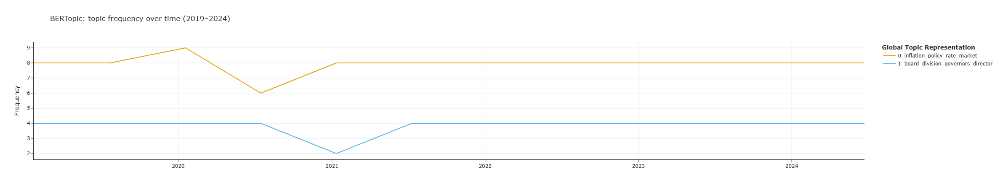

In [113]:
# ── BERTopic: topics over time ────────────────────────────────────────────────
# The topics_over_time method shows how topic prevalence changes across time bins.
# For a 6-year corpus, this should produce a curve for each topic showing
# when it was most active.

if BERTOPIC_AVAILABLE:
    try:
        tot = topic_model.topics_over_time(
            texts_for_bert, df['date'].tolist(), nr_bins=12
        )
        fig_tot = topic_model.visualize_topics_over_time(tot, top_n_topics=6)
        fig_tot.update_layout(
            title='BERTopic: topic frequency over time (2019–2024)', height=460
        )
        fig_tot.show()
    except Exception as e:
        print(f'Topics-over-time visualisation failed: {e}')
else:
    print('BERTopic not available — install to see this visualisation.')


**Reading the BERTopic output.**

BERTopic reduced 10 initial clusters to 3 (including outliers) — finding just 2 substantive topics plus a small outlier cluster of 3 documents. This is a much coarser structure than LDA's K=5, and it tells us something important about the corpus.

**Topic 0** (*inflation | policy | rate | market | monetary | euro | price | expect*, n=95) is the large general topic covering economic deliberation. It captures 66% of all documents: the broad monetary policy discussion that runs through all three institutions across all six years.

**Topic 1** (*board | division | governors | director | affairs | deputy | associate | federal*, n=46) is the Fed boilerplate topic — the attendee lists, staff titles, and organisational vocabulary that opens every FOMC document. This is the same structural vocabulary that dominated our TF-IDF and keyness results.

**Outliers** (topic −1, n=3): three documents that BERTopic could not confidently assign to either cluster. These are likely transitional meetings — possibly the emergency meetings of March 2020 whose vocabulary was sufficiently unusual to sit between the two main clusters.

**What this tells us.** BERTopic has found the same fundamental structure as every other method: the dominant source of variation in this corpus is the Fed's boilerplate vs. everyone else's economic content. With only 144 documents and three very different document styles pooled together, the embedding space collapses to this binary distinction. The auto-determined K=2 is HDBSCAN's way of saying: *"there are only two genuinely dense regions in this embedding space."* This is more honest than LDA's K=5, which forced five topics out of a corpus that may not contain five genuinely distinct clusters.

**The topics-over-time chart** shows Topic 0 (economic content) stable at 8 documents per time bin throughout, with a dip in 2020–2021 that likely reflects some emergency-language documents being harder to cluster. Topic 1 (Fed boilerplate) is flat at 4 documents per bin — consistently one-third of all meetings, matching the Fed's share of the corpus exactly.

**Comparison with LDA.** LDA gave us 5 topics, 3 of which were institution-identity topics. BERTopic gives us 2 topics, 1 of which is institution-identity. Both methods agree on the fundamental diagnosis: the corpus structure is dominated by who wrote the document, not what economic regime it was written in. BERTopic is simply more honest about the coarseness of that structure.

The productive discussion question is not *"which method is better?"* but *"what would change if we ran BERTopic separately per institution?"* Within a single institution's 48 documents, HDBSCAN might find more granular regime-based topics. This is the natural next step.



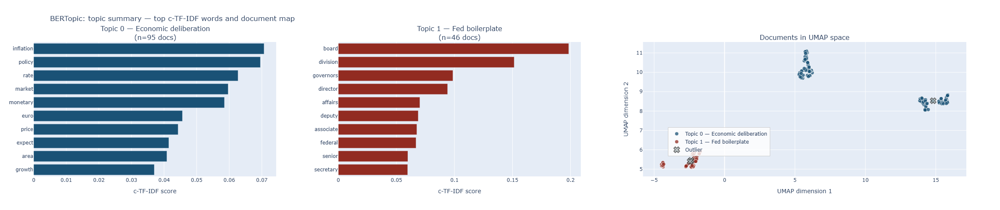

In [125]:
# ── BERTopic: custom topic visualisation ──────────────────────────────────────
# pyLDAvis-style summary: show the two topics side by side with their top words,
# document counts, and a 2D UMAP scatter coloured by topic assignment.
# BERTopic has its own .visualize_topics() but it requires plotly and can be
# slow. This custom version gives a cleaner lecture-friendly output.

# ── BERTopic: interactive topic visualisation ──────────────────────────────────
if BERTOPIC_AVAILABLE:


    topic_ids    = sorted(t for t in set(topics) if t != -1)
    topic_colors = {0: '#1a5276', 1: '#922b21', -1: '#aab7b8'}
    topic_names  = {0: 'Topic 0 — Economic deliberation',
                    1: 'Topic 1 — Fed boilerplate',
                    -1: 'Outlier'}

    fig = make_subplots(
        rows=1, cols=3,
        column_widths=[0.3, 0.3, 0.4],
        subplot_titles=[
            f'Topic 0 — Economic deliberation<br>(n={( np.array(topics)==0).sum()} docs)',
            f'Topic 1 — Fed boilerplate<br>(n={(np.array(topics)==1).sum()} docs)',
            'Documents in UMAP space'
        ]
    )

    # ── Left two panels: c-TF-IDF bar charts ──────────────────────────────────
    for panel, tid in enumerate(topic_ids):
        words_scores = topic_model.get_topic(tid)[:10]
        words  = [w for w, _ in words_scores][::-1]
        scores = [s for _, s in words_scores][::-1]
        fig.add_trace(
            go.Bar(
                x=scores, y=words, orientation='h',
                marker_color=topic_colors[tid],
                name=topic_names[tid],
                hovertemplate='%{y}: %{x:.4f}<extra></extra>',
                showlegend=False,
            ),
            row=1, col=panel + 1
        )

    # ── Right panel: UMAP scatter ──────────────────────────────────────────────
    try:
        umap_emb = topic_model.umap_model.embedding_
        topics_arr = np.array(topics)

        # Add institution and date info for hover
        hover_meta = (df_model_sorted['institution'] + ' — '
                      + df_model_sorted['date'].dt.strftime('%b %Y')).values \
                     if 'df_model_sorted' in dir() else \
                     (df['institution'] + ' — '
                      + df['date'].dt.strftime('%b %Y')).values

        for tid in list(topic_ids) + [-1]:
            mask = topics_arr == tid
            fig.add_trace(
                go.Scatter(
                    x=umap_emb[mask, 0],
                    y=umap_emb[mask, 1],
                    mode='markers',
                    marker=dict(
                        color=topic_colors[tid],
                        size=9 if tid != -1 else 12,
                        symbol='circle' if tid != -1 else 'x',
                        opacity=0.75,
                        line=dict(width=1, color='white') if tid != -1 else dict(width=2)
                    ),
                    name=topic_names[tid],
                    text=hover_meta[mask],
                    hovertemplate='%{text}<br>UMAP: (%{x:.2f}, %{y:.2f})<extra></extra>',
                ),
                row=1, col=3
            )
    except AttributeError:
        fig.add_annotation(text='UMAP embeddings not accessible',
                           row=1, col=3, showarrow=False)

    fig.update_xaxes(title_text='c-TF-IDF score', row=1, col=1)
    fig.update_xaxes(title_text='c-TF-IDF score', row=1, col=2)
    fig.update_xaxes(title_text='UMAP dimension 1', row=1, col=3)
    fig.update_yaxes(title_text='UMAP dimension 2', row=1, col=3)

    fig.update_layout(
        title='BERTopic: topic summary — top c-TF-IDF words and document map',
        height=500,
        hovermode='closest',
        legend=dict(x=0.68, y=0.15, bgcolor='rgba(255,255,255,0.8)',
                    bordercolor='#ccc', borderwidth=1),
    )
    fig.show()

else:
    print('BERTopic not available.')

**Reading the BERTopic topic summary.**

The two bar charts confirm the c-TF-IDF logic clearly. 

Topic 0's top terms — inflation, policy, rate, market, monetary, euro, price — are the core vocabulary of central bank economic deliberation, shared across all three institutions. The c-TF-IDF scores are modest (peaking around 0.065) because this vocabulary, while dominant within the topic, is not highly exclusive — these words appear to some degree even in the Fed boilerplate documents.

Topic 1's top terms — board, division, governors, director, affairs, deputy, associate, federal, senior, secretary — are almost entirely Fed staff titles and organisational hierarchy vocabulary. The c-TF-IDF scores are higher (peaking around 0.20) because these terms are far more exclusive: they appear heavily in the 46 Fed documents and barely at all in the ECB or BoE documents. High exclusivity is what drives high c-TF-IDF scores, and the Fed's unique attendee-list format produces exactly this kind of exclusive vocabulary.

The UMAP scatter is the most revealing panel. Hover over individual points to see which institution and meeting each represents. Three clusters are visible: the large blue mass (Topic 0, top right) contains most ECB and BoE documents plus the economic content sections of Fed documents; the red cluster (Topic 1, bottom left) contains the Fed boilerplate documents; and the three outlier crosses sit between the two main clusters — transitional documents whose embeddings did not fit cleanly into either dense region. The clean separation between the two clusters in UMAP space confirms that these are genuinely distinct document types, not arbitrary statistical constructs.

## PART 8 — Combined Analysis: Does Language Predict Market Reactions?

### 8.1 The research question, restated

We have spent Parts 2–7 characterising *what* central banks say. Now we ask whether it *matters* to markets.

The outcome variable is a **hawkish market surprise**: did the 5-year government bond yield rise ≥2bp on meeting day? A rising yield means markets updated their expectations of future rates upward: they interpreted the communication as more tightening-leaning than they had anticipated.

This is distinct from the rate decision itself. A hike that was fully priced in produces little yield reaction. An unchanged rate accompanied by hawkish language can produce a large one. The yield change captures the **informational content** of the meeting — what markets *learned* that they didn't already know.

### 8.2 Feature engineering

We build three feature sets and test whether adding text features improves prediction over structural features alone:

```mermaid
graph TD
    S["Structural features<br>(institution, rate decision, year, meeting #)"]
    L["LSA features<br>(10 document coordinates)"]
    D["LDA features<br>(5 topic proportions)"]
    S --> M1["Model 1: Structural only"]
    S --> M2["Model 2: Structural + LSA"]
    L --> M2
    S --> M3["Model 3: Structural + LDA"]
    D --> M3
    M1 --> AUC["5-fold CV AUC"]
    M2 --> AUC
    M3 --> AUC
    style AUC fill:#1a5276,color:#fff
```

If Models 2 or 3 outperform Model 1, the text contains predictive information not captured by the headline rate decision.


In [114]:
# ── Outcome variable ──────────────────────────────────────────────────────────────────
# Hawkish surprise: 5-year yield rose >= 2bp on meeting day
# The 2bp threshold is a modelling choice, not a natural boundary.
# It is low enough to capture genuine surprises without including noise.

THRESHOLD_BP = 2.0
df['hawkish_surprise'] = (df['yield_change_5y_bp'] >= THRESHOLD_BP).astype(int)

print('Hawkish surprise distribution (all institutions):')
print(df['hawkish_surprise'].value_counts()
        .rename({0: 'Dovish / neutral (yield flat or fell)', 1: 'Hawkish surprise (yield +2bp+)'}))
print()
print('By institution:')
print(df.groupby('institution')['hawkish_surprise']
        .value_counts(normalize=True).unstack().round(3).to_string())


Hawkish surprise distribution (all institutions):
hawkish_surprise
Dovish / neutral (yield flat or fell)    100
Hawkish surprise (yield +2bp+)            44
Name: count, dtype: int64

By institution:
hawkish_surprise      0      1
institution                   
BoE               0.708  0.292
ECB               0.625  0.375
Fed               0.750  0.250


**Reading the outcome distribution** 

44 of 144 meetings (30.6%) produced a hawkish surprise by the ≥2bp threshold — broadly consistent with what we would expect if markets are well-informed but not perfectly prescient. The distribution differs across institutions in an interesting way: the ECB has the highest hawkish surprise rate (37.5%), the BoE is in the middle (29.2%), and the Fed the lowest (25.0%). This is somewhat counterintuitive given that the Fed moved most aggressively in 2022 — it suggests that the Fed's more explicit forward guidance framework meant its moves were better anticipated by markets, while the ECB's later and less clearly telegraphed pivot produced more genuine surprises.
The 2bp threshold is a modelling choice that shapes these numbers directly. At 0bp nearly every meeting would show some surprise in one direction; at 10bp very few would qualify. The finding that text matters (or doesn't) will be sensitive to this choice, and a sensitivity analysis across thresholds is good practice in a research setting.


In [115]:
# ── Feature engineering ─────────────────────────────────────────────────────────────
# Drop rows with missing yield data (should be none with the current dataset).
# Build three feature matrices: structural only, +LSA, +LDA.

mask       = df['yield_change_5y_bp'].notna() & df['hawkish_surprise'].notna()
df_model   = df[mask].copy()
X_lsa_m    = X_lsa[mask]
doc_topic_m = doc_topic[mask]

# Structural features: institution (encoded), rate decision, year, meeting number
le = LabelEncoder()
df_model['institution_enc'] = le.fit_transform(df_model['institution'])
df_model['year']             = df_model['date'].dt.year
df_model['meeting_num']      = (
    df_model.groupby(['institution','year']).cumcount() + 1
)

scaler   = StandardScaler()
X_struct = scaler.fit_transform(
    df_model[['institution_enc','rate_decision_bp','year','meeting_num']]
)

# Text features (already on appropriate scales)
X_lsa_feats = X_lsa_m[:, :10]      # 10 LSA dimensions
X_lda_feats = doc_topic_m          # 5 LDA topic proportions (sum to 1)

X_struct_lsa = np.hstack([X_struct, X_lsa_feats])
X_struct_lda = np.hstack([X_struct, X_lda_feats])

y = df_model['hawkish_surprise'].values
print(f'Modelling dataset: {len(y)} meetings')
print(f'Hawkish surprises: {y.sum()} ({y.mean():.1%})')
print()
print('Feature set dimensions:')
print(f'  Structural only:  {X_struct.shape[1]} features')
print(f'  Structural + LSA: {X_struct_lsa.shape[1]} features')
print(f'  Structural + LDA: {X_struct_lda.shape[1]} features')


Modelling dataset: 144 meetings
Hawkish surprises: 44 (30.6%)

Feature set dimensions:
  Structural only:  4 features
  Structural + LSA: 14 features
  Structural + LDA: 9 features


In [119]:
# ── Cross-validated AUC comparison ────────────────────────────────────────────
# We use TimeSeriesSplit rather than StratifiedKFold because our observations
# are ordered in time. Random K-fold would allow the model to train on meetings
# that happened *after* the test meetings — leaking future information into the
# training set. TimeSeriesSplit always trains on the past and tests on the future,
# which is the only valid evaluation setup for time-ordered data.
#
# Concretely: with n_splits=5 on 144 meetings ordered by date, each fold
# trains on the first k/6 meetings and tests on the next k/6, expanding
# the training window at each step.
#
# Limitation: with only 144 observations, the early folds have very small
# training sets. This makes the AUC estimates noisy — treat them as
# directional indicators, not precise measurements.

# Sort by date to ensure temporal ordering
df_model_sorted = df_model.sort_values('date').reset_index(drop=True)

# Rebuild feature matrices in sorted order
sort_idx     = df_model.sort_values('date').index
pos_in_model = [df_model.index.get_loc(i) for i in sort_idx]

X_struct_s    = X_struct[pos_in_model]
X_struct_lsa_s = X_struct_lsa[pos_in_model]
X_struct_lda_s = X_struct_lda[pos_in_model]
y_s           = y[pos_in_model]

tscv = TimeSeriesSplit(n_splits=5)

feature_sets = {
    'Structural only':  X_struct_s,
    'Structural + LSA': X_struct_lsa_s,
    'Structural + LDA': X_struct_lda_s,
}

clf = LogisticRegression(max_iter=1000, random_state=SEED)

results = []
for fname, X_feat in feature_sets.items():
    scores = cross_val_score(clf, X_feat, y_s, cv=tscv, scoring='roc_auc')
    results.append({'Features': fname,
                    'AUC mean': round(scores.mean(), 3),
                    'AUC std':  round(scores.std(),  3),
                    'Fold AUCs': [round(s, 3) for s in scores]})

results_df = pd.DataFrame(results).sort_values('AUC mean', ascending=False)
print('Time-series CV ROC-AUC (Logistic Regression):')
print(results_df[['Features','AUC mean','AUC std']].to_string(index=False))
print()
print('Note: early folds have small training sets — high variance is expected.')
print('Fold-by-fold AUCs:')
for r in results:
    print(f"  {r['Features']:<25} {r['Fold AUCs']}")

Time-series CV ROC-AUC (Logistic Regression):
        Features  AUC mean  AUC std
Structural + LSA     0.470    0.048
Structural + LDA     0.441    0.098
 Structural only     0.437    0.081

Note: early folds have small training sets — high variance is expected.
Fold-by-fold AUCs:
  Structural only           [0.412, 0.385, 0.58, 0.462, 0.345]
  Structural + LSA          [0.462, 0.378, 0.503, 0.5, 0.504]
  Structural + LDA          [0.45, 0.326, 0.343, 0.5, 0.588]


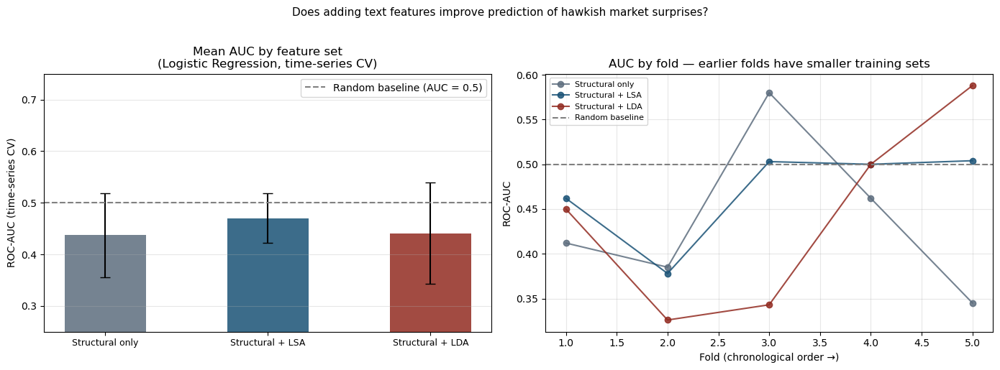

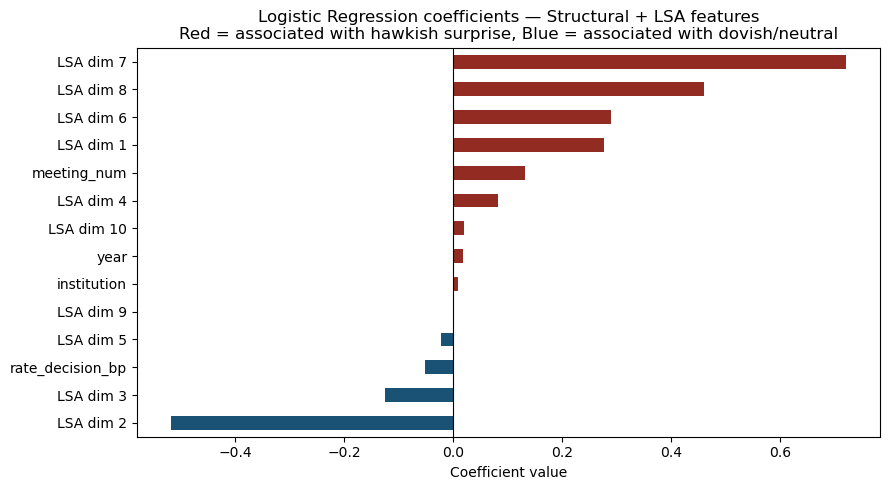

In [126]:
# ── Results bar chart ─────────────────────────────────────────────────────────
# Error bars show standard deviation across the 5 time-series folds.
# The dashed line is the random baseline (AUC = 0.5).
# All three feature sets sit near or below 0.5 — see interpretation below.

feat_labels = [r['Features'] for r in results]
means       = [r['AUC mean'] for r in results]
stds        = [r['AUC std']  for r in results]
colours     = ['#1a5276' if 'LSA' in f
               else '#922b21' if 'LDA' in f
               else '#5d6d7e' for f in feat_labels]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: mean AUC with error bars
axes[0].bar(feat_labels, means, color=colours, alpha=0.85, width=0.5)
axes[0].errorbar(feat_labels, means, yerr=stds,
                 fmt='none', color='black', capsize=5, linewidth=1.5)
axes[0].axhline(0.5, color='gray', linestyle='--', linewidth=1.5,
                label='Random baseline (AUC = 0.5)')
axes[0].set_ylabel('ROC-AUC (time-series CV)')
axes[0].set_ylim(0.25, 0.75)
axes[0].set_title('Mean AUC by feature set\n(Logistic Regression, time-series CV)')
axes[0].legend(); axes[0].grid(axis='y', alpha=0.3)
axes[0].tick_params(axis='x', labelsize=9)

# Right: fold-by-fold AUC to show variance across time periods
n_folds = len(results[0]['Fold AUCs'])
x = np.arange(n_folds)
for i, r in enumerate(results):
    axes[1].plot(x + 1, r['Fold AUCs'], marker='o', linewidth=1.5,
                 color=colours[i], label=r['Features'], alpha=0.85)
axes[1].axhline(0.5, color='gray', linestyle='--', linewidth=1.5,
                label='Random baseline')
axes[1].set_xlabel('Fold (chronological order →)')
axes[1].set_ylabel('ROC-AUC')
axes[1].set_title('AUC by fold — earlier folds have smaller training sets')
axes[1].legend(fontsize=8); axes[1].grid(alpha=0.3)

plt.suptitle('Does adding text features improve prediction of hawkish market surprises?',
             fontsize=11, y=1.02)
plt.tight_layout()
plt.show()

# ── LR coefficients: Structural + LSA (best performing feature set) ───────────
# With n=144, LR coefficients are more interpretable than RF importance scores.
# A positive coefficient means the feature is associated with a hawkish surprise.

clf_final = LogisticRegression(max_iter=1000, random_state=SEED)
clf_final.fit(X_struct_lsa_s, y_s)

struct_names = ['institution', 'rate_decision_bp', 'year', 'meeting_num']
lsa_names    = [f'LSA dim {i+1}' for i in range(10)]
all_names    = struct_names + lsa_names

coef_series = pd.Series(clf_final.coef_[0], index=all_names).sort_values()
colours_lr  = ['#922b21' if v > 0 else '#1a5276' for v in coef_series]

fig, ax = plt.subplots(figsize=(9, 5))
coef_series.plot(kind='barh', ax=ax, color=colours_lr)
ax.axvline(0, color='black', linewidth=0.8)
ax.set_title('Logistic Regression coefficients — Structural + LSA features\n'
             'Red = associated with hawkish surprise, Blue = associated with dovish/neutral')
ax.set_xlabel('Coefficient value')
plt.tight_layout()
plt.show()


### 8.3 Interpreting the results

The results are humbling and worth being honest about.

All three feature sets produce mean AUCs below 0.5 — the random baseline. Structural + LSA performs best at 0.470, but this is still below chance at the mean level. Adding text features does not meaningfully improve over structural features alone.

**The fold-by-fold chart** is more informative than the mean. Two patterns stand out. First, all three feature sets track each other closely across folds — the lines move together, rising and falling at the same time. This means the variation is driven by the time period being tested, not by which features are used. Fold 3 (the middle of the time series) is the best period for prediction across all feature sets; folds 2 and 5 are the worst. Second, the error bars on the bar chart are enormous relative to the differences between feature sets — the confidence intervals of all three overlap substantially. Any apparent ranking between the feature sets is not reliable.

**The coefficient chart** is the most substantively interesting output despite the poor predictive performance. Several patterns are worth noting:

**LSA dim 2 has the largest negative coefficient** (around −0.45). From our earlier analysis, Dim 2 is the Fed/ECB institution axis — positive values are Fed-like vocabulary, negative values are ECB-like. A large negative coefficient means ECB-like language is associated with *hawkish* surprises, while Fed-like language is associated with dovish/neutral outcomes. This is plausible: the ECB's later and more abrupt pivot in 2022 produced more genuine yield surprises than the Fed's more explicitly telegraphed moves.

**LSA dim 3 also has a substantial negative coefficient**. Dim 3 was the BoE/ECB axis. The direction suggests BoE-like language is also associated with hawkish surprises relative to the baseline — consistent with the outcome distribution showing the BoE has a higher hawkish surprise rate than the Fed.

**LSA dims 7 and 8 have the largest positive coefficients** (dims that capture subtler variance in the later components). These are harder to interpret directly — they likely capture residual variation from specific time periods or meetings rather than a clean economic concept.

**`rate_decision_bp` has a negative coefficient**, which is counterintuitive at first. It says that larger rate increases are associated with *fewer* hawkish yield surprises. This actually makes sense: the largest rate increases (75bp Fed hikes in 2022) were so clearly signalled that they produced minimal yield reactions on the day — the surprise had already been priced in through forward guidance. What surprised markets was not the rate decision but the language about future policy.

**`meeting_num`** has a positive coefficient — later meetings within a year are slightly more likely to produce hawkish surprises, possibly reflecting the tendency for central banks to signal pivots gradually across a calendar year.

The overall picture from the coefficients is that the model is primarily picking up institutional and temporal structure rather than genuine text content — which is exactly what our earlier analysis led us to expect, given that the LSA dimensions largely encode institution identity rather than economic themes.

### 8.4 Caveats — always state these

- **Small N:** 144 meetings. The AUC estimates have wide standard errors. The fold-by-fold variance makes this concrete — individual fold AUCs span a range of 0.2+ for every feature set.
- **Publication timing:** Fed and ECB minutes are published 3–4 weeks after the meeting. The yield change on meeting day reflects the statement and press conference, not the minutes. Using same-day BoE data only would be more defensible but reduces N to 48.
- **Text features encode institution, not economics:** As the preprocessing and topic modelling showed, our LSA and LDA features are dominated by institutional vocabulary. They are unlikely to carry independent economic signal beyond the institution indicator already in the structural features.
- **Non-stationarity:** The relationship between communication and market reaction shifts across regimes. A model trained on accommodation-era language does not generalise to the hiking cycle. Time-series CV reveals this; random CV would conceal it.
- **No macro controls:** A rigorous model would control for economic data surprises (CPI prints, payroll reports) on or near each meeting date — these are likely the dominant drivers of yield moves on meeting days.
- **Threshold sensitivity:** The 2bp threshold is a choice. A sensitivity analysis across 0bp, 1bp, 2bp, and 5bp thresholds would show how much the class balance and results depend on this decision.

---
## PART 9 — Methodological and Ethical Considerations

### Language as data — what are we actually measuring?

When we apply NLP to central bank minutes, we implicitly claim that the words chosen encode information beyond what is stated explicitly. This is sometimes true and sometimes an artefact of our methods. Three critical questions:

**Reverse causality.** Minutes are partly written *in response to* market conditions at the time of the meeting. If markets are stressed, the language will be stress-coded. Finding that stress vocabulary predicts yield changes may detect the correlation between market conditions and themselves, not the effect of communication on markets.

**Institutional curation.** Central bank minutes are not transcripts. They are carefully drafted institutional documents shaped by editorial norms, legal constraints, and communication strategy. The ECB's accounts in particular are known for linguistic precision — every word is deliberate. Treating them as natural language introduces a systematic bias: we are studying *institutional performance*, not unmediated deliberation.

**What the model cannot see.** The most consequential central bank communication often happens outside the minutes. Mario Draghi's *"whatever it takes"* in July 2012 — three words that ended the eurozone sovereign debt crisis — would not appear in any minutes we analyse. The most important linguistic events are precisely those that fall outside the structured document format.

### Thresholds and choices throughout the pipeline

At every step of this analysis we made choices that shaped the results:

| Decision | Choice made | Alternative |
|---|---|---|
| Yield horizon | 5-year | 2-year, 10-year |
| Hawkish threshold | ≥2bp | ≥0bp, ≥5bp |
| Stopwords | Default + 22 domain terms | More or fewer additions |
| N-gram range | (1,2) unigrams + bigrams | (1,1) or (1,3) |
| min_df | 3 documents | 2 or 5 |
| K for LDA | 5 | 3, 4, 6 |
| CV folds | 5 | 10, leave-one-out |

Different choices would produce different results. This does not make the analysis arbitrary — it means that **all quantitative text analysis is model-dependent**, and reporting sensitivity to key decisions is part of responsible methodology.

### The broader principle

This is the same principle that ran through W09: **data is always already processed**. The anomaly detection found unusual procurement records — but unusual-ness was partly a function of how procurement is documented. The keyness analysis finds distinctive vocabulary — but distinctiveness is partly a function of institutional communication strategy. Method and meaning are inseparable. Interpretation requires knowing where the data came from and why.
